Исследование файла informations_households.csv показало, что дома разбиты по группам и подгруппам.  При проверке этих групп на наличие в файле acorn_details.csv выявило, что некоторые группы отсутствуют в списке групп потребителей согласно классификации ACORN, некоторые дома принадлежат к разным группам и подгруппам ACORN. Такие дома будут исключены из данных. Получение списка домов с привязкой к группам и подгруппам ACORN выполняется в функции get_acorn().

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker
import seaborn as sns
from math import ceil, floor
from collections import defaultdict
from datetime import datetime, timedelta
import calendar
import time



# определение глобальных переменных и функций: блок smart_house.py

path_dataset = 'D:\\python-txt\\dataset'  # путь к датасету

# чтение информации о праздниках
bank_holidays = pd.read_csv(os.path.join(path_dataset, 'uk_bank_holidays.csv'), encoding="cp1252")
bank_holidays.columns = ['day', 'name']


def parsing_dates(bdate, edate, type_date='all'):
    # функция возвращает словарь из рабочих и выходных дней за указанный период,
    # включая информацию из файла uk_bank_holidays.csv
    b = datetime.strptime(bdate, "%Y-%m-%d").toordinal()
    e = datetime.strptime(edate, "%Y-%m-%d").toordinal()
    dicton = {'workdays': [], 'weekends': []}
    while b < e:
        d = datetime.fromordinal(b)
        if d.isoweekday() < 6 and (d.strftime("%Y-%m-%d") not in bank_holidays.day.to_list()):
            dicton['workdays'].append(d.strftime("%Y-%m-%d"))
        else:
            dicton['weekends'].append(d.strftime("%Y-%m-%d"))
        b += 1
    return dicton[type_date] if type_date in ['workdays', 'weekends'] else dicton


# получение расшифровки по группам
df_tra = pd.read_csv(os.path.join(path_dataset, 'Acorn_grouped.csv'), encoding="cp1251", sep=';')
# print(df_tra.columns.values)

def get_acorn(path_dataset):
    # получение списка категорий (групп) населения
    df = pd.read_csv(os.path.join(path_dataset, 'acorn_details.csv'), encoding="cp1252")
    acorn = list(df.columns.values)
    # чтение информации о домах
    df = pd.read_csv(os.path.join(path_dataset, 'informations_households.csv'), encoding="cp1252")
    # print(df.columns.values)
    # замена Acorn_grouped на правильную из файла CACI's_Acorn_Structure_(Uploaded_June_2014).pdf
    df.drop('Acorn_grouped', axis=1, inplace=True)  # удаление колонки
    df = pd.merge(df, df_tra[['Acorn', 'Acorn_grouped']], on='Acorn', how='left')
    bad_ha = set()  # множество домов с несуществуюшей или двойной категорией Acorn
    dbl_ha = defaultdict(set)  # словарь дом: множество категорий Acorn
    dbl_hg = defaultdict(set)  # словарь дом: множество категорий Acorn_grouped
    for ind in df.index:
        if df.loc[ind, 'Acorn'] not in acorn:
            bad_ha.add(df.loc[ind, 'file'])
        else:
            dbl_ha[df.loc[ind, 'file']].add(df.loc[ind, 'Acorn'])
            dbl_hg[df.loc[ind, 'file']].add(df.loc[ind, 'Acorn_grouped'])
    for key, val in dbl_ha.items():
        if len(val) > 1:                # больше двух категорий Acorn на дом
            if len(dbl_hg[key]) > 1:    # > 2 _grouped на дом, если в одной группе - пусть будет
                bad_ha.add(key)         # в список домов на исключение
    # print(len(bad_ha), bad_ha)
    # print(dbl_ha)
    # print(dbl_hg)
    # составление словаря группа: список домов
    dbl_ha.clear()
    dbl_hg.clear()
    for ind in df.index:
        if df.loc[ind, 'file'] in bad_ha: continue  # исключение проблемных домов
        dbl_ha[df.loc[ind, 'Acorn']].add(df.loc[ind, 'file'])
        dbl_hg[df.loc[ind, 'Acorn_grouped']].add(df.loc[ind, 'file'])
    dct_acorn = defaultdict()
    dct_acorn['Excluded_HH'] = bad_ha  # список исключенных домов
    dct_acorn['Acorn'] = dbl_ha  # список домов по группам Acorn
    dct_acorn['Acorn_grouped'] = dbl_hg  # список домов по подгруппам Acorn
    # print(dct_acorn['Acorn_grouped'])
    # print(dct_acorn['Acorn'])
    return dct_acorn


def trans_acorn(name_group, russian=True):
    # # функция возвращает перевод группы Acorn, если russian=True, иначе расшифровку группы
    # временный датафрейм подгрупп с добавлением колонки, 
    # т.к. у подруппы изначально полная расшифрока
    df1 = df_tra[['Acorn_grouped', 'Translate_grouped']].drop_duplicates()
    df1.insert(1, 'fln', 0)
    df1.columns = ['grp', 'fln', 'tra']
    df1.fln = df1.grp
    # временный датафрейм групп
    df2 = df_tra[['Acorn', 'Acorn_Name', 'Translate']].drop_duplicates()
    df2.columns = ['grp', 'fln', 'tra']
    # объединение датафреймов в один, для простоты дальшейшей обработки
    df3 = pd.concat([df1, df2])
    # создание списка для переводов
    list_grp = []
    if isinstance(name_group, str):
        list_grp.append(name_group)
    else:
        list_grp = list(name_group)
    # поиск перевода
    tra_name = []
    for name_grp in list_grp:
        if russian:
            tname = df3.query('grp == @name_grp').tra.to_list()
        else:
            tname = df3.query('grp == @name_grp').fln.to_list()
        if len(tname):
            tra_name.append(tname[0])
        else:
            # если перевод не найден - возврат оригинала
            tra_name.append(name_grp)
    # если на входы была подана строка - вернем строку, если список - вернем список
    if isinstance(name_group, str):
        return str(tra_name[0])
    else:
        return tra_name


def sort_corh(dfc, name_col):
    # функция извлекает из корреляционной матрицы строку
    # с одним параметром с отсортированными коэффициентами
    sr = pd.DataFrame(dfc[name_col])
    sr.columns = ['energy_sum']
    sr.drop([name_col], axis=0, inplace=True)   # удаление строки с самим собой
    sr['absv'] = abs(sr['energy_sum'])          # добавление колонки с абсолютным значением
    sr = sr.sort_values(by='absv', ascending=False)  # сортировка корр.коэффициента по убыванию
    sr.drop('absv', axis=1, inplace=True)
    return sr


def get_rise_set(dfw, bdate, edate, list_rs=False):
    def convert_time(x):
        # запись времени восхода/захода солнца в переводе на получасовые интервалы
        x_hour = np.round((x.hour + x.minute / 60) / 0.5) * 0.5
        x_minute = 30 if x_hour % 1 > 0.1 else 0
        dtx = datetime(x.year, x.month, x.day, int(x_hour // 1), int(x_minute))
        return dtx.strftime('%Y-%m-%d %H:%M')

    dfw = dfw.query('sunriseTime >= @bdate & sunriseTime < @edate').sort_values(by='time')
    dfw['risehm'] = pd.to_datetime(dfw.sunriseTime)
    dfw['risehm'] = dfw.risehm.apply(lambda x: convert_time(x))
    dfw['sethm'] = pd.to_datetime(dfw.sunsetTime)
    dfw['sethm'] = dfw.sethm.apply(lambda x: convert_time(x))
    if list_rs:
        # подсчет самых частых значений восхода/заката и запись их в список
        dfw['rhm'] = pd.to_datetime(dfw.risehm).dt.strftime('%H:%M')
        dfw['shm'] = pd.to_datetime(dfw.sethm).dt.strftime('%H:%M')
        list_rise_set = []
        for name_column in ['rhm', 'shm']:
            counts = dfw[name_column].value_counts().reset_index()
            list_rise_set.append(counts['index'].to_list()[0])
        return list_rise_set
    else:
        return dfw[['risehm', 'sethm']]


dct_acorn = get_acorn(path_dataset)     # получение списка категорий (групп) населения
Excluded_HH = dct_acorn['Excluded_HH']  # список исключенных домов

sort_params = []  # список метеоусловий для отображения графиков: строится по матрице корреляции

# датафрейм с коэффициентами корреляции энергопотребления
df_corr_matrix = pd.DataFrame(columns=['param', 'moonPhase', 'bdate', 'edate', 'year_month', 
                                       'energy_sum', 'absv'])

# датафрейм с коэффициентами корреляции энергопотребления
df_c_matrix = pd.DataFrame(columns=['param', 'moonPhase', 'bdate', 'energy_sum', 'absv'])


In [2]:
print(f'Исключенные дома:\n{sorted(Excluded_HH)}')  # список исключенных домов       
# print(dct_acorn['Acorn_grouped'])
# print(dct_acorn['Acorn'])

Исключенные дома:
['block_0', 'block_110', 'block_111', 'block_43', 'block_6', 'block_74', 'block_89']


Для анализа возьмем данные из файла daily_dataset.zip (Архив содержит 112 файлов, содержащих обобщённые данные об энергопотреблении за каждые сутки.) Получим датафрейм с данными посуточного энергопотребления каждого дома, за исключеним проблемных домов. Так же проверим полученные данные на полноту: есть ли данные по всем домам за текущий день? Добавим стоблцы "год" "месяц" для облегчения отбора данных при анализе.

In [3]:
# блок my_group_by_house.py

# флаг для создания датафрейма
make_df = True
dir_files = os.listdir(os.path.join(path_dataset, 'daily_dataset'))
dates_min = []  # cписок дат когда начали собирать данные
dates_max = []  # cписок дат когда завершили собирать данные
# цикл по всем домам
for file_house in dir_files:
    name_column = file_house.split('.')[0]
    if name_column in dct_acorn['Excluded_HH']: continue        # исключение проблемных домов
    # чтение блока данных о потреблении энергии одного дома
    df = pd.read_csv(os.path.join(path_dataset, 'daily_dataset', file_house), encoding="cp1252")
    # сводная таблица потребления энергии за день по всем датчикам
    pivot = df.pivot_table(columns='LCLid', index='day', values='energy_sum', aggfunc='sum', fill_value=0)
    # таблица сумм по всем датчикам за день
    e_sum = pd.DataFrame(pivot.sum(axis=1))
    # переименование колонки в метку дома
    e_sum.columns = [name_column]
    dates_min.append(np.min(pd.to_datetime(e_sum.index, format='%Y-%m-%d')))
    dates_max.append(np.max(pd.to_datetime(e_sum.index, format='%Y-%m-%d')))
    # создание датафрейма из сводных таблиц по домам
    if make_df:
        energy_sum = e_sum
        make_df = False
    else:
        energy_sum = pd.merge(energy_sum, e_sum, on='day', how='left')

name_cols = list(energy_sum.columns.values)                     # список столбцов с данными суммирования
tmp_sum = pd.DataFrame(energy_sum[name_cols].count(axis=1))     # подсчет количества столбцов со значениями
tmp_sum.columns = ['cnt']                                       # именование столбца
energy_sum = pd.merge(tmp_sum, energy_sum, left_index=True, right_index=True)   # добавление столбца в ДФ
energy_sum = energy_sum[energy_sum.cnt == energy_sum.cnt.max()]                 # отбор данных за день по всем домам
energy_sum = energy_sum.drop('cnt', 1)                                          # удаление ненужного столбца

# добавление колонок года, месяца и дня недели и заполнение их нулевыми значениями
energy_sum.insert(0, 'nday', 0)
energy_sum.insert(0, 'month', 0)
energy_sum.insert(0, 'year', 0)
energy_sum.month = pd.to_datetime(energy_sum.index, format='%Y-%m-%d')      # преобразование индекса в дату
energy_sum.nday = energy_sum.month.dt.weekday                               # выделение дня недели
energy_sum.year = energy_sum.month.dt.year                                  # выделение года
energy_sum.month = energy_sum.month.dt.month                                # выделение месяца
# сохранение сводного датафрейма в файл
energy_sum.to_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))
print(f'Датафрейм energy_sum сохранен в файл {os.path.join(path_dataset, "my_energy_sum.csv")}')
print(f'Максимальная из минимальных дат {np.max(dates_min)}')
print(f'Минимальная из максимальных дат {np.min(dates_max)}')      

Датафрейм energy_sum сохранен в файл D:\python-txt\dataset\my_energy_sum.csv
Максимальная из минимальных дат 2012-04-12 00:00:00
Минимальная из максимальных дат 2014-02-28 00:00:00


Эти даты говорят о том, что в исходных файлах информация по всем домам имеется за период 2012-04-12 - 2014-02-28, т.е. для анализа можно использовать данные с мая 2012 года по февраль 2014 года.

Посмотрим на подготовленные данные, просуммируем потребление энергии по всем домам,сгруппируем помесячно средние значение за день и отобразим на графике

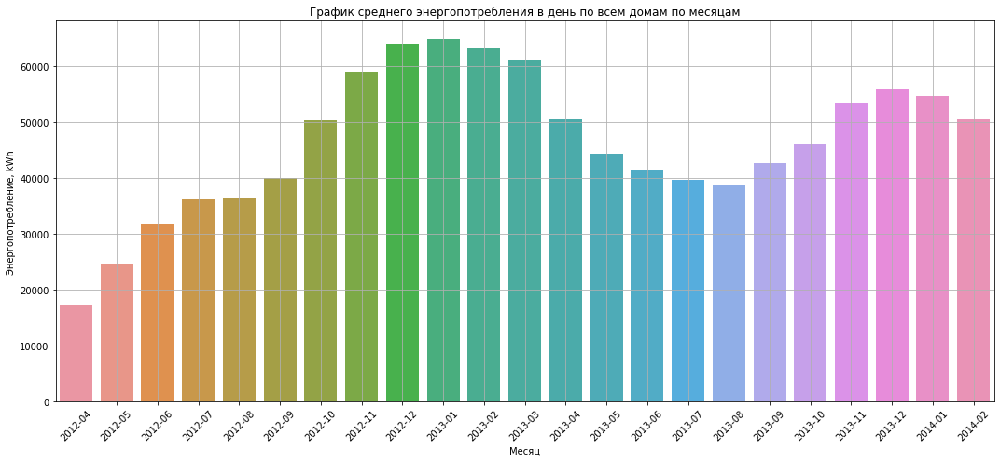

              energy_sum year_month
year month                         
2013 1      64885.158707    2013-01
2012 12     64021.441128    2012-12
2013 2      63282.506964    2013-02

              energy_sum year_month
year month                         
2013 8      38630.135806    2013-08
     7      39786.214032    2013-07
2012 9      39968.263667    2012-09


In [4]:
# блок grafic0.py

# чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))
# список столбцов для суммирования (имена домов)
name_cols = [name_col for name_col in energy_sum.columns.values if name_col.startswith('block_')]
# временный датафрейм с суммой потребления энергии по всем домам по дням
tmp_sum = pd.DataFrame(energy_sum[name_cols].sum(axis=1))
tmp_sum.columns = ['energy_sum']
# получение датафрейма с суммой потребления энергии
e_sum = pd.merge(energy_sum[['day', 'year', 'month']], tmp_sum, left_index=True, right_index=True)
# групировка по месяцам
tmp_sum = e_sum.groupby(['year', 'month']).mean()
# добавление графы год-месяц
for ind in tmp_sum.index:
    tmp_sum.loc[ind, 'year_month'] = str(ind[0]) + '-' + str(ind[1]).rjust(2, '0')
# отображение графика
fig, ax = plt.subplots(figsize=(15, 7))
ax.set_title(u'График среднего энергопотребления в день по всем домам по месяцам')
# закомментарил штатное рисование
# x = tmp_sum.year_month.to_list()
# y = tmp_sum.energy_sum.to_list()
# ax.plot(x, y)
sns.barplot(x='year_month', y='energy_sum', data=tmp_sum)
ax.grid()
plt.setp(ax.get_xticklabels(), rotation=45)
ax.set_xlabel(u'Месяц', fontsize=10)
ax.set_ylabel(u'Энергопотребление, kWh', fontsize=10)
fig.tight_layout()
# сохранение картинки
plt.savefig(os.path.join(path_dataset, 'png', '0_all_energy.png'))
plt.show()
# посмотим на наибольшие и наименьшие значения в диапазоне дат с корректными значениями
print(tmp_sum.query('year_month >= "2012-09"').sort_values(by='energy_sum', ascending=False).head(3))
print()
print(tmp_sum.query('year_month >= "2012-09"').sort_values(by='energy_sum', ascending=True).head(3))
# наибольшие периоды энергопотребления 2013-01 и 2012-12, наименьшие: 2013-08 и 2013-07

Как видно из графика: энергопотребление по данным до сентября 2012 года гораздо ниже аналогичных данных за 2013 год. Для дальнейших исследований возьмем период декабрь 2012 - январь 2014 и из него дополнительно исследуем месяцы с высоким (январь 2013) и низким (август 2013) энергопотреблением.

Исследование зависимости энергопотребления от температуры окружающей среды.

In [5]:
# зависимость энергопотребления от погодных условий, блок grafic1.py

sort_params = []  # список метеоусловий для отображения графиков: строится по матрице корреляции

# датафрейм с коэффициентами корреляции энергопотребления
df_corr_matrix = pd.DataFrame(columns=['param', 'moonPhase', 'bdate', 'edate', 'year_month', 
                                       'energy_sum', 'absv'])

def make_df(bdate, edate, show_result=1, make_all_corr=True, show_corr=False, make_df_corr=False,
            show_scatter=False, scatter_params=[], moonPhase='', df_sum=[]):
    # show_result=True - отображать коэффициенты корреляции на экране
    # show_corr=True - отображать Тепловуюя карту значений коэффициентов корреляции на экране
    # show_scatter=True - отображать распределения двух признаков
    # scatter_params=[] - список параметров для отображения распределения двух признаков [0] - с чем строить связь
    # make_all_corr=True - формировать файлы для отдельных коэффициентов корреляции
    # moonPhase = '' - префикс для обозначения, что отбор выполнен по переодам новолуния

    global sort_params      # глобальная переменная
    global df_corr_matrix   # глобальный датафрейм

    def sort_cor(dfc, name_col):
        # функция извлекает из корреляционной матрицы строку с одним параметром с отсортированными коэффициентами
        sr = pd.DataFrame(dfc[name_col])
        sr.drop([name_col], axis=0, inplace=True)  # удаление строки с самим собой
        if name_col != 'energy_sum':
            sr.drop(['energy_sum'], axis=0, inplace=True)  # удаление ненужной строки
        sr['absv'] = abs(sr[name_col])  # добавление колонки с абсолютным значением
        sr = sr.sort_values(by='absv', ascending=False)  # сортировка корреляционного коэффициента по убыванию
        sr.drop('absv', axis=1, inplace=True)
        return sr

    if len(df_sum):
        energy_sum = df_sum
    else:
        # чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
        energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))
    energy_sum = energy_sum.query('day >= @bdate & day < @edate')
    # список столбцов для суммирования (имена домов)
    name_cols = [name_col for name_col in energy_sum.columns.values if name_col.startswith('block_')]
    # временный датафрейм с суммой среднего потребления энергии по всем домам по дням
    tmp_sum = pd.DataFrame(energy_sum[name_cols].mean(axis=1))
    tmp_sum.columns = ['energy_sum']
    # получение датафрейма с суммой потребления энергии
    e_sum = pd.merge(energy_sum.day, tmp_sum, left_index=True, right_index=True)

    # чтение данных о погоде
    df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")
    # print(df_wd.columns.values)
    # print(df_wd.query('windBearing < 0 or windBearing > 360'))
    # замена стандартизованного словесного описания погодных условий на числовой эквивалент
    df_wd.icon = df_wd.icon.str.replace('-cloudy-', '-cloud-')
    list_icon = ['dummy', 'fog', 'wind', 'cloudy', 'partly-cloud-night', 'partly-cloud-day', 'clear-day']
    for num_icon in range(1, 7):
        df_wd.icon = df_wd.icon.str.replace(list_icon[num_icon], str(num_icon))
    df_wd.icon = pd.to_numeric(df_wd.icon, errors='coerce')
    # данные о погоде за выбранный период c необходимыми колонками
    # метеоусловия, которые могут влиять на энергопотребление
    name_cols = ['time', 'temperatureMax', 'temperatureMin', 'windBearing', 'windSpeed', 'humidity', 'uvIndex',
                 'cloudCover', 'pressure', 'sunriseTime', 'sunsetTime', 'visibility', 'dewPoint', 'moonPhase', 'icon']
    df_wd = df_wd.query('time >= @bdate & time < @edate')[name_cols]
    # в колонке 'day' оставить только дату и преобразовать в строку, т.к. все даты в датасете загружаются как строки
    df_wd['day'] = pd.to_datetime(df_wd.time).dt.strftime("%Y-%m-%d")
    # добавление колонки с номером дня недели
    df_wd['numday'] = pd.to_datetime(df_wd.time).dt.weekday + 1
    # вычисление длительности светового дня и удаление временных колонок
    df_wd['sethm'] = pd.to_datetime(df_wd.sunsetTime).dt.hour + pd.to_datetime(df_wd.sunsetTime).dt.minute / 60
    df_wd['risehm'] = pd.to_datetime(df_wd.sunriseTime).dt.hour + pd.to_datetime(df_wd.sunriseTime).dt.minute / 60
    df_wd['daylight'] = df_wd.sethm - df_wd.risehm
    df_wd.drop(['sethm', 'risehm'], axis=1, inplace=True)
    # объединение датафреймов погоды и потребления энергии
    df_e = pd.merge(df_wd, e_sum, on='day', how='inner')
    df_e = df_e.sort_values(by='day')
    # расчет средней температуры за день на копии датафрейма
    df_ec = df_e.copy(deep=True)
    df_ec['temperature'] = (df_ec.temperatureMin + df_ec.temperatureMax) / 2
    df_ec.drop(['temperatureMin', 'temperatureMax'], axis=1, inplace=True)
    # построение корреляционной матрицы
    dfc = df_ec.corr().fillna(0).round(2)
    #
    if show_corr:
        # просмотр Тепловая карта значений коэффициентов корреляции
        fig, ax = plt.subplots(figsize=(14, 8))
        ax.set_title(u'Тепловая карта значений коэффициентов корреляции за период {} - {}'.format(bdate, edate))
        sns.heatmap(dfc, annot=True, cmap='coolwarm')
        fig.tight_layout()
        # сохранение картинки
        plt.savefig(os.path.join(path_dataset, 'png', f'1_hm{moonPhase}_cor_{bdate}_{edate}.png'))
        plt.show()
    #
    # сохранение в файл
    dfc.to_csv(os.path.join(path_dataset, 'export', f'e{moonPhase}_corr_{bdate}_{edate}.csv'))
    # посмотрим на влияние мереоусловий на энергопотребление
    sr = sort_cor(dfc, 'energy_sum')
    # список метеоусловий для отображения графиков
    sort_params = list(sr.index)
    if show_result: print('Коэффициенты корреляции для метеоусловий, влияющих на энергопотребление:\n', sr, '\n')
    # сохранение в файл датафрейма с коэффициентами влияющими на энергопотребление
    list_corr = pd.DataFrame(sr)
    list_corr.to_csv(os.path.join(path_dataset, 'export', f'f{moonPhase}_corr_{bdate}_{edate}.csv'))
    #
    if make_df_corr:
        # заполнение датафрейма с корреляционными коэффициентами для энергопотребления
        list_corr['absv'] = np.abs(list_corr.energy_sum)  # добавление колонки с абсолютным значением
        list_corr['param'] = list_corr.index
        list_corr['moonPhase'] = moonPhase
        list_corr['bdate'] = bdate
        list_corr['edate'] = edate
        list_corr['year_month'] = pd.to_datetime(bdate, format='%Y-%m-%d')
        list_corr['year_month'] = list_corr.year_month.dt.strftime('%Y-%m')
        df_corr_matrix = df_corr_matrix.append(list_corr, ignore_index=True, sort=False)
    #
    # список Коэффициентов для метеоусловий, влияющих на энергопотребление
    list_corr = dict()
    list_corr[sr.columns.values[0]] = sr
    if show_result == 2: print('Взаимозависимости факторов метеоусловий:\n')
    # посмотрим как взаимосвязаны между собой факторы метеоусловий
    for name_col in sort_params:
        sr = sort_cor(dfc, name_col)
        if show_result == 2: print(sr.T, '\n')
        list_corr[sr.columns.values[0]] = sr
    # запись в текстовый файл Коэффициентов для метеоусловий, влияющих на энергопотребление
    if make_all_corr:
        with open(os.path.join(path_dataset, 'export', f'e{moonPhase}_corr_{bdate}_{edate}.txt'), 'w') as ouf:
            for srt in list_corr.values():
                ouf.write(str(srt) + '\n')
    #
    if show_scatter:
        # просмотр взаимосвязи значений коэффициентов корреляции
        if not len(scatter_params):
            # если параметры не заданы - выводим по умолчанию взамосвязи энергопотребления с другими парамметрами
            scatter_params = ['energy_sum']
        if scatter_params[0] != 'inplace':              # если 'inplace' - выводим картинки для всех параметров
            # выбор нужного датафрейма из словаря
            sr = list_corr[scatter_params[0]]
            if len(scatter_params) > 1:
                # если есть список отображаемых параметров - то оставляем только их
                sr['idx'] = sr.index
                sr = pd.DataFrame(sr.loc[sr.idx.isin(scatter_params[1:]), scatter_params[0]])
            list_corr.clear()
            list_corr[sr.columns.values[0]] = sr
        # проходимся по словарю с датафреймами или только по одному заказанному
        for key, val in list_corr.items():
            if scatter_params[0] == 'inplace' and key == 'energy_sum': continue # выводим все, кроме энергопотребления
            main_param = [key]
            scatter_params = val.index.to_list()
            rows = len(scatter_params) // 4
            if len(scatter_params) > 4:
                cols = 4
            else:
                cols = len(scatter_params)
            for row in range(rows):
                fig = sns.pairplot(df_ec, y_vars=main_param, x_vars=scatter_params[cols*row:cols*row+cols],
                                   height=3.3, kind="reg")
                fig.map(sns.regplot)
                # сохранение картинки
                name_file_png = f'1_scat_{main_param[0]}_{row}{moonPhase}_cor_{bdate}_{edate}.png'
                plt.savefig(os.path.join(path_dataset, 'png', name_file_png))
                plt.show()
    #
    # удаление из списка метеоусловий лишних значений и добавление для ветра, т.к. он отображается на одном графике
    i = int(min(sort_params.index('windBearing'), sort_params.index('windSpeed')))
    sort_params.insert(i, 'wind')
    rmv_list = ['windBearing', 'windSpeed']
    for rmv in rmv_list:
        sort_params.remove(rmv)
    return df_e



def show_grafic(bdate, edate, df_e, show_parametr='temperature', idx_parametr=0):
    # функция отображает графики - параметр метеоусловий и энергопотребления
    # idx_parametr= - индекс отображаемого параметра в матрице корреляции, меньше - выше вес
    # преобразование направления ветра
    # северный ветер имеет максимальный вес, южный - минимальный
    koeff = 180 / ceil(df_e.windSpeed.max())
    df_e['wind'] = np.abs(df_e.windBearing - 180) / koeff
    # отображение графика
    fig = plt.figure(figsize=(15, 9))
    ax1 = fig.add_subplot(111)
    cg = ['b', 'r', 'g']
    nf = ['t Минимальная', 't Maксимальная', 'Энергопотребление']
    pn = {'temperature': 'Температура', 'wind': 'Скорость ветра / Направление ветра', 'cloudCover': 'Облачность',
          'uvIndex': 'UV-индекс', 'humidity': 'Относительная влажность', 'dewPoint': 'Точка росы',
          'moonPhase': 'фаза луны', 'pressure': 'атмосферное давление', 'daylight': 'Световой день (в часах)',
          'sunriseTime': 'время восхода', 'sunsetTime': 'время заката', 'visibility': 'видимость (в милях)',
          'numday': 'День недели', 'icon': 'погодные условия'}
    x = df_e.day.to_list()
    y_sum_e = df_e.energy_sum.to_list()
    begin_n = 0
    if show_parametr == 'temperature':
        y_min_t = df_e.temperatureMin.to_list()
        y_max_t = df_e.temperatureMax.to_list()
        ax1.set_title(u'График минимальной и максимальной температуры / Энергопотребление')
    elif show_parametr == 'wind':
        y_min_t = df_e.windSpeed.to_list()
        y_max_t = df_e.wind.to_list()
        ax1.set_title(u'График: Скорость и Направление ветра / Энергопотребление')
        ax1.axhline(y=90 / koeff, color='r', linewidth=0.8)  # линия между югом и севером
        nf = ['Скорость ветра', 'Направление (север вверху)', 'Энергопотребление']
    else:
        y_min_t = df_e[show_parametr].to_list()
        y_max_t = y_min_t
        begin_n = 1
        ax1.set_title(u'График: {} / Энергопотребление'.format(pn[show_parametr]))
        nf.pop(1)
        nf.insert(1, pn[show_parametr])
    lines = []
    # установка лимитов по оси Y
    if show_parametr == 'wind':
        min_y = 0
    else:
        min_y = min(y_min_t)
        min_y = min_y * 1.1 if min_y < 0 else min_y * 0.9
    ax1.set_ylim(min_y, max(y_max_t) * 1.2)
    # отображение графиков
    for n in range(begin_n, 3):
        if n == 2:
            y = y_sum_e
            # разделим ось Х с другим графиком
            ax2 = ax1.twinx()
            line, = ax2.plot(x, y, cg[n])
        elif n == 1:
            y = y_max_t
            line, = ax1.plot(x, y, cg[n])
        else:
            y = y_min_t
            line, = ax1.plot(x, y, cg[n])
        lines.append(line)
    if len(lines) < 3: nf.pop(0)
    ax1.set_xlabel(u'Дата', fontsize=10)
    ax1.set_ylabel(u'{}'.format(pn[show_parametr]), fontsize=12)
    ax2.set_ylabel(u'Энергопотребление, kВт/Ч', fontsize=14, color=cg[2])
    ax1.grid()
    # отображение легенды
    if bdate < '2013-07-07':
        plt.legend(lines, nf, loc='upper left', shadow=True)
    else:
        plt.legend(lines, nf, loc='upper right', shadow=True)
    # отображение меток оси Х
    ax1.set_xticklabels(x, rotation=45, ha="right", fontsize=7)
    # задание цвета выходных дней
    color_weekends = 'deeppink'
    # список цветов для отображения рабочих/выходных дней
    colors = [color_weekends if d in parsing_dates(bdate, edate, 'weekends') else 'k' for d in x]
    # расцвечивание дат
    for xtick, color in zip(ax1.get_xticklabels(), colors):
        xtick.set_color(color)
        if color == color_weekends:
            ax1.axvline(x=xtick.get_text(), color=color_weekends, linewidth=0.5)
    # сохранение картинки
    idx_parametr = f'{str(idx_parametr).rjust(2,"0")}_' if idx_parametr else ''
    plt.savefig(os.path.join(path_dataset, 'png', f'1_{x[0]}_{idx_parametr}{show_parametr}.png'))
    plt.show()

Построим матрицу корреляции на периоде корректных данных.

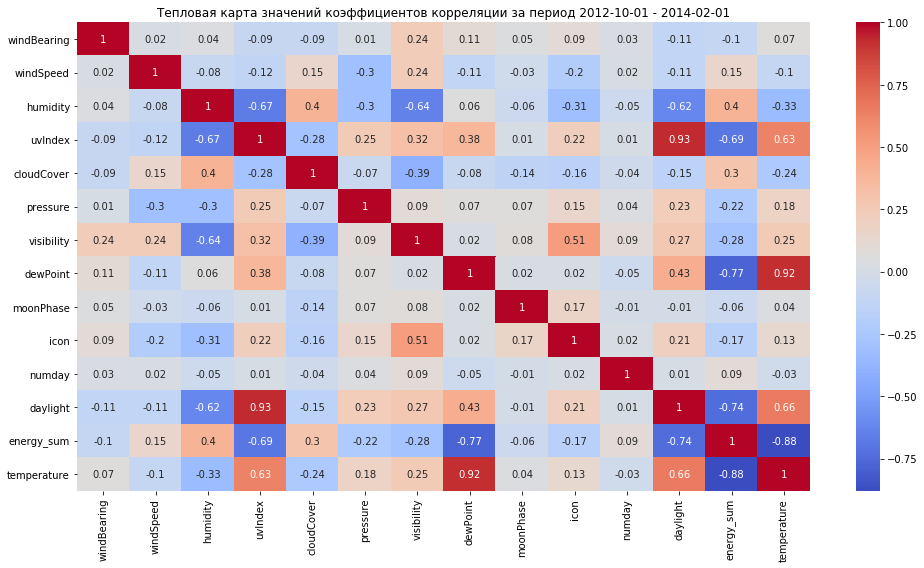

Коэффициенты корреляции для метеоусловий, влияющих на энергопотребление:
              energy_sum
temperature       -0.88
dewPoint          -0.77
daylight          -0.74
uvIndex           -0.69
humidity           0.40
cloudCover         0.30
visibility        -0.28
pressure          -0.22
icon              -0.17
windSpeed          0.15
windBearing       -0.10
numday             0.09
moonPhase         -0.06 



In [6]:
# период отбора данных
bdate = "2012-10-01"
edate = "2014-02-01"
df_e = make_df(bdate, edate, make_all_corr=False, show_corr=True)
# из PyCharm картинка получается необрезанная

Интерпретация значений коэффициента корреляции:

    Значение	Интерпретация

    до 0,2	    Очень слабая
    до 0,5	    Слабая
    до 0,7	    Средняя
    до 0,9	    Высокая
    свыше 0,9	 Очень высокая корреляция

Чем ближе корреляция к -1 или 1, тем сильнее связь между переменными. При нулевом значении (или близким к 0) значимая связь между 2-мя переменными отсутствует или очень минимальна.
Корреляция — степень связи между 2-мя или несколькими независимыми явлениями.

Корреляция бывает положительной и отрицательной.

Положительная корреляция (прямая) возникает при одновременном изменении 2-х переменных величин в одинаковых направлениях (в положительном или отрицательном). Например, взаимосвязь между скоростью северного ветра и энергопотреблением: чем выше скорость ветра, тем больше энергопотребление.

Корреляция отрицательна (обратная), если изменение одной величины приводит противоположному изменению другой. Например, с увеличением увеличением температуры окружающей среды - уменьшается энергопотребление.

Посмотрим на взаимосвязи значений коэффициентов корреляции и энергопотребления (в отчете их нужно описать и про связи метеоусловий между собой, но для конкретных периодов энергопотребления)

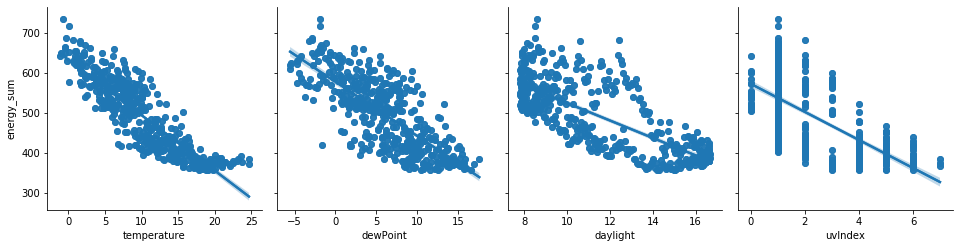

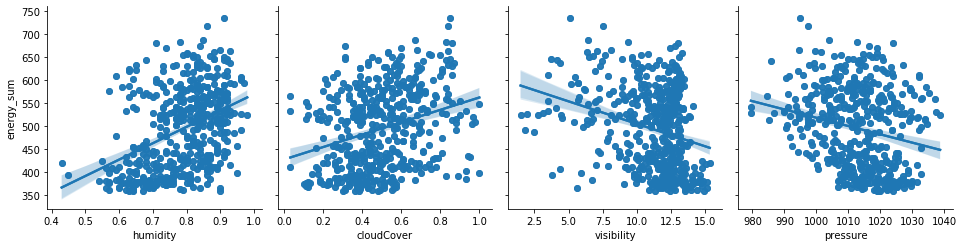

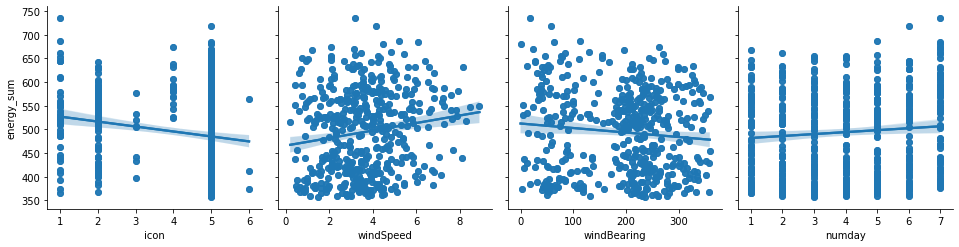

In [7]:
df_e = make_df(bdate, edate, show_result=0, make_all_corr=False, show_corr=False, show_scatter=True)

Посмотрим на Коэффициенты корреляции для месяца с самым высоким энергопотреблением

In [8]:
# период отбора данных: месяц с высоким (январь) энергопотреблением
bdate = "2013-01-01"
edate = "2013-02-01"
# подготовка датафрейма с данными
df_e = make_df(bdate, edate)

Коэффициенты корреляции для метеоусловий, влияющих на энергопотребление:
              energy_sum
temperature       -0.85
dewPoint          -0.84
windBearing       -0.75
moonPhase         -0.74
pressure          -0.61
visibility        -0.46
numday             0.32
windSpeed         -0.25
cloudCover         0.22
daylight           0.21
icon              -0.15
humidity          -0.09
uvIndex            0.00 



Неожиданно выяснилось, что фаза луны имеет высокий коэффициент корреляции с энергопотреблением. Построим сравнительную таблицу влияния метеоусловий для календарного месяца и периода между двумя новолуниями.

In [9]:
# объединение текстовых файлов c матрицами корреляции в один файл: блок my_agr_corr.py

# датафрейм с коэффициентами корреляции энергопотребления
df_corr_matrix = pd.DataFrame(columns=['param', 'moonPhase', 'bdate', 'edate', 'year_month', 
                                       'energy_sum', 'absv'])

def agr_corr_matrix(moonPhase=''):
    # объединение текстовых файлов c матрицами корреляции в один файл
    dir_files = os.listdir(os.path.join(path_dataset, 'export'))
    for type_file in ['e', 'f']:
        # удаление существующего файла
        file_out = os.path.join(path_dataset, 'export', f'{type_file}{moonPhase}_corr_all.csv')
        try:
            os.remove(file_out)
        except OSError:
            pass
        for file in dir_files:
            if file.endswith('.csv') and file.startswith(f'{type_file}{moonPhase}_corr_20'):
                # выделение периода из имени файла
                name_file = file.split('.')[0].split('_')
                name_month = name_file[-2] + ' - '  + name_file[-1]
                with open(file_out, 'a') as of:
                    if type_file == 'e':
                        of.write(f',Матрица корреляции за период {name_month} \n, \n')
                    else:
                        of.write(f'Коэффициенты,период {name_month}\n')
                    with open(os.path.join(path_dataset, 'export', file), 'r') as fin:
                        of.write(fin.read())
                    of.write(', \n')


# формирование матриц корреляции за каждый месяц за период 2012-11-01 - 2014-03-01
dt = datetime(2012, 12, 1)
while dt < datetime(2014, 2, 2):
    bdate = dt.strftime('%Y-%m-%d')
    days_in_month = calendar.monthrange(dt.year, dt.month)[1]
    dt += timedelta(days=days_in_month)
    edate = dt.strftime('%Y-%m-%d')
    make_df(bdate, edate, show_result=False, make_all_corr=False)
# объединение текстовых файлов c матрицами корреляции в один файл
agr_corr_matrix()


# посмотрим на взаимосвязь метеофакторов и энергопотребления между периодами новолуния
#
# чтение данных о погоде для формирования списка дат новолуний
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")
df = df_wd.query('moonPhase < 0.1 or moonPhase > 0.9')[['time', 'moonPhase']].sort_values(by='time')
df['day'] = pd.to_datetime(df.time).dt.date
df.to_csv(os.path.join(path_dataset, 'moonPhase.csv'), index=False)
df = pd.read_csv(os.path.join(path_dataset, 'moonPhase.csv'), encoding="cp1252")
# list_moonPhase = []
# for ind in df.index:
#     if ind < len(df) - 1:
#         if df.loc[ind, 'moonPhase'] > df.loc[ind + 1, 'moonPhase']:
#             list_moonPhase.append(df.loc[ind + 1, 'day'])
# если фаза луны текущей даты меньше фазы луны предыдущей даты, значит случилось новолуние
list_moonPhase = df[df.moonPhase < df.moonPhase.shift()].day.to_list()
df = pd.DataFrame(list_moonPhase)
df.columns = ['day']
df = df.sort_values(by='day')
df.to_csv(os.path.join(path_dataset, 'moonPhase.csv'), index=False)
list_moonPhase = df.query('day > "2012-12-01" and day < "2014-02-02"').day.to_list()
list_moonPhase.remove('2014-01-31')
list_moonPhase.append('2014-02-01')
list_moonPhase = sorted(list_moonPhase)
print('Список дат новолуний:')
print(list_moonPhase)

# формирование матриц корреляции за каждый период новолуния
for i in range(len(list_moonPhase) - 1):
    bdate = list_moonPhase[i]
    edate = list_moonPhase[i + 1]
    # b = datetime.strptime(bdate, "%Y-%m-%d")
    # e = datetime.strptime(edate, "%Y-%m-%d")
    # print(f'Период: {bdate} - {edate}, кол-во дней {(e-b).days}')
    make_df(bdate, edate, show_result=False, make_all_corr=False, moonPhase='_mp')
# объединение текстовых файлов c матрицами корреляции в один файл
agr_corr_matrix(moonPhase='_mp')

Список дат новолуний:
['2012-12-13', '2013-01-12', '2013-02-10', '2013-03-12', '2013-04-09', '2013-05-09', '2013-06-08', '2013-07-07', '2013-08-06', '2013-09-05', '2013-10-04', '2013-11-03', '2013-12-03', '2014-01-01', '2014-02-01']


Сравнение влияния фазы луны на энергопотребления показало, что для календарного месяца влияние фазы луны меньше, чем в период между двумя новолуниями (в декабре 2012 года новолоние приходится почти на середину месяца и к январю 2014 года эти периоды совпадают). Табличную форму вставить в отчет. Графики коэффициентов корреляции энергопотребления и метеоусловий сформированы ниже.

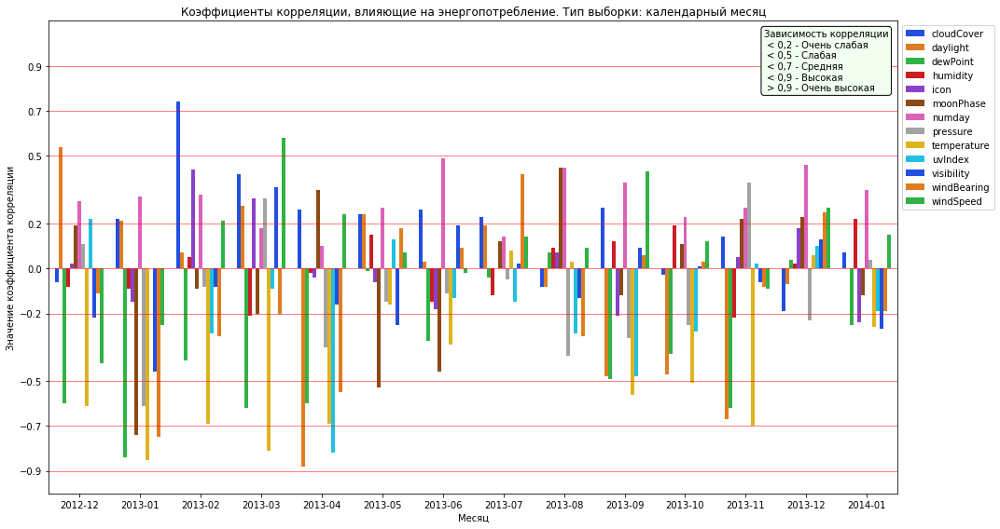

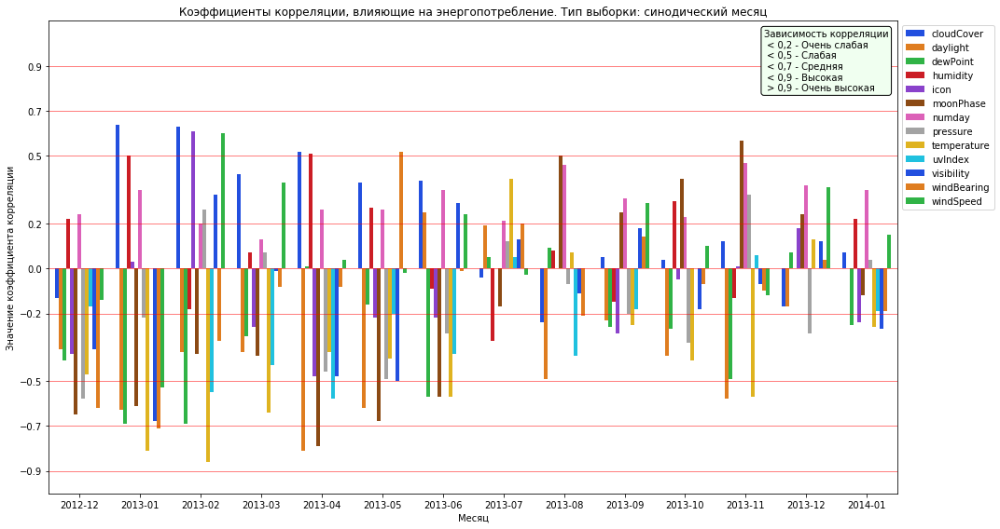

In [10]:
# построение графиков за достоверный период для коэффициентов корреляции энергопотребления 
# и метеоусловий: блок make_df_corr.py (есть в конце блока grafic1.py) 
#
# формирование матриц корреляции за каждый месяц за период 2012-11-01 - 2014-02-01: блок make_df_corr.py
dt = datetime(2012, 12, 1)
while dt < datetime(2014, 1, 2):
    bdate = dt.strftime('%Y-%m-%d')
    days_in_month = calendar.monthrange(dt.year, dt.month)[1]
    dt += timedelta(days=days_in_month)
    edate = dt.strftime('%Y-%m-%d')
    make_df(bdate, edate, show_result=False, make_all_corr=False, make_df_corr=True)

list_moonPhase = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-03-12', '2013-04-09', '2013-05-09',
                  '2013-06-08', '2013-07-07', '2013-08-06', '2013-09-05', '2013-10-04', '2013-11-03', '2013-12-03',
                  '2014-01-01', '2014-02-01']
# формирование матриц корреляции за каждый период новолуния (синодический месяц)
for i in range(len(list_moonPhase) - 1):
    bdate = list_moonPhase[i]
    edate = list_moonPhase[i + 1]
    make_df(bdate, edate, show_result=False, make_all_corr=False, make_df_corr=True, moonPhase='_mp')


# построение графиков за достоверный период для коэффициентов корреляции энергопотребления
# и метеоусловий:
#
box_1 = {'facecolor': 'honeydew',  # цвет области
         'boxstyle': 'round'}      # стиль области
box_t = '''Зависимость корреляции
 < 0,2 - Очень слабая
 < 0,5 - Слабая
 < 0,7 - Средняя
 < 0,9 - Высокая
 > 0,9 - Очень высокая'''
type_mn = ['календарный', 'синодический']
moon_ph = ['', '_mp']
df_corr_matrix = df_corr_matrix.sort_values(by=['year_month', 'param'])
for knd in range(2):
    fig, ax = plt.subplots(figsize=(15, 8))
    ax.set_title(u'Коэффициенты корреляции, влияющие на энергопотребление. Тип выборки: {} месяц'.format(type_mn[knd]))
    mph = moon_ph[knd]
    sns.barplot(x='year_month', y='energy_sum', hue='param', 
                data=df_corr_matrix.query('moonPhase == @mph'), palette="bright")
    ax.set_ylim(-1, 1.1)
    ytick = [-0.9, -0.7, -0.5, -0.2, 0, 0.2, 0.5, 0.7, 0.9]
    for yh in ytick: ax.axhline(y=yh, color='r', linewidth=0.5)
    plt.yticks(ytick)
    plt.xlabel(u'Месяц')
    plt.ylabel(u'Значение коэффициента корреляции')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    ax.text(11.3, 0.79, box_t, bbox=box_1, color='black', fontsize=10)
    fig.tight_layout()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'0_{bdate}_{edate}{moon_ph[knd]}.png'))
    plt.show()


Для дальнейших исследований возъмем по 2 лунных периода в месяцах с наибольшим и наименьшим энергопотреблением. Это '2012-12-13 - 2013-01-12 - 2013-02-10' и '2013-07-07 - 2013-08-06 - 2013-09-05'.
Посмотрим на коэффициенты корреляции метеоусловий с энергопотреблением и графики зависимости энергопотребления от метеоусловий. Графики отображаются в порядке убывания коэффициентов корреляции, влияющих на энергопотребление. Выходные дни и праздники на графиках выделены красным цветом.

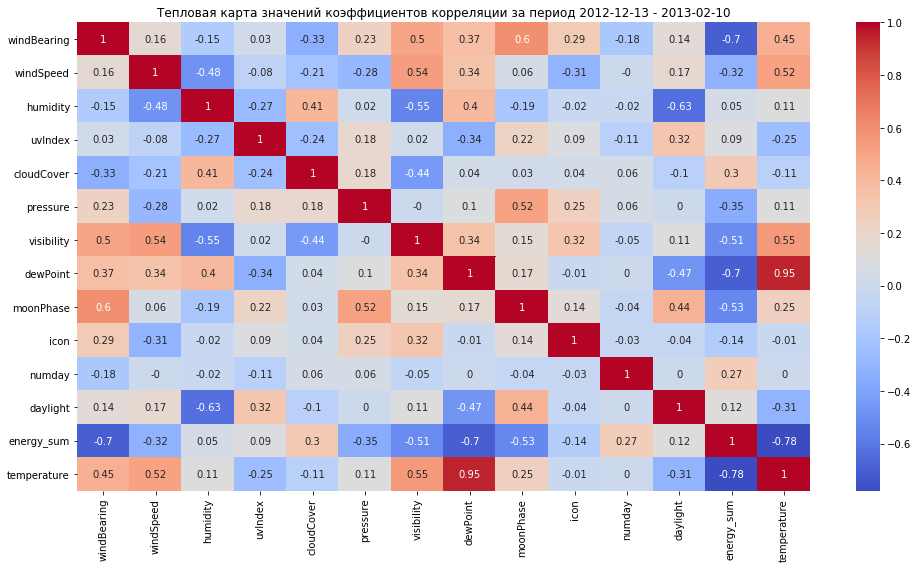

Коэффициенты корреляции для метеоусловий, влияющих на энергопотребление:
              energy_sum
temperature       -0.78
windBearing       -0.70
dewPoint          -0.70
moonPhase         -0.53
visibility        -0.51
pressure          -0.35
windSpeed         -0.32
cloudCover         0.30
numday             0.27
icon              -0.14
daylight           0.12
uvIndex            0.09
humidity           0.05 

Взаимозависимости факторов метеоусловий:

             dewPoint  visibility  windSpeed  windBearing  daylight  uvIndex  \
temperature      0.95        0.55       0.52         0.45     -0.31    -0.25   

             moonPhase  humidity  cloudCover  pressure  icon  numday  
temperature       0.25      0.11       -0.11      0.11 -0.01     0.0   

             moonPhase  visibility  temperature  dewPoint  cloudCover  icon  \
windBearing        0.6         0.5         0.45      0.37       -0.33  0.29   

             pressure  numday  windSpeed  humidity  daylight  uvIndex  
windBearin

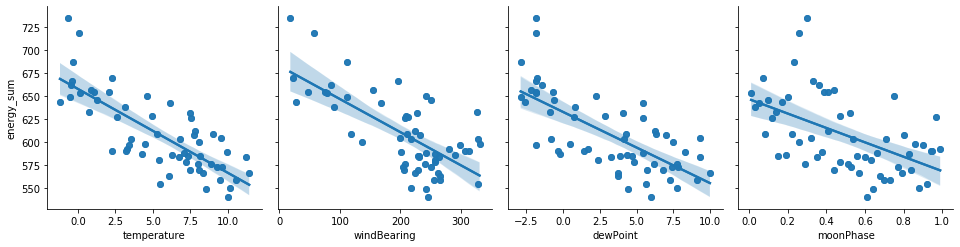

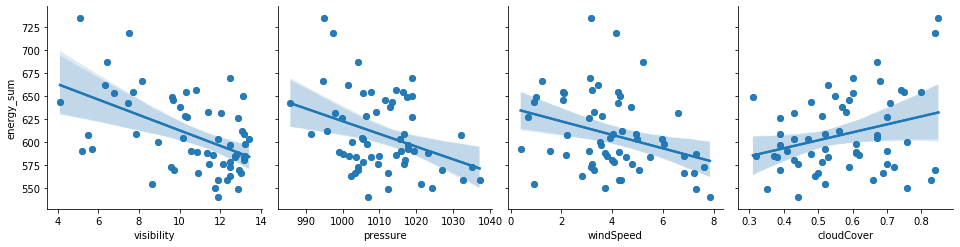

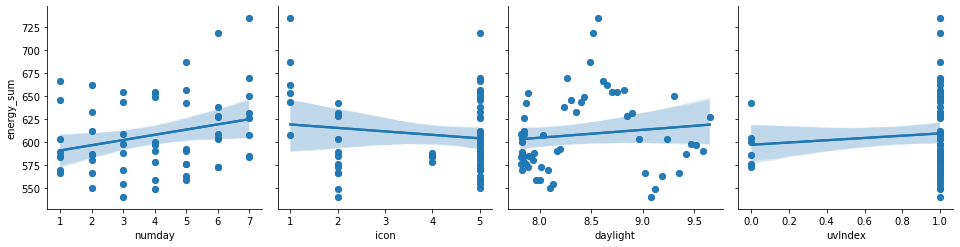

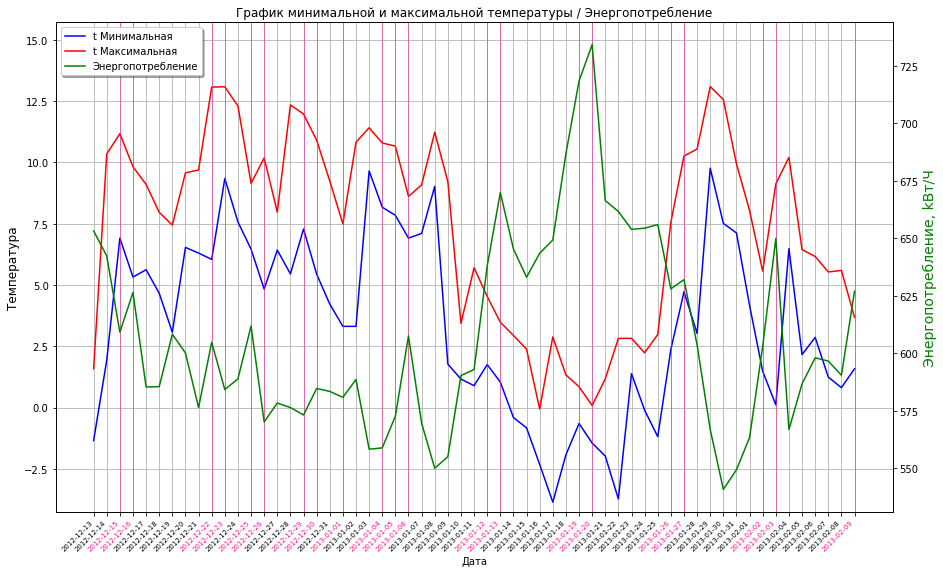

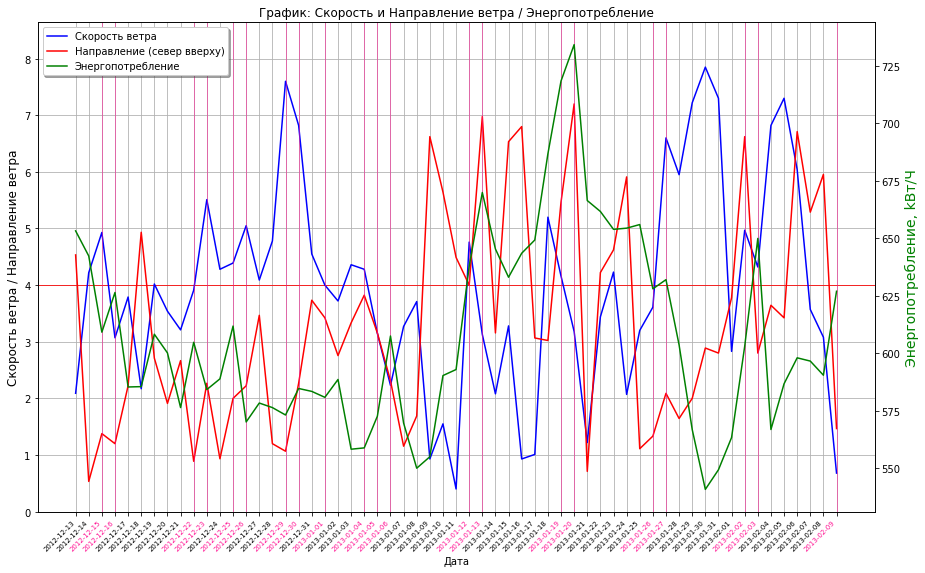

...

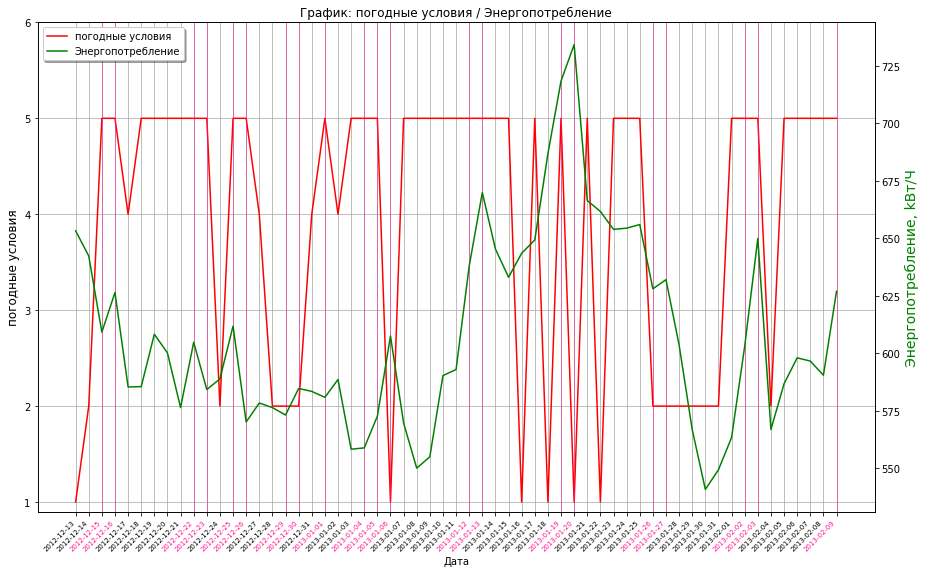

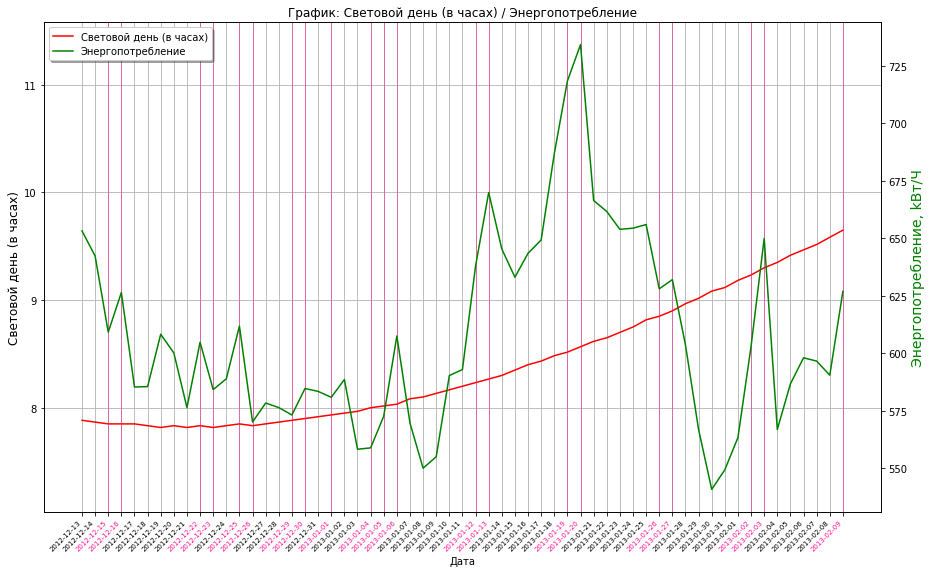

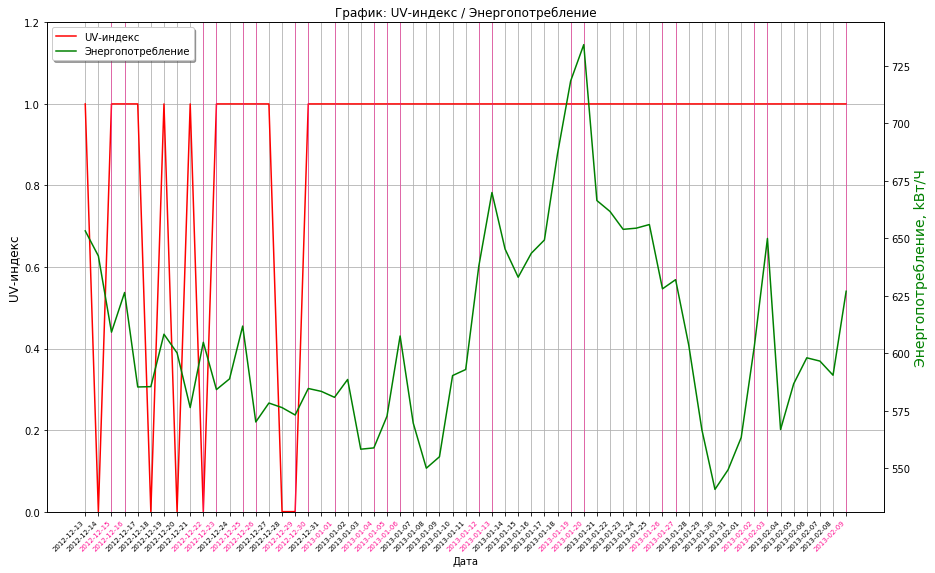

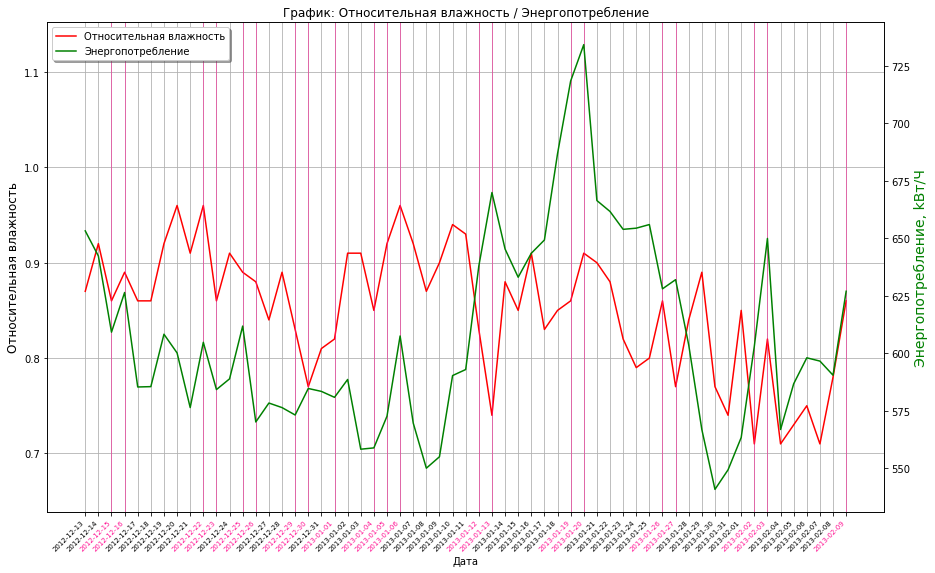

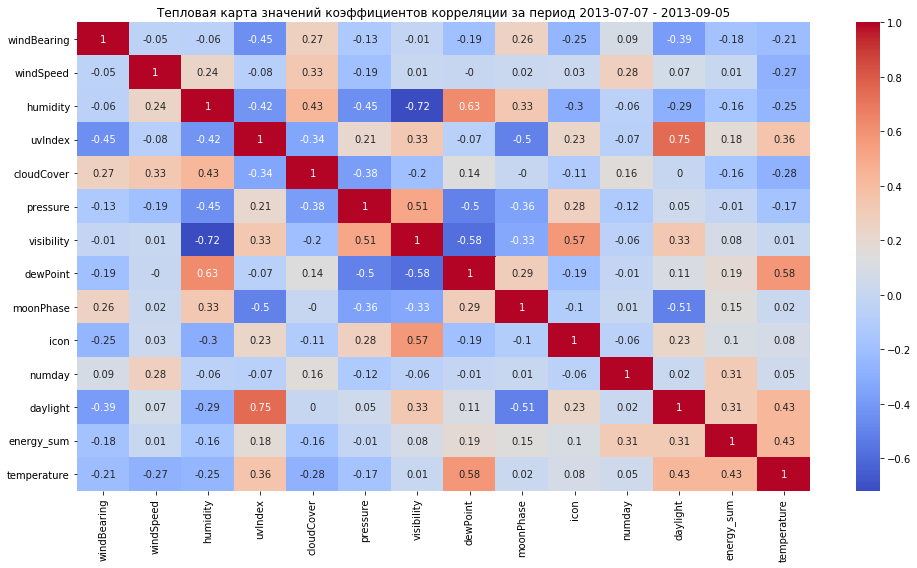

Коэффициенты корреляции для метеоусловий, влияющих на энергопотребление:
              energy_sum
temperature        0.43
numday             0.31
daylight           0.31
dewPoint           0.19
windBearing       -0.18
uvIndex            0.18
humidity          -0.16
cloudCover        -0.16
moonPhase          0.15
icon               0.10
visibility         0.08
windSpeed          0.01
pressure          -0.01 

Взаимозависимости факторов метеоусловий:

             dewPoint  daylight  uvIndex  cloudCover  windSpeed  humidity  \
temperature      0.58      0.43     0.36       -0.28      -0.27     -0.25   

             windBearing  pressure  icon  numday  moonPhase  visibility  
temperature        -0.21     -0.17  0.08    0.05       0.02        0.01   

        windSpeed  cloudCover  pressure  windBearing  uvIndex  humidity  \
numday       0.28        0.16     -0.12         0.09    -0.07     -0.06   

        visibility  icon  temperature  daylight  dewPoint  moonPhase  
numday       -0.06 

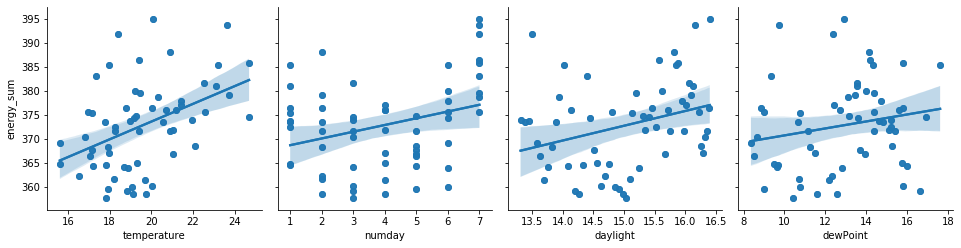

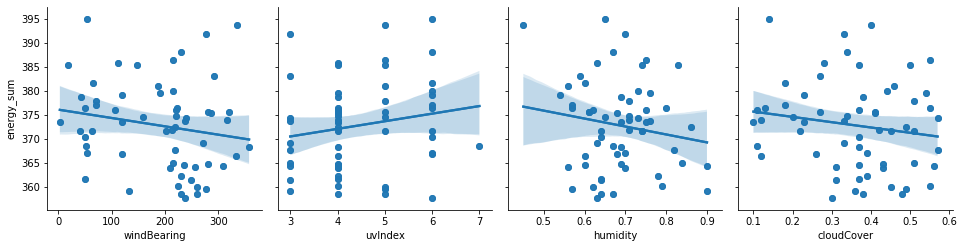

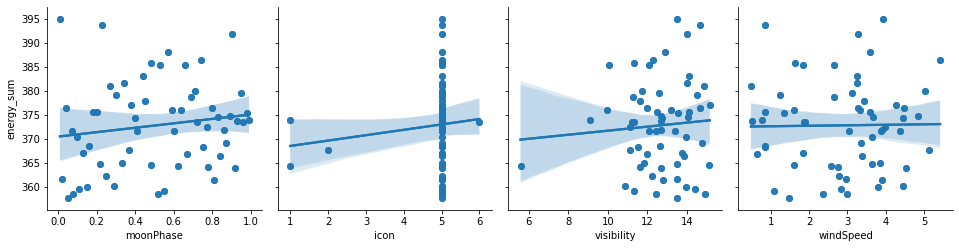

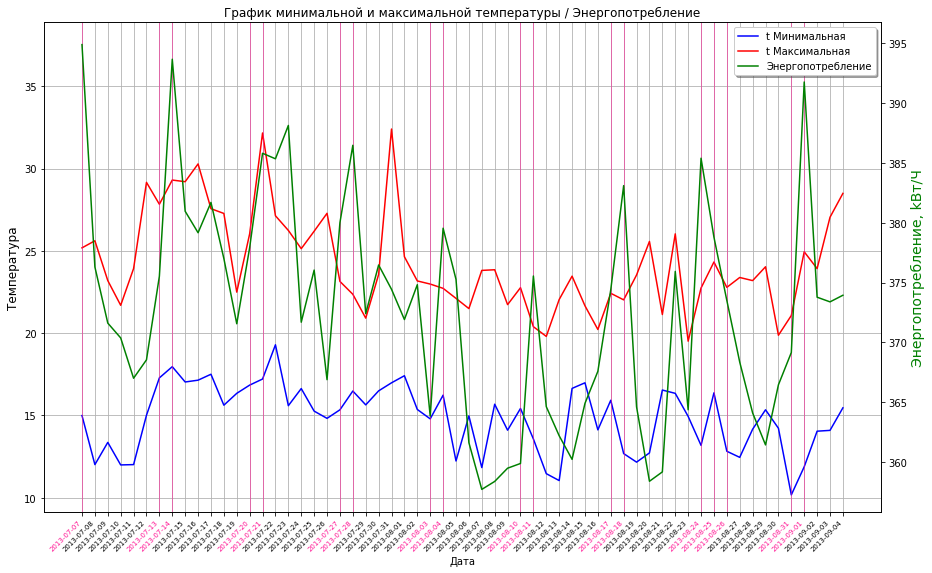

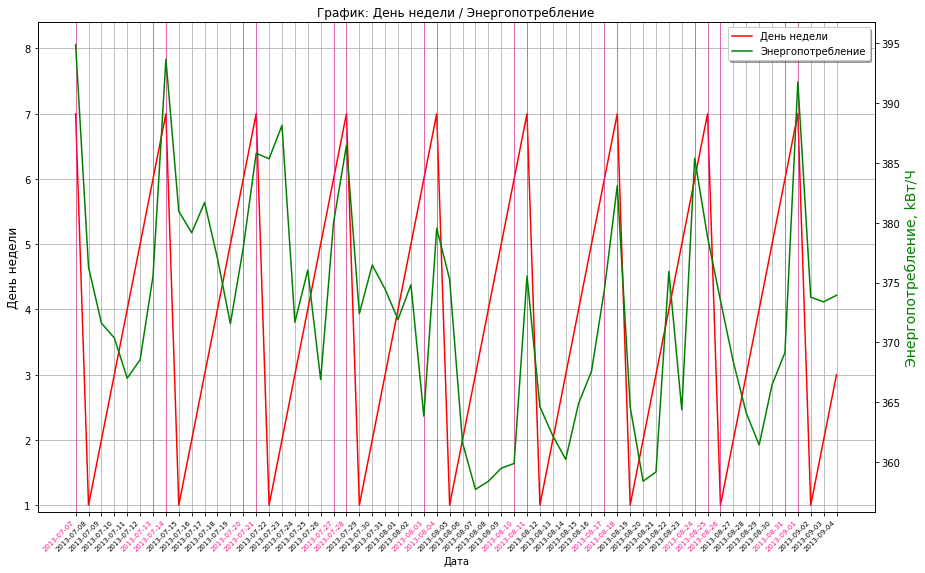

...

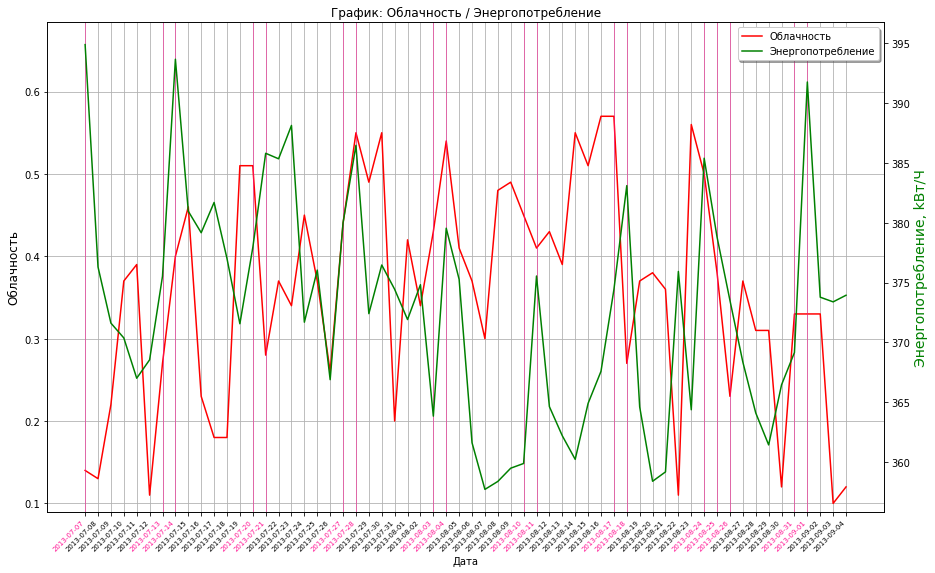

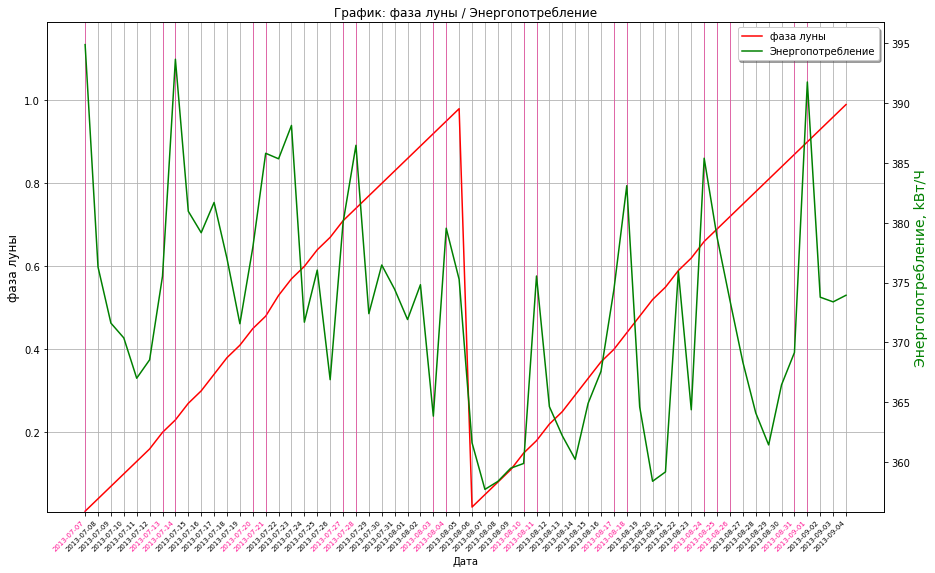

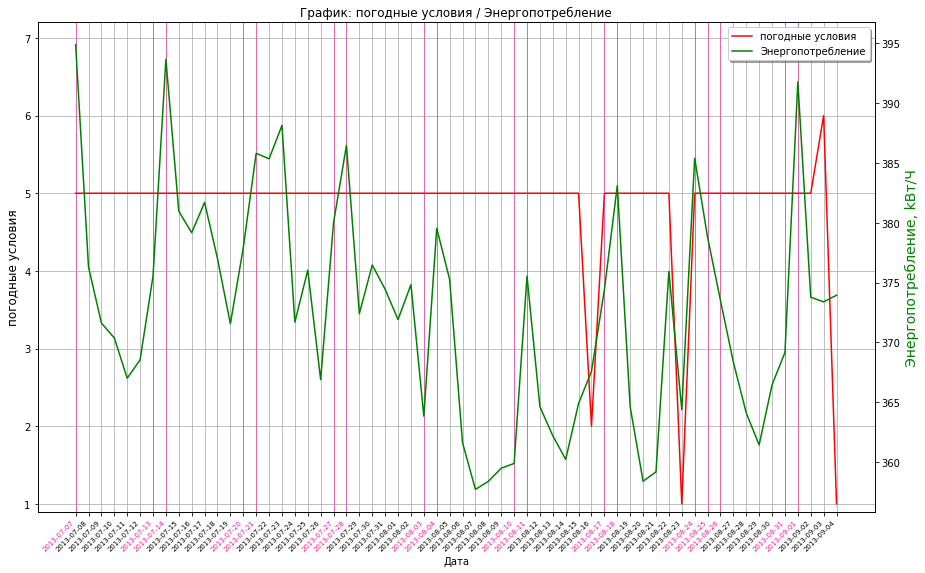

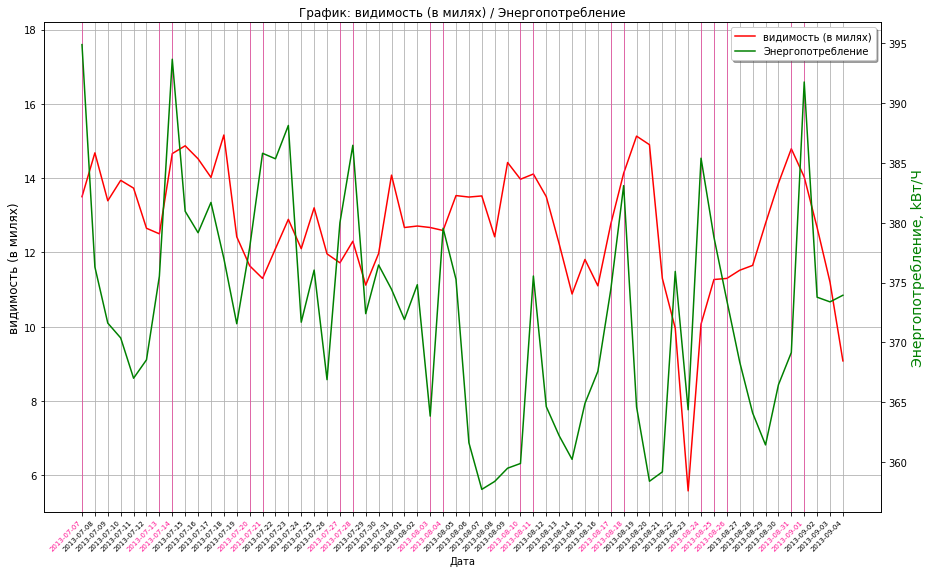

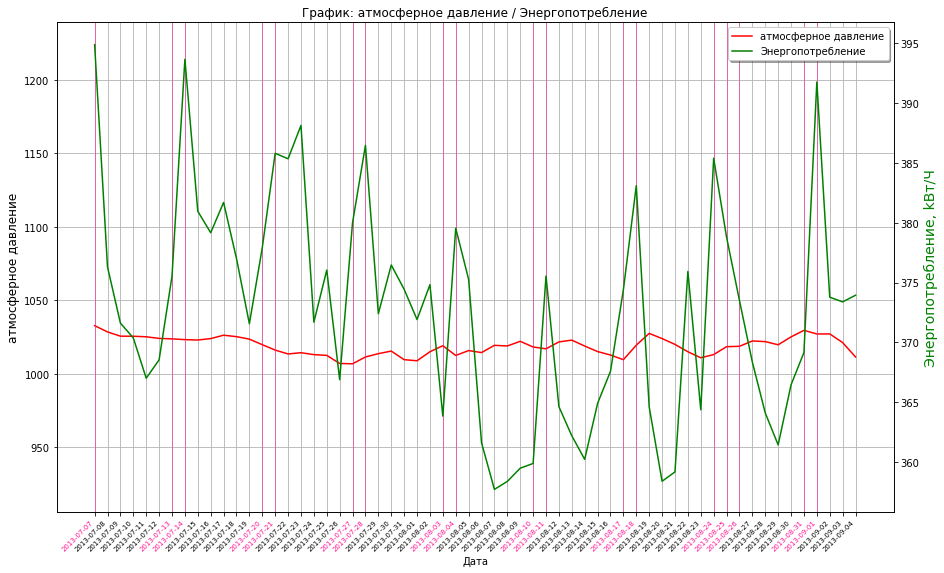

In [14]:
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
for i in range(2):
    # i = 0 период отбора данных с высоким энергопотреблением (возьмем 2 периода цикла луны)
    # i = 1 период отбора данных с низким энергопотреблением (возьмем 2 периода цикла луны)
    bdate = periodsr[3 * i]
    edate = periodsr[3 * i + 2]
    df_e = make_df(bdate, edate, show_result=2, show_corr=True, show_scatter=True)
    for name_param in sort_params:
        show_grafic(bdate, edate, df_e, show_parametr=name_param, idx_parametr=sort_params.index(name_param)+1)

Исследования графиков в зимний период показали высокую отрицательную зависимость энергопотребления от температуры (при уменьшении температуры возрастает энергопотребление), среднюю отрицательную степень (граничащую с высокой) зависимости от направления ветра и точки росы (при северном  ветре возрастает энергопотребление), среднюю отрицательную зависимость от фазы луны и видимости. Слабую отрицательную зависимость от давления и скорости ветра. Слабую положительную зависимость от облачности и дня недели. Остальные параметры метеоусловий имеют очень слабое влияние на энергопотребление. 
В летний период исследования графиков показали слабую положительную зависимость энергопотребления от температуры (при увеличении температуры в теплый период возрастает энергопотребление), дня недели и длительности светового дня. Остальные параметры метеоусловий имеют очень слабое влияние на энергопотребление. 

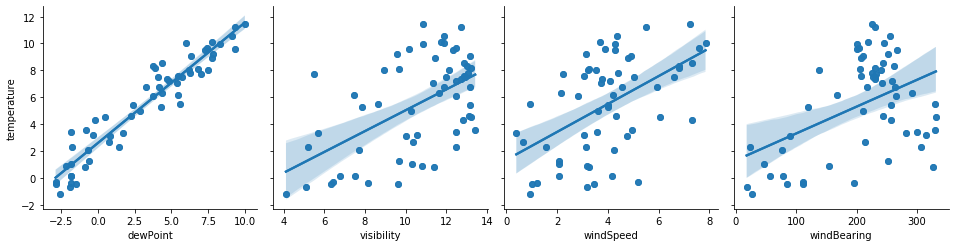

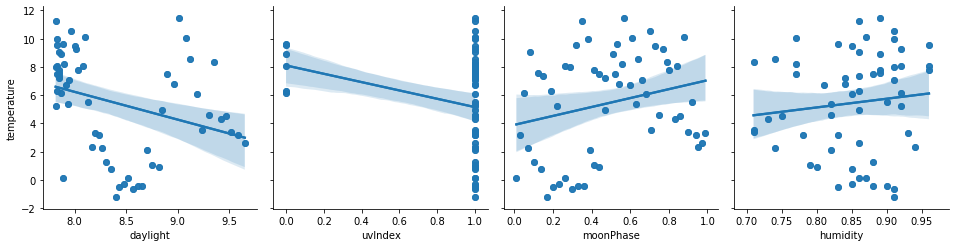

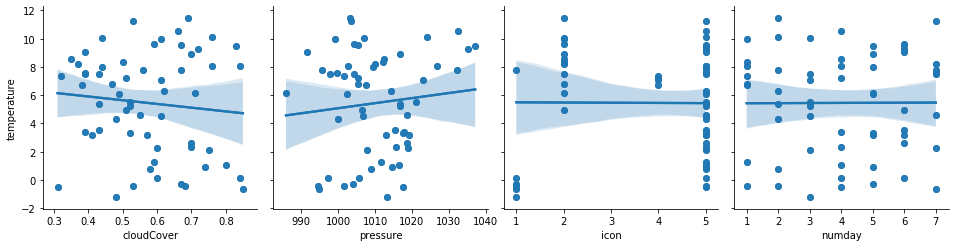

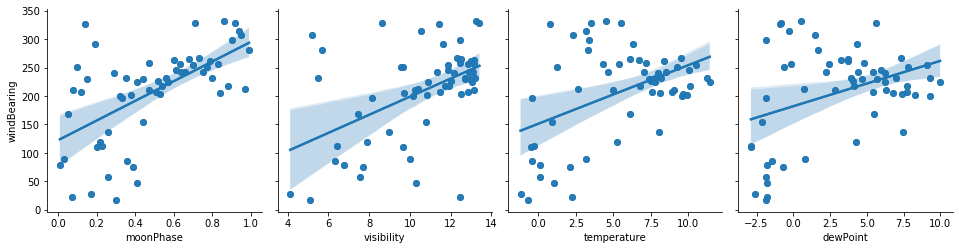

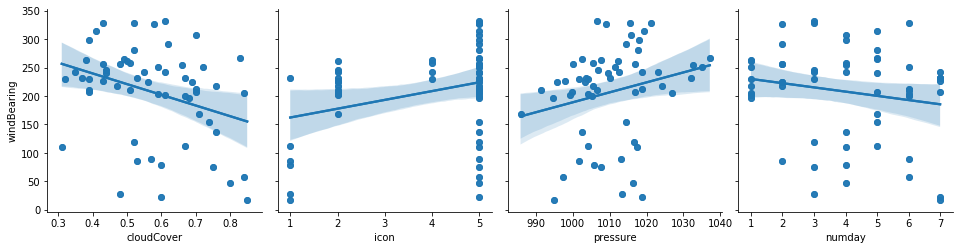

...

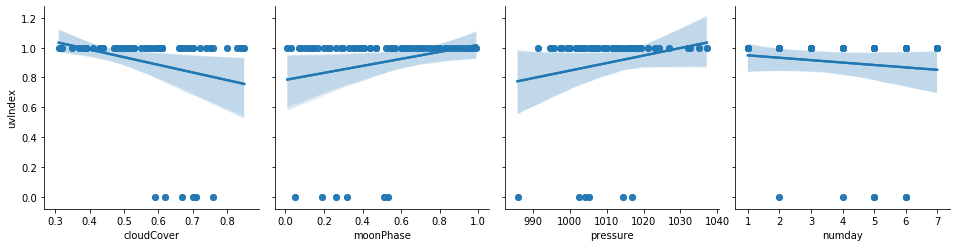

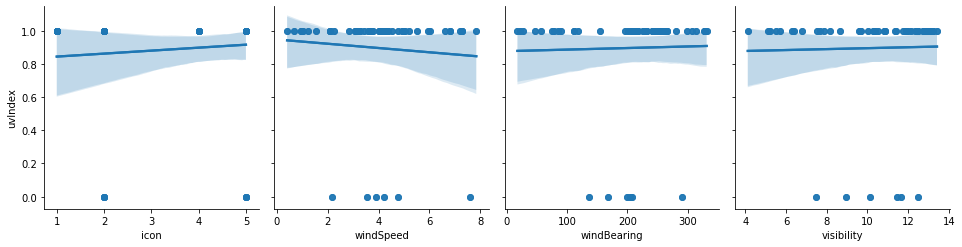

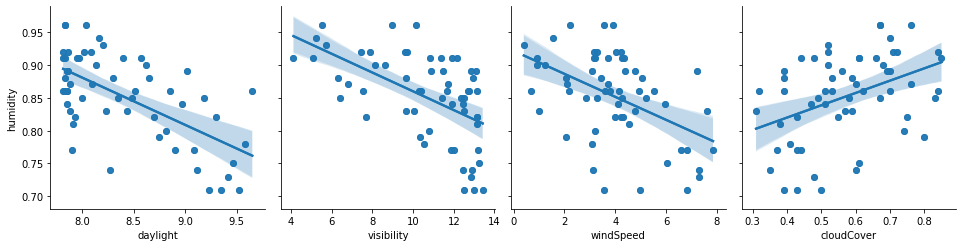

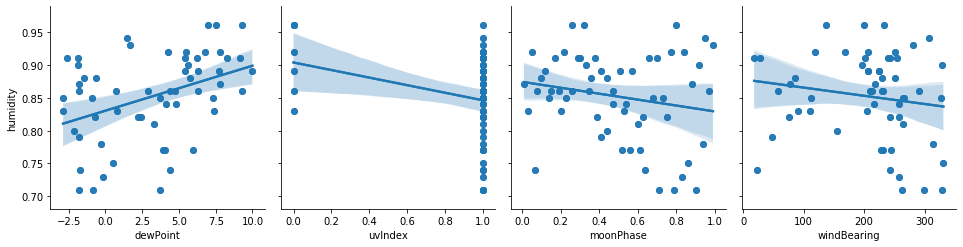

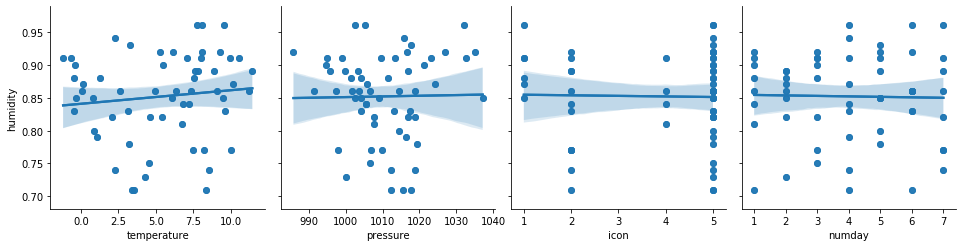

In [15]:
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
# Рассмотрим зависимости параметров метеоусловий между собой 
# в период максимального энергопотребления
i = 0
bdate = periodsr[3 * i]
edate = periodsr[3 * i + 2]
df_e = make_df(bdate, edate, show_result=0, make_all_corr=False, show_corr=False,
               show_scatter=True, scatter_params=['inplace'])

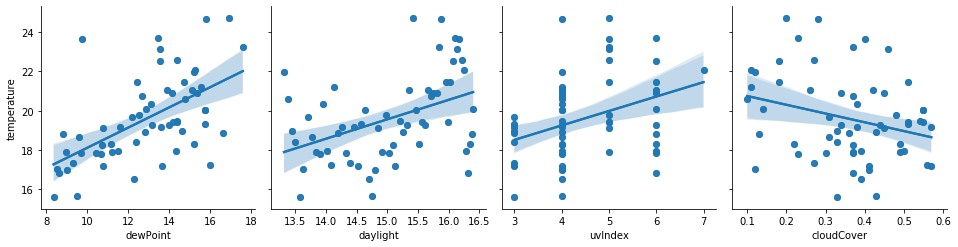

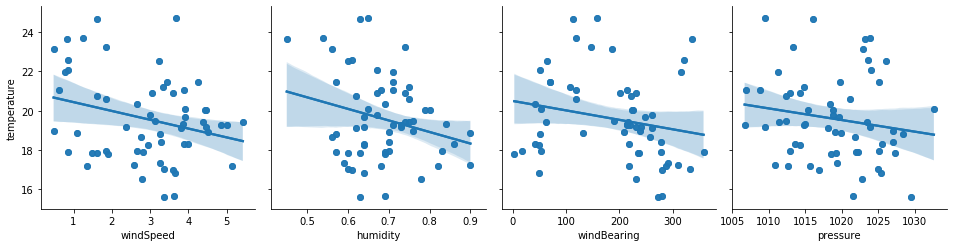

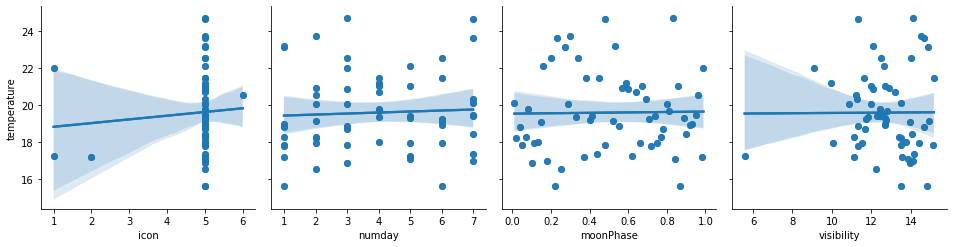

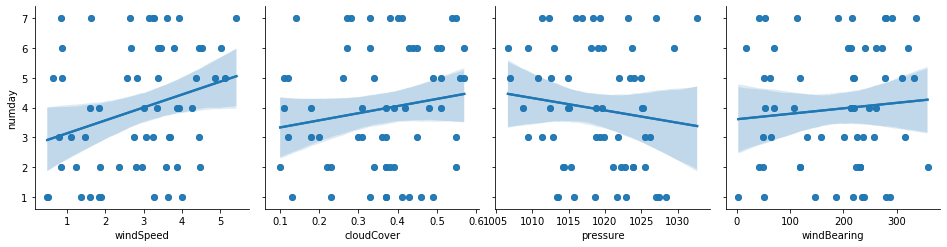

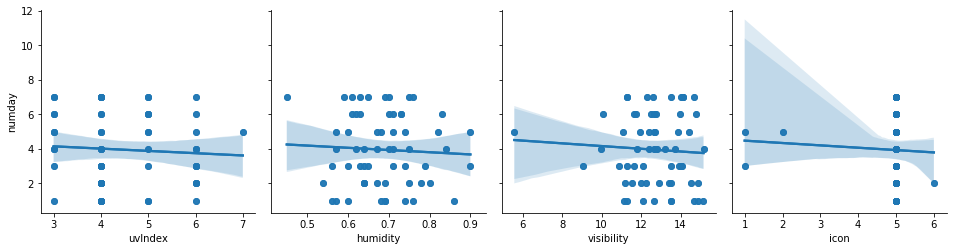

...

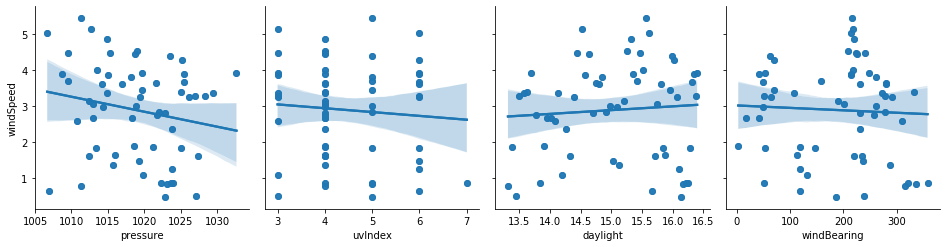

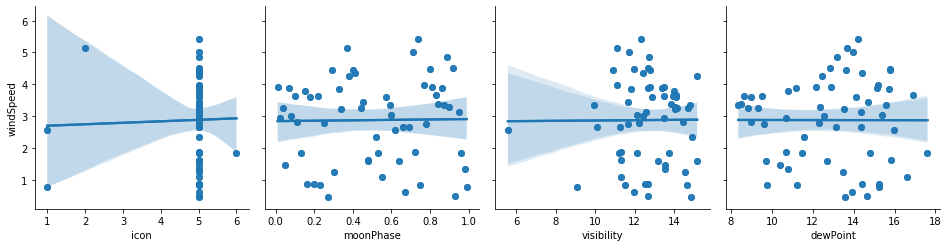

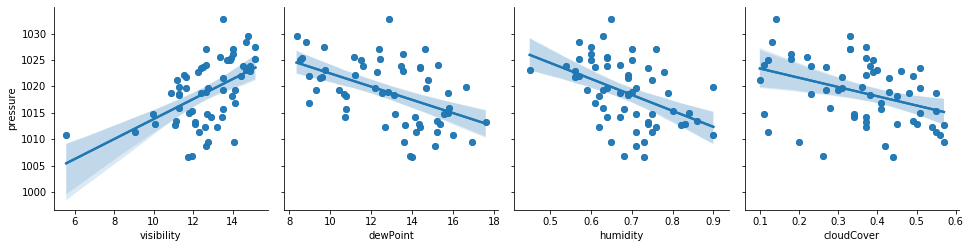

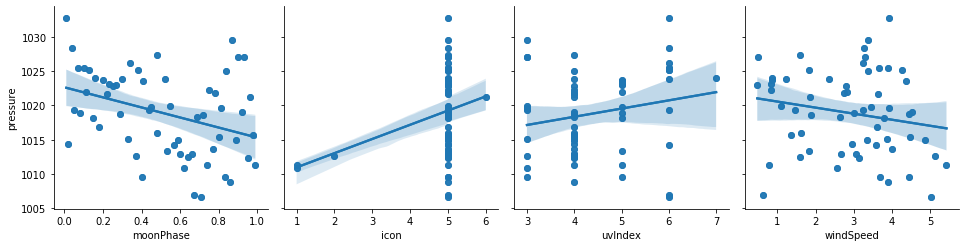

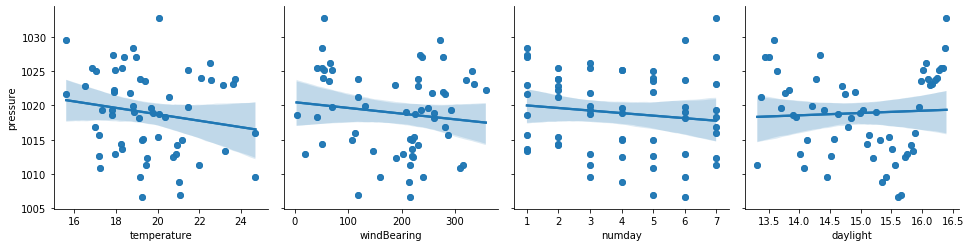

In [16]:
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
# Рассмотрим зависимости параметров метеоусловий между собой 
# в период минимального энергопотребления
i = 1
bdate = periodsr[3 * i]
edate = periodsr[3 * i + 2]
df_e = make_df(bdate, edate, show_result=0, make_all_corr=False, show_corr=False,
               show_scatter=True, scatter_params=['inplace'])

Ради любопытства посмотрим от каких факторов зависит энергопотребление весной и осенью.

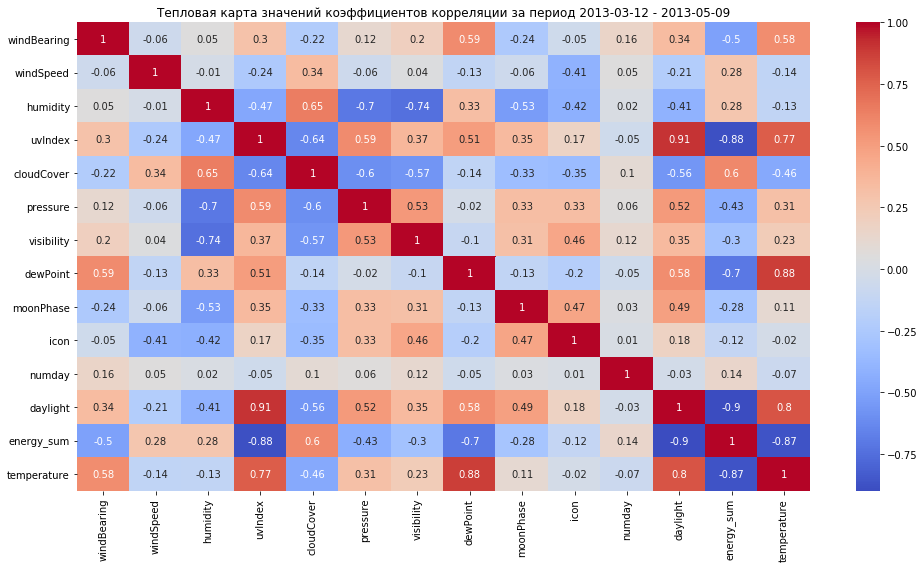

Коэффициенты корреляции для метеоусловий, влияющих на энергопотребление:
              energy_sum
daylight          -0.90
uvIndex           -0.88
temperature       -0.87
dewPoint          -0.70
cloudCover         0.60
windBearing       -0.50
pressure          -0.43
visibility        -0.30
windSpeed          0.28
humidity           0.28
moonPhase         -0.28
numday             0.14
icon              -0.12 



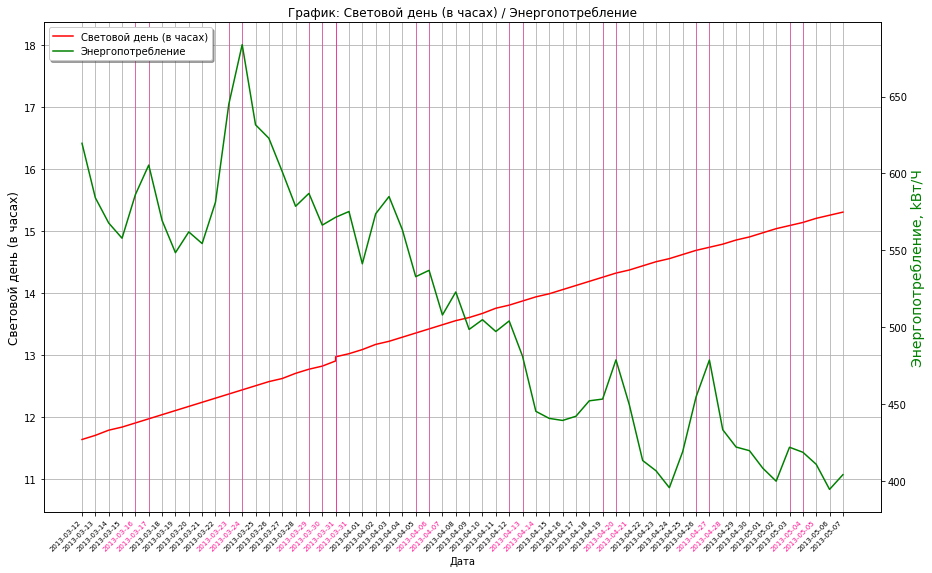

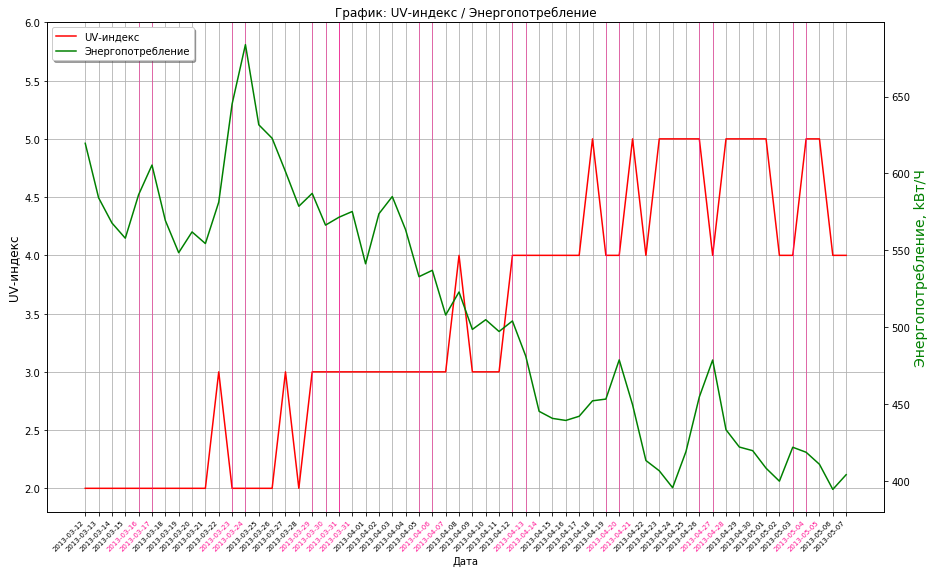

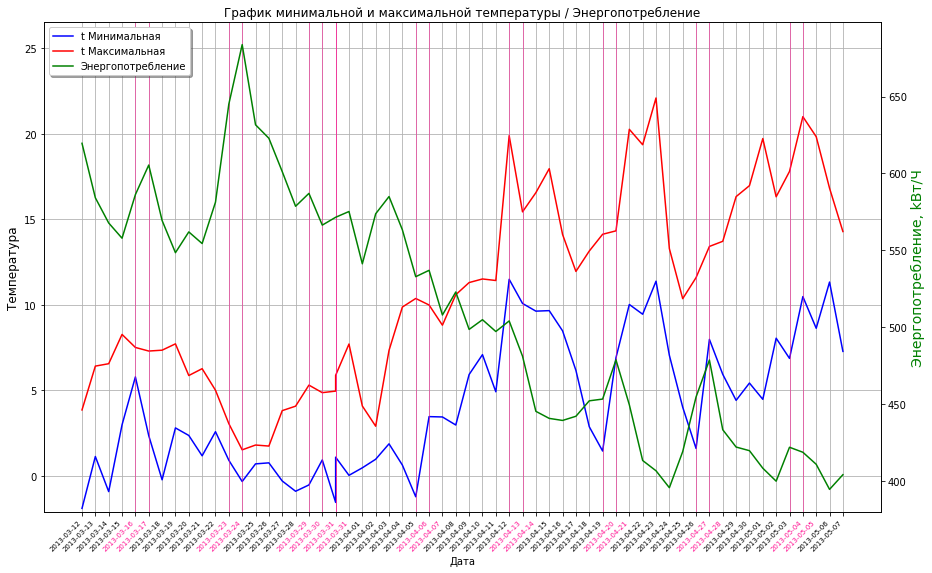

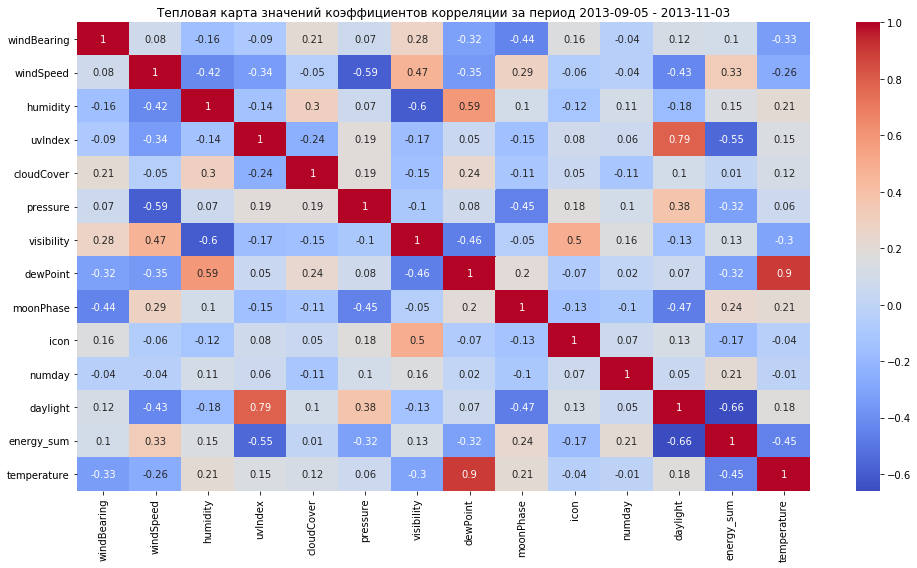

Коэффициенты корреляции для метеоусловий, влияющих на энергопотребление:
              energy_sum
daylight          -0.66
uvIndex           -0.55
temperature       -0.45
windSpeed          0.33
pressure          -0.32
dewPoint          -0.32
moonPhase          0.24
numday             0.21
icon              -0.17
humidity           0.15
visibility         0.13
windBearing        0.10
cloudCover         0.01 



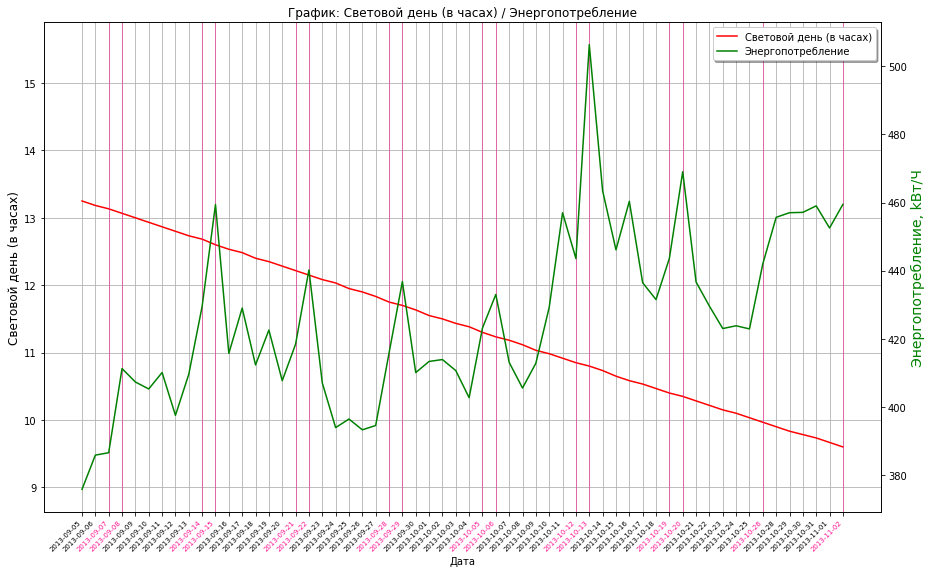

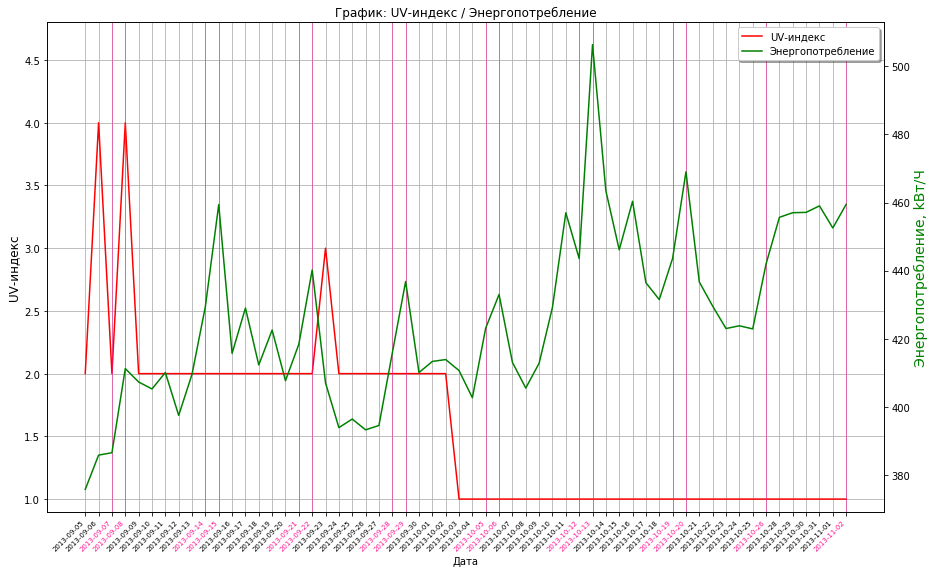

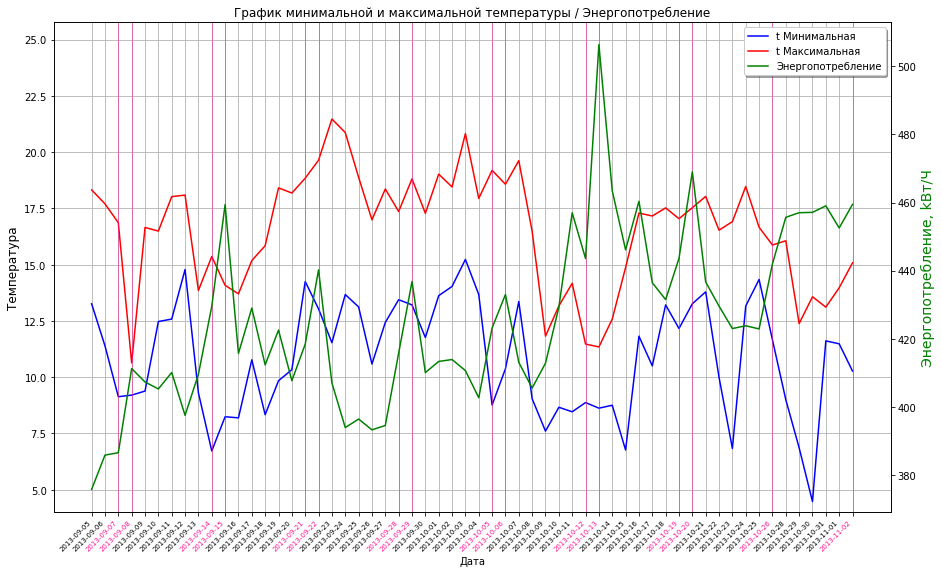

In [17]:
# период отбора данных в межсезонье
periodss = ['2013-03-12', '2013-04-09', '2013-05-09', '2013-09-05', '2013-10-04', '2013-11-03']
s_params = list('daylight uvIndex temperature'.split())
for i in range(2):
    bdate = periodss[3 * i]
    edate = periodss[3 * i + 2]
    df_e = make_df(bdate, edate, show_corr=True)
    for name_param in s_params:
        show_grafic(bdate, edate, df_e, show_parametr=name_param, 
                    idx_parametr=sort_params.index(name_param)+1)

Из графиков видны всплески энергопотребления в выходные дни, но от погодных условий в теплые месяцы есть только слабая зависимость от температуры и очень слабая зависимость от направления ветра и облачности.

In [18]:
# посмотрим когда была максимальная и минимальная температуры за достоверный период
bdate = "2012-10-01"
edate = "2014-02-01"
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")
df_wd = df_wd.sort_values(by=['temperatureMax'], ascending=False)
print(df_wd.query('time >= @bdate & time < @edate')[['time', 'temperatureMax']].head(15))
df_wd = df_wd.sort_values(by=['temperatureMin'], ascending=True)
print(df_wd.query('time >= @bdate & time < @edate')[['time', 'temperatureMin']].head(15))

                    time  temperatureMax
746  2013-07-31 23:00:00           32.40
783  2013-07-21 23:00:00           32.16
745  2013-07-16 23:00:00           30.28
700  2013-07-14 23:00:00           29.30
673  2013-07-15 23:00:00           29.20
723  2013-07-12 23:00:00           29.16
438  2013-09-04 23:00:00           28.49
565  2013-07-13 23:00:00           27.83
519  2013-07-17 23:00:00           27.56
571  2013-07-26 23:00:00           27.28
661  2013-07-06 23:00:00           27.28
682  2013-07-18 23:00:00           27.27
630  2013-07-22 23:00:00           27.13
479  2013-09-03 23:00:00           27.04
754  2013-07-05 23:00:00           26.47
                    time  temperatureMin
711  2013-01-17 00:00:00           -3.86
304  2012-12-12 00:00:00           -3.83
686  2013-01-22 00:00:00           -3.73
279  2012-12-06 00:00:00           -2.82
213  2012-12-11 00:00:00           -2.49
722  2013-01-16 00:00:00           -2.32
781  2013-01-21 00:00:00           -1.98
470  2013-01-18 

Рассмотрим энергопотребление по рабочим и выходным дням за весь период корректных данных.

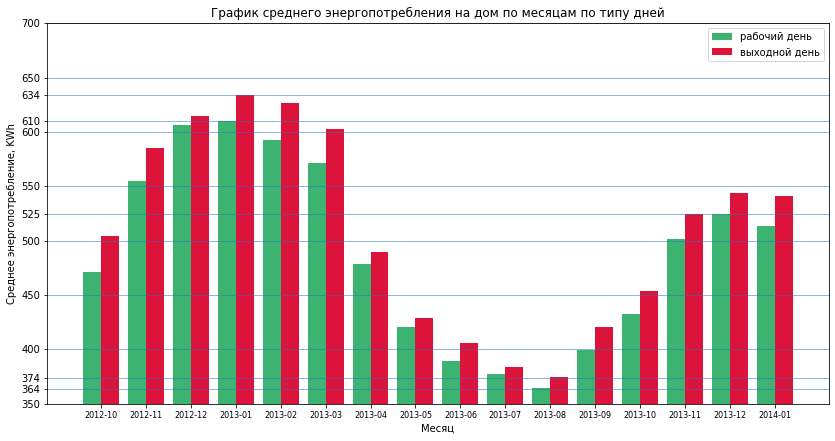

In [19]:
# для исследование энергопотребления по рабочим и выходным дням: блок grafic1_1.py

# чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))
name_cols = [name_col for name_col in energy_sum.columns.values if name_col.startswith('block_')]
days_mean = dict()
dt = datetime(2012, 10, 1)
period_dt = dt.strftime('%Y-%m-%d')
while dt < datetime(2014, 1, 2):
    bdate = dt.strftime('%Y-%m-%d')
    days_in_month = calendar.monthrange(dt.year, dt.month)[1]
    dt += timedelta(days=days_in_month)
    edate = dt.strftime('%Y-%m-%d')
    e_sum = energy_sum.query('day >= @bdate & day < @edate')
    # разделение дней на рабочие и выходные
    sum_days = dict()
    for type_day in ['workdays', 'weekends']:
        list_days = parsing_dates(bdate, edate, type_date=type_day)
        e_sum = energy_sum.query('day in @list_days')
        # расчет среднего энергопотребления по всем домам по типу дня --> среднее в день
        sum_days[type_day] = e_sum[name_cols].mean(axis=1).mean()
    days_mean[bdate[:7]] = sum_days
days_mean = pd.DataFrame(days_mean).transpose()
period_dt = period_dt + '_' + dt.strftime('%Y-%m-%d')
cg = ['mediumseagreen', 'crimson']  # задание цвета для гистограммы
# отображение гистограммы
fig, ax = plt.subplots(figsize=(14, 7))
ax.set_title(u'График среднего энергопотребления на дом по месяцам по типу дней')
ax.set_xlabel(u'Месяц', fontsize=10)
ax.set_ylabel(u'Среднее энергопотребление, KWh', fontsize=10)
# установка лимитов по оси Y и опреледение меток на оси Y
yticks = []
for type_day in ['workdays', 'weekends']:
    yticks.append(int(days_mean[type_day].min()))
    yticks.append(int(days_mean[type_day].max()))
min_y = floor(min(days_mean.min().to_list()) / 50.0) * 50
max_y = ceil(max(days_mean.max().to_list()) / 100.0) * 100
yticks.append(min_y)
yticks.append(max_y)
yticks.append(int((max_y + min_y) / 2))
for y in range(min_y, max_y, 50):
    yticks.append(y)
yticks = sorted(set(yticks))
ax.set_ylim(min_y, max_y)
# метки по оси Х
xticks = days_mean.index.to_list()
width = 0.4  # толщина полосы
x = np.arange(len(xticks))
ax.bar(x - width / 2, days_mean.workdays, width, color=cg[0], label='рабочий день')
ax.bar(x + width / 2, days_mean.weekends, width, color=cg[1], label='выходной день')
# отображение меток на осях в нужном виде
ax.set_xticks(x)
ax.set_xticklabels(xticks, fontsize=8)
ax.set_yticks(yticks)
for y in yticks:
    ax.axhline(y=y, linewidth=0.5)
ax.legend()
# сохранение картинки
plt.savefig(os.path.join(path_dataset, 'png', f'1_{period_dt}_days.png'))
plt.show()


На гистограмме по всем месяцам прослеживается повышение энергопотребления по выходным дням. 

Исследуем распределение энергопотребления по дням недели в теплые и холодные периоды.

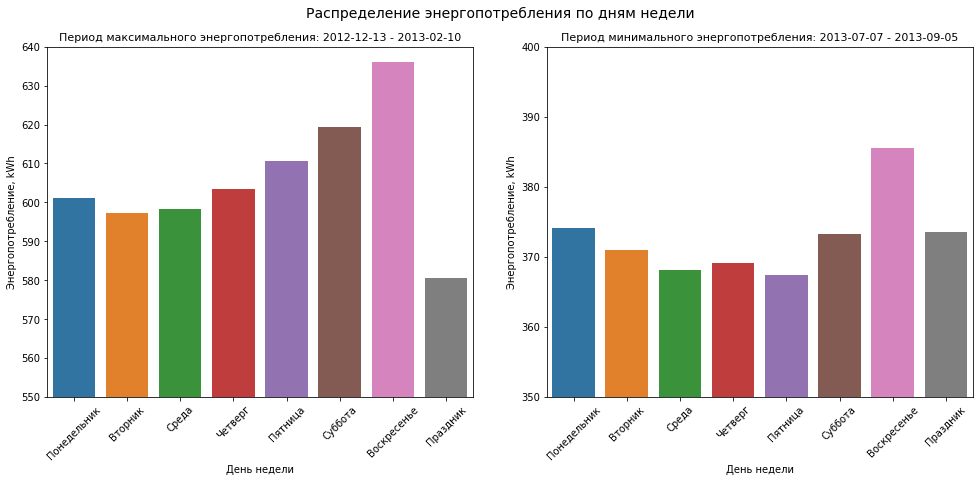

In [20]:
# исследование энергопотребления по дням недели: блок grafic1_3(_sns).py

# чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))
name_cols = [name_col for name_col in energy_sum.columns.values if name_col.startswith('block_')]
name_days = list('Понедельник Вторник Среда Четверг Пятница Суббота Воскресенье Праздник'.split())
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
name_prd = ['максимального', 'минимального']
holidays = bank_holidays.day.to_list()
# на одной фигуре отобразить 2 гистограммы
fig, ax = plt.subplots(1,2,figsize=(14, 7))
for i in range(2):
    bdate = periodsr[3 * i]
    edate = periodsr[3 * i + 2]
    # данные по домам за выбранный период
    tmp_e_sum = energy_sum.query('day >= @bdate & day < @edate')
    # датафрейм с суммой потребления энергии по всем домам
    tmp_sum = pd.DataFrame(tmp_e_sum[name_cols].mean(axis=1))  # среднее значение по дому
    tmp_sum.columns = ['energy_sum']
    df_e = pd.merge(tmp_e_sum['day'], tmp_sum, left_index=True, right_index=True)
    df_e['nday'] = pd.to_datetime(df_e.day).dt.weekday          # 0-понедельник, 6-воскресенье
    df_e.loc[df_e.day.isin(holidays), 'nday'] = 7               # помечаем праздники
    df_e = df_e.groupby('nday').mean()                          # группировка по дням недели
    df_e['num_day'] = df_e.index
    for numd in range(8):                                       # заполнение колонки текстовыми днями недели
        list_numd = [numd]
        df_e.loc[df_e.num_day.isin(list_numd), 'name_day'] = name_days[numd]
    df_e = df_e.sort_values(by='num_day')
    ax[i].set_title(u'Период {} энергопотребления: {} - {}'.format(name_prd[i], bdate, edate), fontsize=11)
    g = sns.barplot(x='name_day', y='energy_sum', data=df_e, ax=ax[i])
    if i:
        g.set(ylim=(350, 400))
    else:
        g.set(ylim=(550, 640))
    plt.setp(ax[i].get_xticklabels(), rotation=45)
    ax[i].set_xlabel(u'День недели', fontsize=10)
    ax[i].set_ylabel(u'Энергопотребление, kWh', fontsize=10)
plt.suptitle(u'Распределение энергопотребления по дням недели', fontsize=14)
# уплотнение графика и чтобы заголовок фигуры не налазил на подзаголовки графков
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
# сохранение картинки
plt.savefig(os.path.join(path_dataset, 'png', f'1_max_min_weekday.png'))
plt.show()

Исследуем распределение энергопотребления по группам Acorn в периоды максимального и минимального энергопотребления.

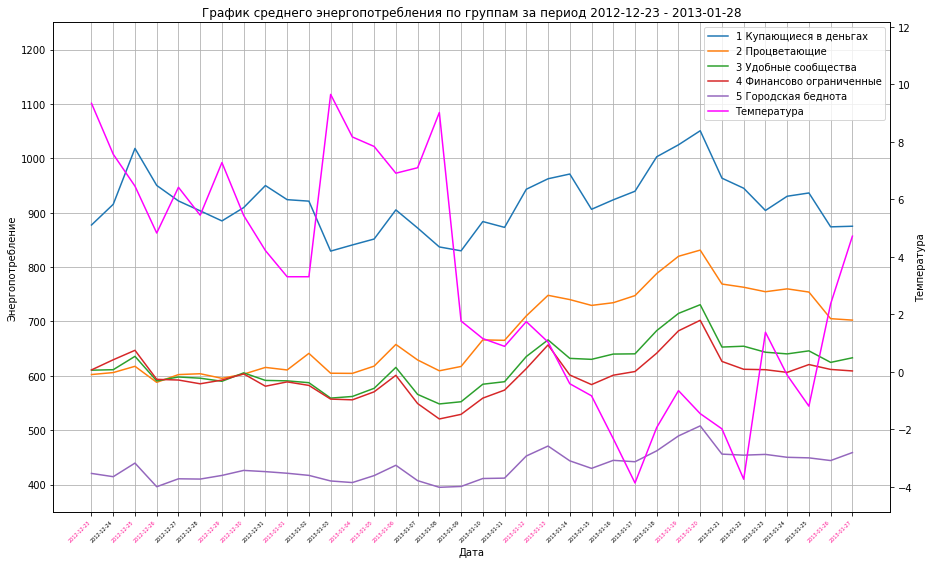

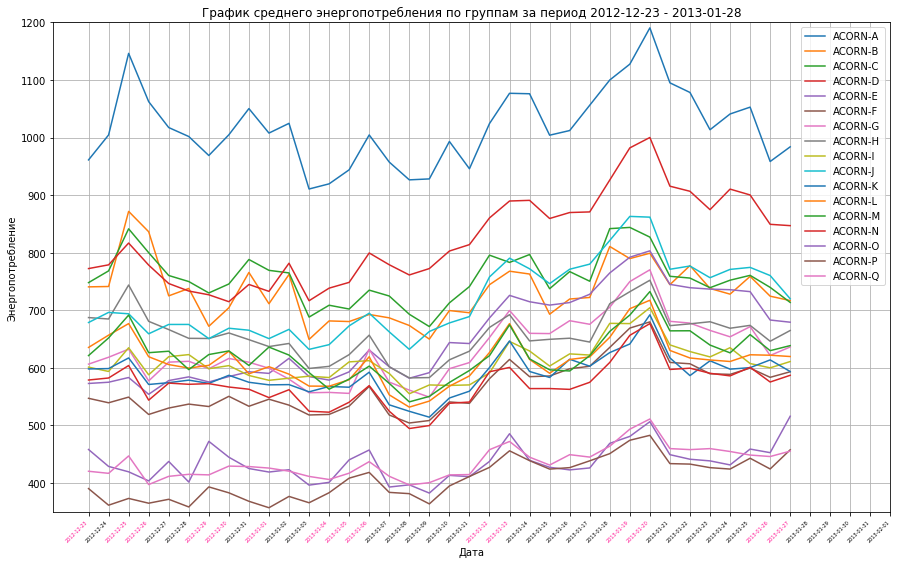

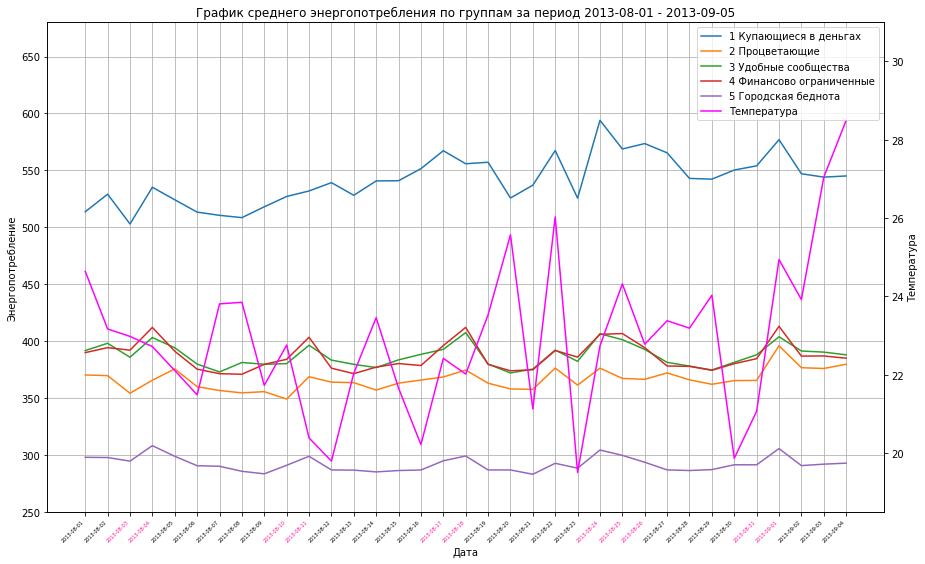

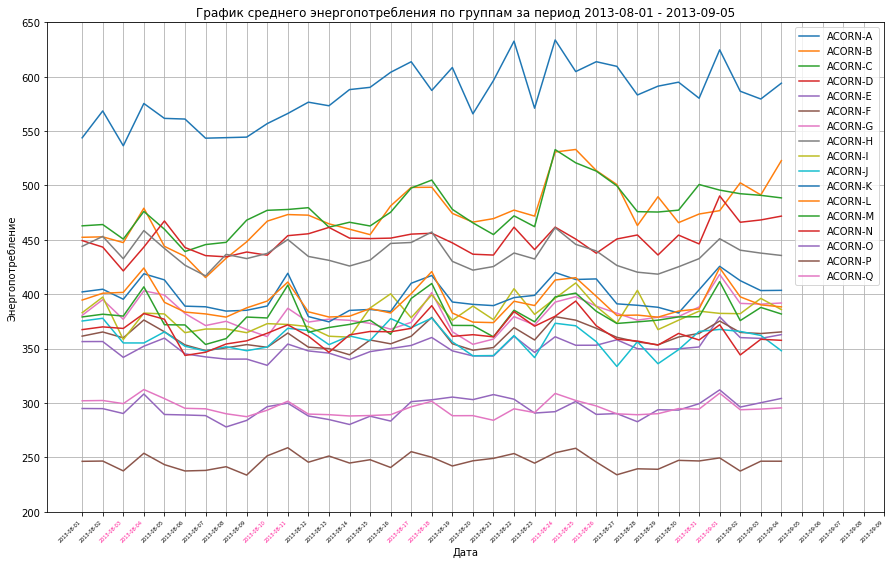

In [21]:
# распределение среднего энергопотребления по группам: блок grafic2_1.py

def show_grafic1(energy_sum, bdate, edate):
    # добавление нескольких дней на ось Х, чтобы легенда не перекрывала графики
    dt = datetime.strptime(edate, '%Y-%m-%d')
    xafter = []
    for d in range(5):
        dp = dt + timedelta(days=d)
        xafter.append(dp.strftime('%Y-%m-%d'))

    # чтение данных о погоде
    df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")
    # данные о погоде за выбранный период c необходимыми колонками
    # метеоусловия, которые могут влиять на энергопотребление
    name_cols = ['time', 'temperatureMax', 'temperatureMin']
    df_wd = df_wd.query('time >= @bdate & time < @edate')[name_cols]
    # в колонке 'day' оставить только дату и преобразовать в строку, т.к. все даты в датасете загружаются как строки
    df_wd['day'] = pd.to_datetime(df_wd.time).dt.strftime("%Y-%m-%d")
    df_wd = df_wd.sort_values(by='day')

    # данные по домам за выбранный период
    tmp_e_sum = energy_sum.query('day >= @bdate & day < @edate')
    name_cols = [name_col for name_col in tmp_e_sum.columns.values if name_col.startswith('block_')]
    for name_grp in ['Acorn_grouped', 'Acorn']:
        fig, ax = plt.subplots(figsize=(15, 9))
        ax.set_title(u'График среднего энергопотребления по группам за период {} - {}'.format(bdate, edate))
        ax.set_xlabel(u'Дата', fontsize=10)
        ax.set_ylabel(u'Энергопотребление', fontsize=10)
        min_y = max_y = []
        nf = []
        lines = []
        for name_group, name_cols in dct_acorn[name_grp].items():
            # датафрейм с суммой потребления энергии по всем домам группы
            tmp_sum = pd.DataFrame(tmp_e_sum[name_cols].mean(axis=1))  # среднее значение по дому в группе
            tmp_sum.columns = ['energy_sum']
            df_e = pd.merge(tmp_e_sum['day'], tmp_sum, left_index=True, right_index=True)
            df_e = df_e.sort_values(by='day')
            x = df_e.day.to_list()
            y = df_e.energy_sum.to_list()
            if name_grp == 'Acorn_grouped':
                name_a = trans_acorn(name_group)
            else:
                name_a = name_group
            nf.append(name_a)
            # line, = ax.plot(x, y, label=name_a)
            line, = ax.plot(x, y)
            lines.append(line)
            # отображение меток на оси Х в нужном виде
            xsticks = x + xafter
            ax.set_xticks(xsticks)
            min_y.append(min(y))
            max_y.append(max(y))

        color_weekends = 'deeppink'
        # список цветов для отображения рабочих/выходных дней
        colors = [color_weekends if d in parsing_dates(bdate, edate, 'weekends') else 'k' for d in x]
        # расцвечивание дат
        for xtick, color in zip(ax.get_xticklabels(), colors): xtick.set_color(color)

        if name_grp == 'Acorn_grouped':
            # для графика по подгруппам добавим температуру
            max_y = ceil(max(max_y) / 100.0) * 100
            if bdate < '2013-08-01':
                max_y += 150
                y = df_wd.temperatureMin.to_list()
            else:
                max_y += 80
                y = df_wd.temperatureMax.to_list()
            ax2 = ax.twinx()
            ax2.set_ylim(min(y) - 1, max(y) + 2.5)
            ax2.set_ylabel(u'Температура', fontsize=10)
            line, = ax2.plot(df_wd.day.to_list(), y, 'magenta')
            lines.append(line)
            nf.append('Температура')
            # xsticks = x + xafter
            # ax2.set_xticks(xsticks)
        else:
            max_y = ceil(max(max_y) / 50.0) * 50
        min_y = floor(min(min_y) / 50.0) * 50
        ax.set_ylim(min_y, max_y)
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=5)
        ax.grid()
        plt.legend(lines, nf, loc='upper right')
        # сохранение картинки
        plt.savefig(os.path.join(path_dataset, 'png', f'2_{x[0]}_{name_grp}.png'))
        plt.show()


# чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))

periodss = ['2012-12-23', '2013-01-28', '2013-08-01', '2013-09-05']
for i in range(2):
    # i = 0 период отбора данных с высоким энергопотреблением
    # i = 1 период отбора данных с низким энергопотреблением
    bdate = periodss[2 * i]
    edate = periodss[2 * i + 1]
    show_grafic1(energy_sum, bdate, edate)

По графикам видно, что формы графиков всех групп совпадают, для них будут справедливы выводы,
сделанные по графикам среднего энергопотребления по всем домам.

Исследуем распределение энергопотребления по рабочим и выходным дням по группам Acorn в теплые и холодные периоды.

In [22]:
# Зависимость среднего энергопотребления на дом по группам по типу дней: блок grafic2_2.py

def show_grafic2(energy_sum, bdate, edate):
    # данные по домам за выбранный период
    tmp_e_sum = energy_sum.query('day >= @bdate & day < @edate')
    # на одной фигуре отобразить 2 гистограммы
    cg = ['mediumseagreen', 'crimson']  # задание цвета для гистограммы
    for name_grp in ['Acorn_grouped', 'Acorn']:
        fig, ax = plt.subplots(figsize=(13, 1+0.4*(len(dct_acorn[name_grp])+1)))
        ax.set_title(u'График энергопотребления на дом по группам и типу дней период {} - {}'.format(bdate, edate))
        days_mean = dict()
        yticks = []
        for name_group, name_cols in dct_acorn[name_grp].items():
            # датафрейм с суммой потребления энергии по всем домам группы
            tmp_sum = pd.DataFrame(tmp_e_sum[name_cols].mean(axis=1))  # среднее значение по дому в группе
            tmp_sum.columns = ['energy_sum']
            df_e = pd.merge(tmp_e_sum['day'], tmp_sum, left_index=True, right_index=True)
            df_e = df_e.sort_values(by='day')
            # разделение дней на рабочие и выходные
            sum_days = dict()
            for type_day in ['workdays', 'weekends']:
                list_days = parsing_dates(bdate, edate, type_date=type_day)
                e_sum = energy_sum.query('day in @list_days')
                # расчет среднего энергопотребления по всем домам по типу дня --> среднее в день
                sum_days[type_day] = e_sum[name_cols].mean(axis=1).mean()
            days_mean[name_group] = sum_days
            if name_grp == 'Acorn':
                yticks.append(name_group + ": " + trans_acorn(name_group))
            else:
                yticks.append(trans_acorn(name_group))
        days_mean = pd.DataFrame(days_mean).transpose()
        ax.set_xlabel(u'Среднее энергопотребление, KWh', fontsize=10)
        #
        # установка лимитов по оси Y и опреледение меток на оси Y
        xticks = []
        for type_day in ['workdays', 'weekends']:
            xticks.append(int(days_mean[type_day].min()))
            xticks.append(int(days_mean[type_day].max()))
        min_y = floor(min(days_mean.min().to_list()) / 100.0) * 100
        max_y = ceil(max(days_mean.max().to_list()) / 50.0) * 50
        xticks.append(min_y)
        xticks.append(max_y)
        xticks.append(int((max_y + min_y) / 2))
        for y in range(min_y, max_y, 100):
            xticks.append(y)
        xticks = sorted(set(xticks))
        ax.set_xlim(min_y, max_y)
        #
        # xticks = days_mean.index.to_list()
        height = 0.4  # толщина полосы
        x = np.arange(len(days_mean.index.to_list()))
        ax.set_yticks(x)
        ax.set_yticklabels(yticks)
        ax.barh(x + height / 2, days_mean.workdays, height, color=cg[0], label='рабочий день')
        ax.barh(x - height / 2, days_mean.weekends, height, color=cg[1], label='выходной день')
        ax.legend()
        ax.grid(axis='x')
        fig.tight_layout()
        # сохранение картинки
        plt.savefig(os.path.join(path_dataset, 'png', f'2_2_{bdate}_{edate}_{name_grp}.png'))
        plt.show()

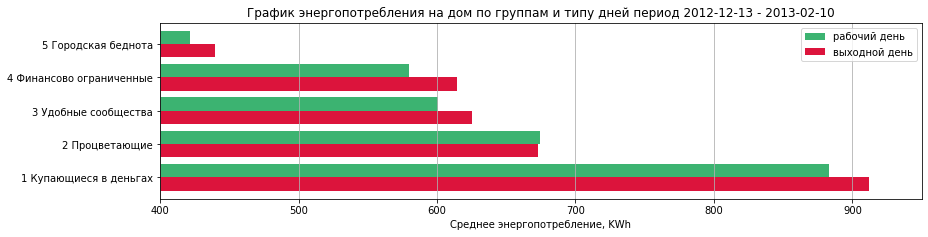

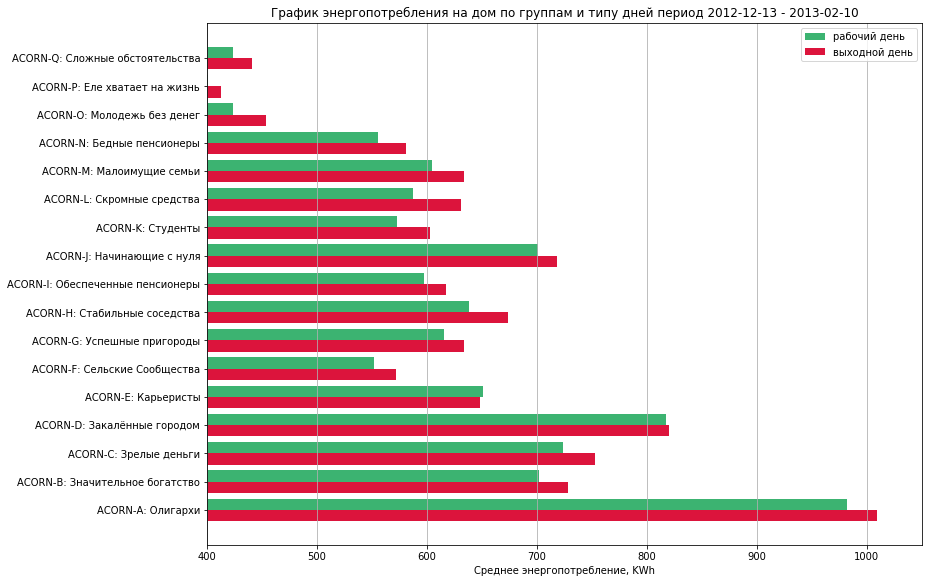

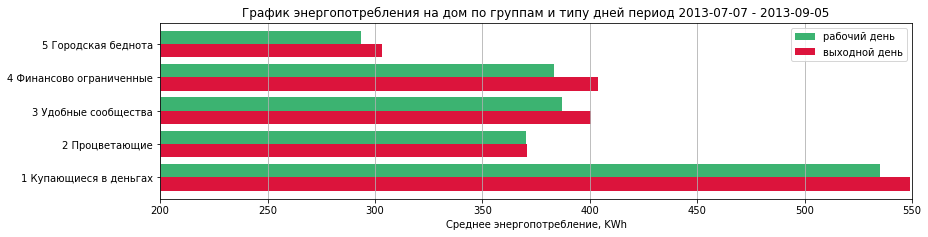

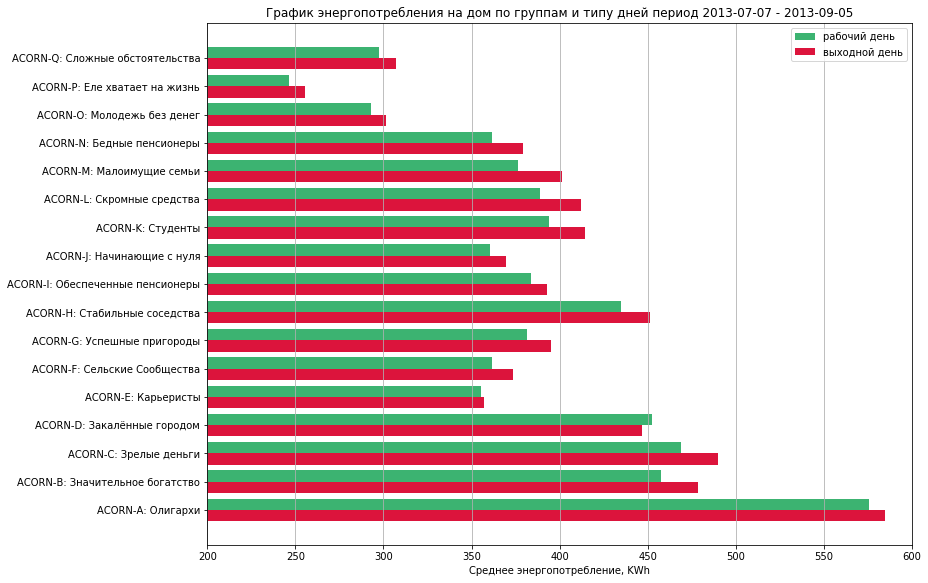

In [23]:
# чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))


periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
for i in range(2):
    # i = 0 период отбора данных с высоким энергопотреблением
    # i = 1 период отбора данных с низким энергопотреблением    
    bdate = periodsr[3 * i]
    edate = periodsr[3 * i + 2]
    show_grafic2(energy_sum, bdate, edate)

В периоды максимального и минимального энергопотребления сохраняется тенденция, что энергопотребление в выходные дни преобладает над рабочими днями, в теплое время года эта разница чуть меньше, у одной группы ACORN-D в августе энергопотребление по рабочим дням оказалось чуть выше: возможно уезжают куда-то на выходные.

Исследуем распределение энергопотребления по дням недели в периоды максимального и минимального энергопотребления.

In [24]:
# исследование энергопотребления по дням недели по подгруппам: блок grafic2_4.py

def make_df_days_mean(energy_sum, bdate, edate, name_grp='Acorn_grouped'):
    # данные по домам за выбранный период
    df_e = energy_sum.query('day >= @bdate & day < @edate')
    sum_days = dict()
    holidays = bank_holidays.day.to_list()
    add_holyday = 0
    for day_num in range(8):
        # выбор данных по одному дню недели и праздники исключить из рабочих дней
        if day_num < 5:
            e_sum = df_e.query('nday == @day_num and day not in @holidays')
        elif day_num > 6:
            # выделение праздников в отдельный столбец на графике, если они есть за период
            e_sum = df_e.query('day in @holidays')
            if len(e_sum): add_holyday = 1
        else:
            e_sum = df_e.query('nday == @day_num')
        # заполнениие словаря группа - среднее значение энергопотребления по дому в группе
        days_mean = dict()
        for name_group, name_cols in dct_acorn[name_grp].items():
            days_mean[name_group] = e_sum[name_cols].mean(axis=1).mean()  # среднее значение по дому в группе
        sum_days[day_num] = days_mean
    # создание датафрейма для отображения гистограммы
    days_mean = pd.DataFrame(columns='nday Acorn e_sum'.split())
    for i in range(7+add_holyday):
        cnt = 0
        for key, val in sum_days[i].items():
            days_mean.loc[i * 20 + cnt] = [i, trans_acorn(key), val]
            cnt += 1
    return days_mean

def show_grafic3(days_mean, bdate, edate):
    # автоопределение лимитов по оси Y
    min_y = floor(days_mean.e_sum.min() / 50.0) * 50
    max_y = ceil(days_mean.e_sum.max() / 50.0) * 50
    fig, ax = plt.subplots(figsize=(15, 10))
    ax.set_title(u'График распределения энергопотребления по группам и дням недели за  {} - {}'.format(bdate, edate))
    ax.set_ylim(min_y, max_y)
    ax.grid(axis='y')
    sns.barplot(x='nday', y='e_sum', hue='Acorn', data=days_mean)
    ax.set_xticklabels(name_days, fontsize=9)
    plt.xlabel(u'День недели')
    plt.ylabel(u'Среднее энергопотребление, KWh')
    plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
    fig.tight_layout()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'2_4_{bdate}_{edate}_Acorn_grouped.png'))
    plt.show()

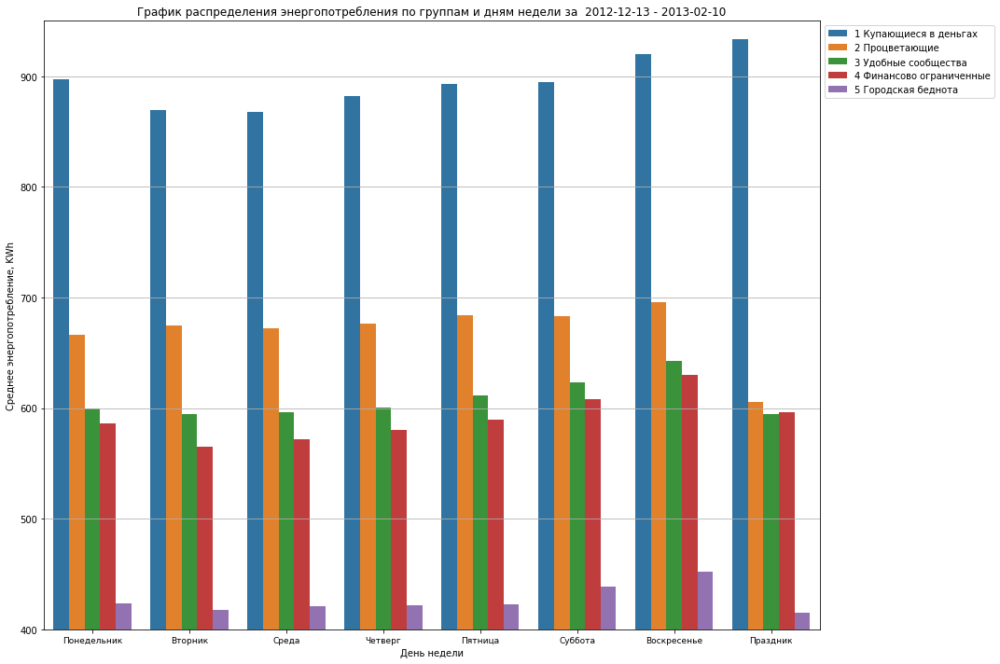

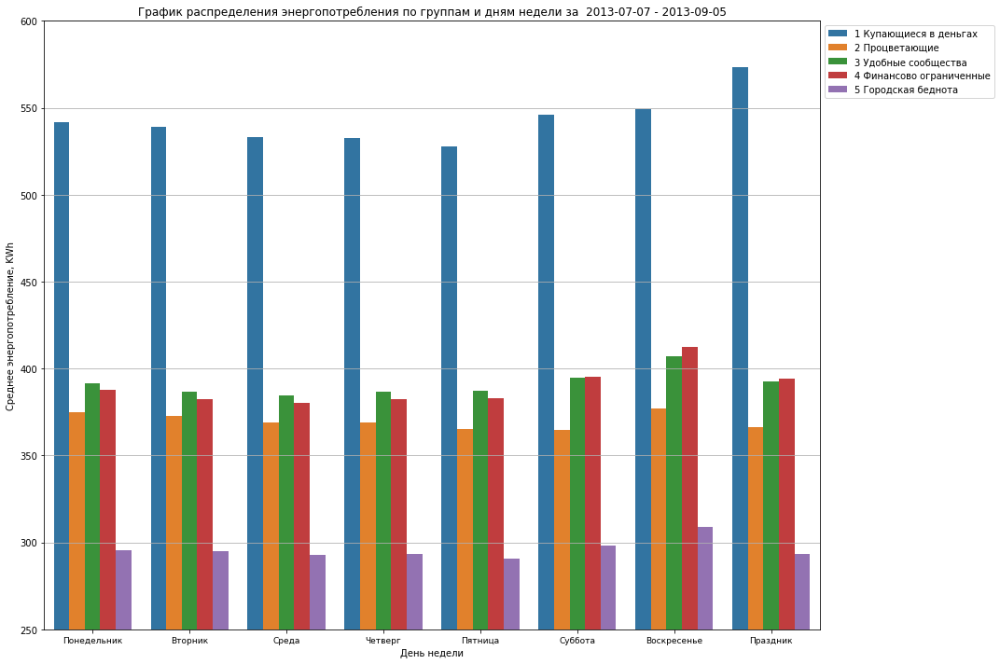

In [25]:
# чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))

name_days = list('Понедельник Вторник Среда Четверг Пятница Суббота Воскресенье Праздник'.split())
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
for i in range(2):
    # i = 0 период отбора данных с высоким энергопотреблением
    # i = 1 период отбора данных с низким энергопотреблением    
    bdate = periodsr[3 * i]
    edate = periodsr[3 * i + 2]
    days_mean = make_df_days_mean(energy_sum, bdate, edate)
    show_grafic3(days_mean, bdate, edate)

Энергопотребление по дням недели в разных подгруппах Acorn в теплые и холодные периоды в примерно  соответствует общему энергопотреблению по дням недели, приведенному выше. Но имеет свои особенности.

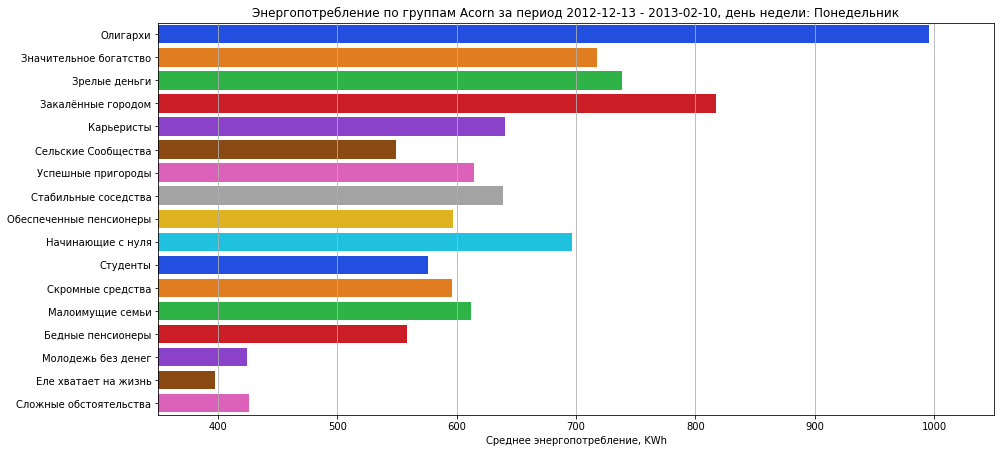

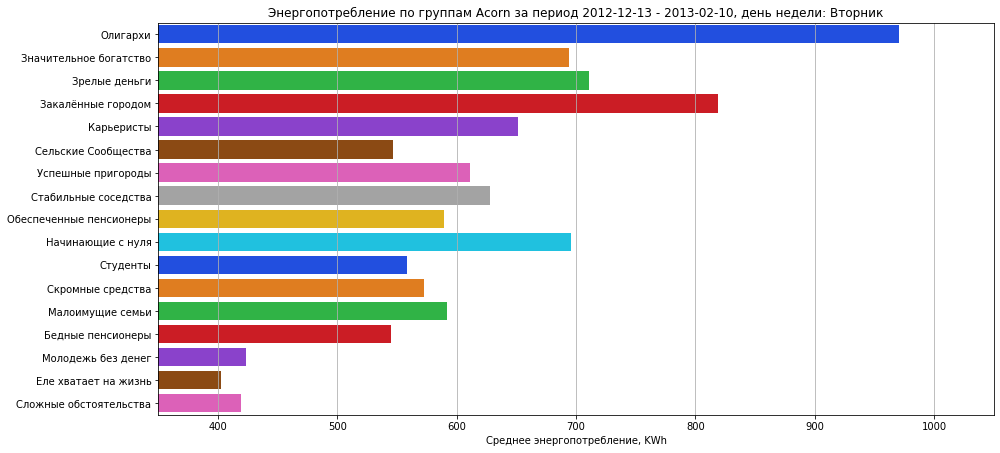

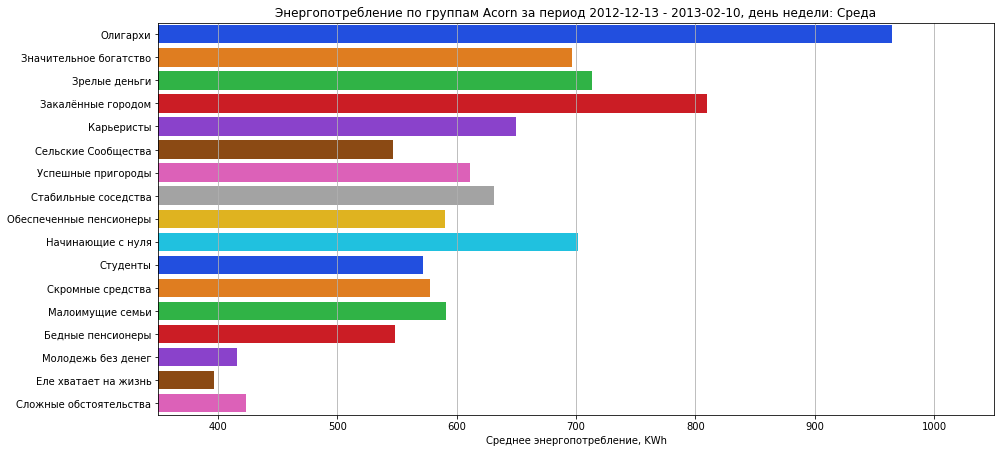

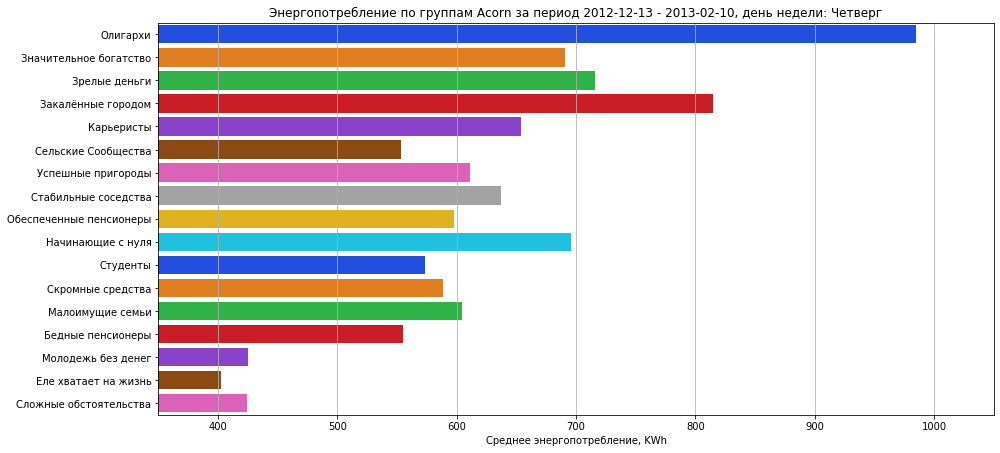

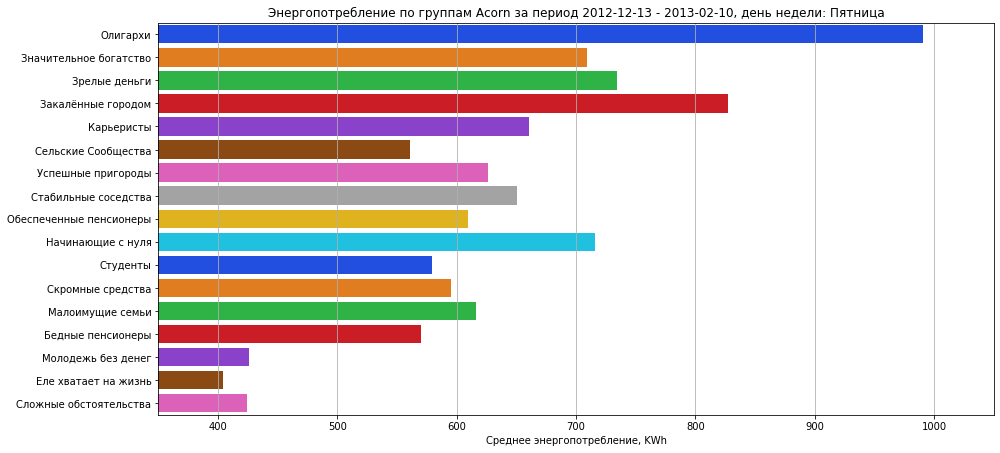

...

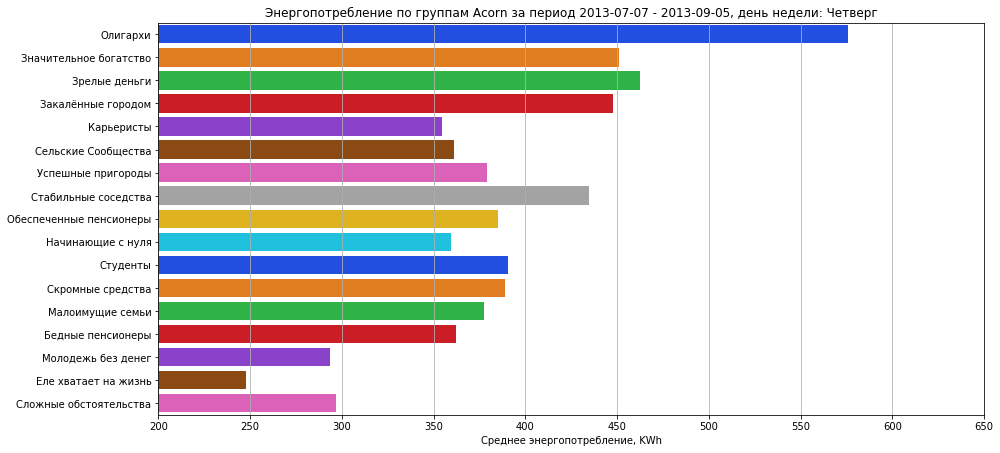

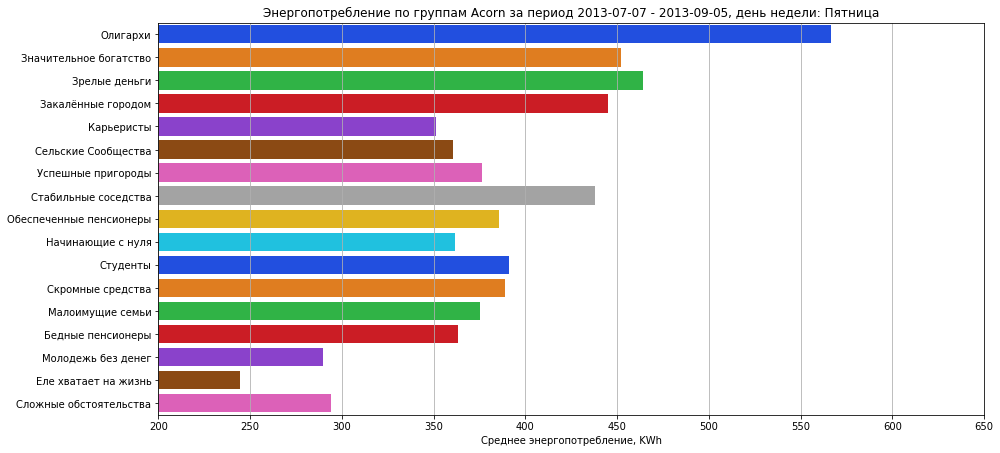

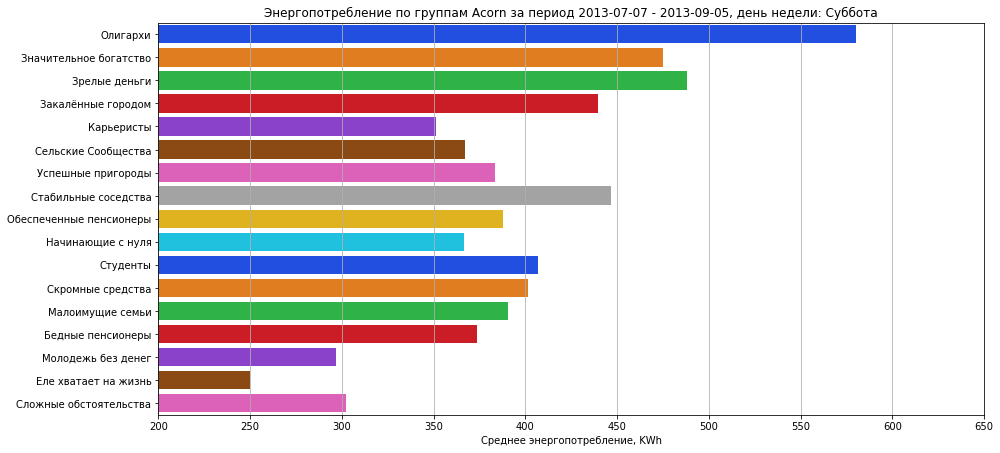

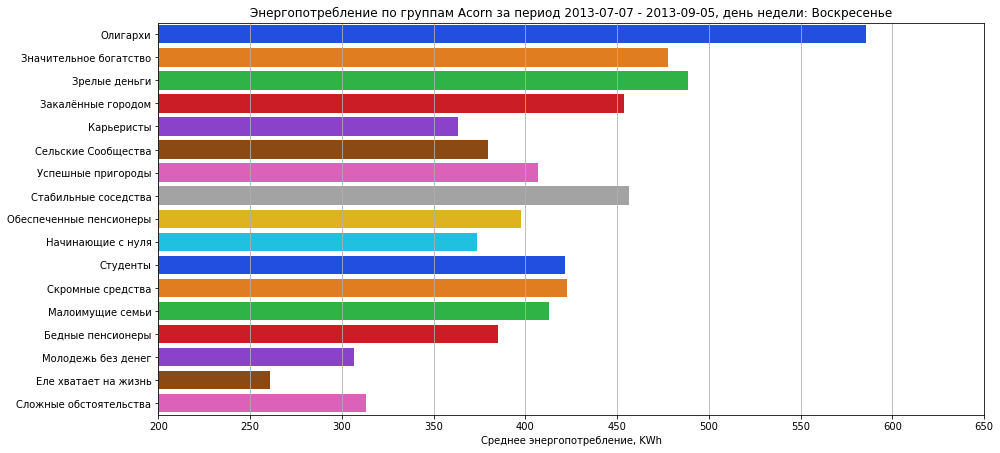

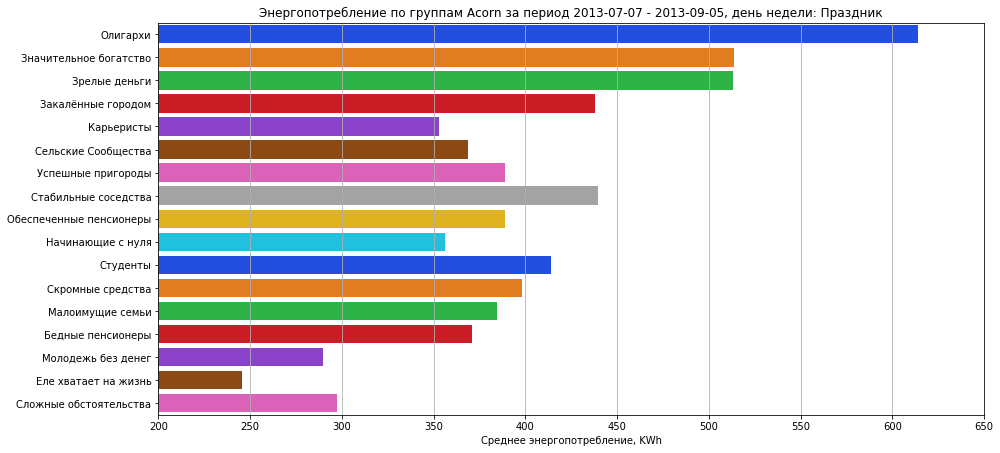

In [26]:
# исследование энергопотребления по группам Acorn по дням недели: блок grafic2_5.py

def show_grafic4(days_mean, bdate, edate):
    # автоопределение лимитов по оси Y
    min_x = floor(days_mean.e_sum.min() / 50.0) * 50
    max_x = ceil(days_mean.e_sum.max() / 50.0) * 50
    # вывод графиков в цикле по одному дню
    for n_d in range(days_mean.nday.max()+1):
        fig, ax = plt.subplots(figsize=(14, 6.4))
        ax.set_title(f'Энергопотребление по группам Acorn за период {bdate} - {edate}, день недели: {name_days[n_d]}')
        e_sum = days_mean.query('nday == @n_d')
        e_sum = e_sum.drop('nday', axis=1)
        ax.set_xlim(min_x, max_x)
        sns.barplot(x='e_sum', y='Acorn', data=e_sum, palette=sns.color_palette("bright"))
        ax.grid(axis='x')
        plt.xlabel(u'Среднее энергопотребление, KWh')
        plt.ylabel('')
        fig.tight_layout()
        # сохранение картинки
        plt.savefig(os.path.join(path_dataset, 'png', f'2_5_{bdate}_{edate}_Acorn_{n_d}.png'))
        plt.show()


# чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))

name_days = list('Понедельник Вторник Среда Четверг Пятница Суббота Воскресенье Праздник'.split())
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
for i in range(2):
    bdate = periodsr[3 * i]
    edate = periodsr[3 * i + 2]
    days_mean = make_df_days_mean(energy_sum, bdate, edate, name_grp='Acorn')
    show_grafic4(days_mean, bdate, edate)

Посмотрим распределение домов по группам Acorn.

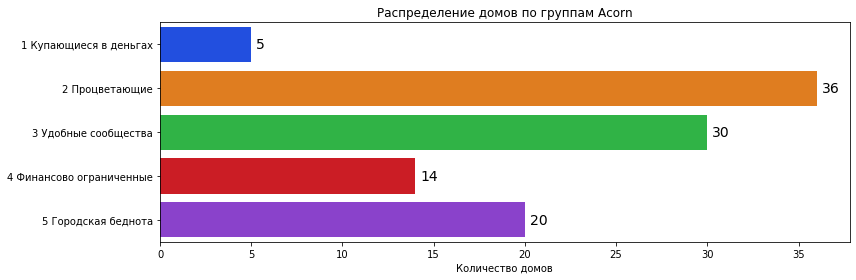

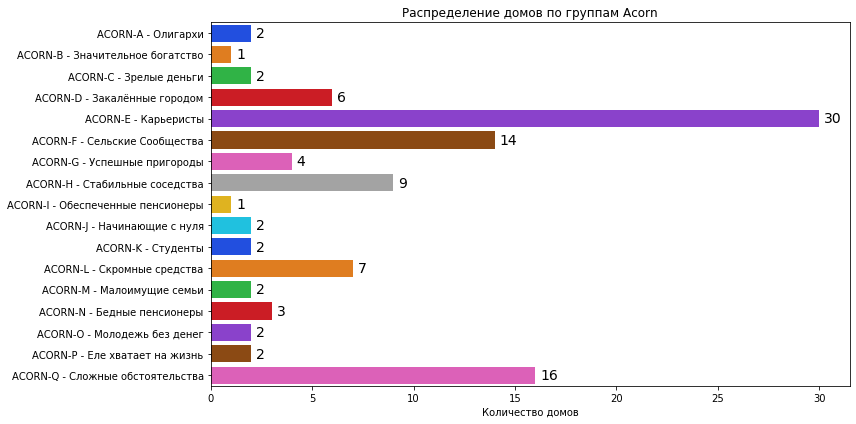

In [27]:
# Распределение домов по группам Acorn: блок grafic2_6.py

# чтение информации по распределению датчиков по домам
pvt = pd.read_csv(os.path.join(path_dataset, 'hh_ToU_Std.csv'))
dbl_ha = defaultdict(set)  # словарь Acorn: список домов
for grp in list(list(pvt.Acorn.unique())):
    dbl_ha[grp] = pvt.query('Acorn == @grp').file.to_list()
# print(dbl_ha)
for name_grp in ['Acorn_grouped', 'Acorn']:
    dict_grp = dict()
    df_d_grp = pd.DataFrame(columns=['group', 'name', 'quantity'])
    for name_group, name_cols in dct_acorn[name_grp].items():
        if name_grp == 'Acorn_grouped':
            trans_name = trans_acorn(name_group)
        else:
            name_cols = dbl_ha[name_group]
            trans_name = name_group + ' - ' + trans_acorn(name_group)
        dict_grp[name_group] = len(name_cols)
        df_d_grp.loc[len(df_d_grp)] = [name_group, trans_name, len(name_cols)]
    if name_grp == 'Acorn_grouped':
        height = 4
    else:
        height = 6
    fig, ax = plt.subplots(figsize=(12, height))
    ax.set_title(f'Распределение домов по группам Acorn')
    sns.barplot(x='quantity', y='name', data=df_d_grp, palette=sns.color_palette("bright"))
    # добавление значений на полоски
    for p in ax.patches:
        width = int(p.get_width())
        xloc = 5
        yloc = p.get_y() + p.get_height() / 2
        ax.annotate(width, xy=(width, yloc), xytext=(xloc, 0), ha='left', va='center',
                    textcoords='offset points', clip_on=True, fontsize=14)
    plt.ylabel('')
    plt.xlabel(u'Количество домов')
    fig.tight_layout()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'2_6_{name_grp}.png'))
    plt.show()

Перейдем к исследованию распределения энергопотребления по домам с датчиками разной формы оплаты. Анализ файла informations_households.csv показал, что после исключения домов с некорректной группировкой по классификации Acorn, остались дома, в которых установлено ровно 50 датчиков двух типов: 
«Std» - форма оплаты Стандартная 
«ToU» - форма оплаты зависит от времени суток.
Посмотрим на распределение типов датчиков по домам


Форма оплаты: Стандартная, количество домов: 21
Форма оплаты: От времени суток, количество домов: 0


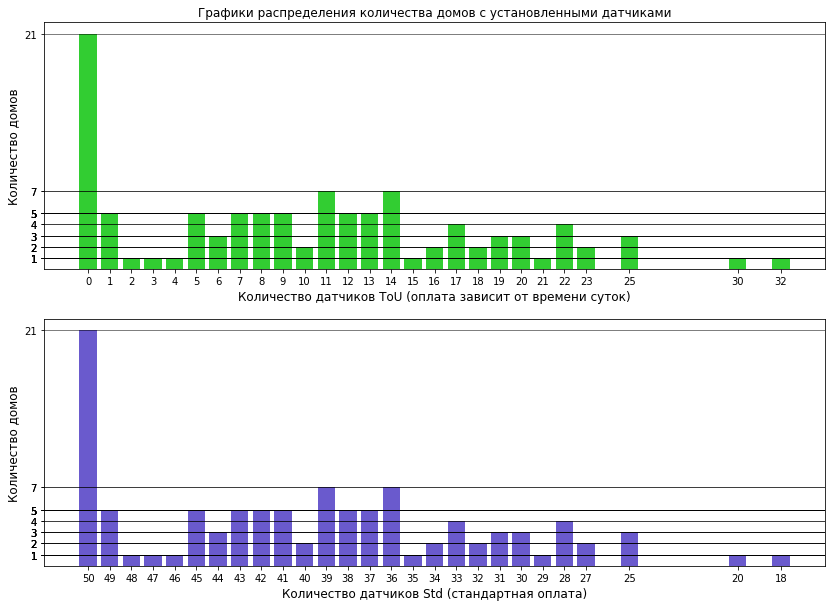

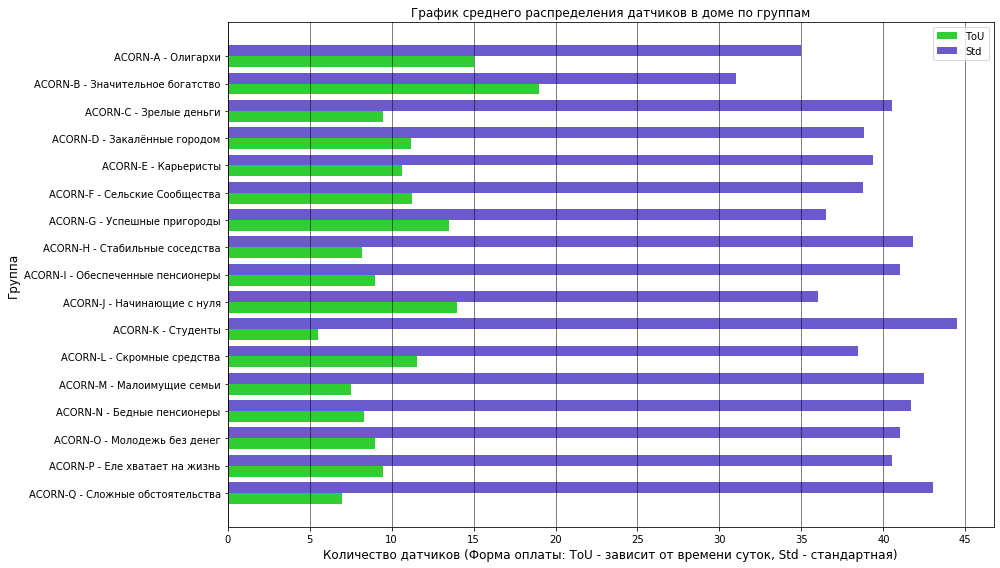

      Std  ToU    Acorn              Acorn_grouped       file
100    20   30  ACORN-A       1 Affluent Achievers    block_2
800    25   25  ACORN-E        2 Rising Prosperity   block_16
2050   25   25  ACORN-E        2 Rising Prosperity   block_41
1850   25   25  ACORN-E        2 Rising Prosperity   block_37
3150   27   23  ACORN-H  3 Comfortable Communities   block_63
2100   27   23  ACORN-E        2 Rising Prosperity   block_42
1950   28   22  ACORN-E        2 Rising Prosperity   block_39
850    28   22  ACORN-E        2 Rising Prosperity   block_17
1550   28   22  ACORN-E        2 Rising Prosperity   block_31
3900   28   22  ACORN-L    4 Financially Stretched   block_78
2000   29   21  ACORN-E        2 Rising Prosperity   block_40
1900   30   20  ACORN-E        2 Rising Prosperity   block_38
1700   30   20  ACORN-E        2 Rising Prosperity   block_34
1600   30   20  ACORN-E        2 Rising Prosperity   block_32
1650   31   19  ACORN-E        2 Rising Prosperity   block_33
3950   3

In [28]:
# Графики распределения домов с датчиками разной формы оплаты по группам: блок grafic3.py
# в PyCharm этот код работает без ошибок

dct_acorn = get_acorn(path_dataset)  # получение списка категорий (групп) населения
# print(dct_acorn['Excluded_HH'])       # список исключенных домов
Excluded_HH = dct_acorn['Excluded_HH']

# чтение информации о домах
df = pd.read_csv(os.path.join(path_dataset, 'informations_households.csv'), encoding="cp1252")
# замена Acorn_grouped на правильную из файла CACI's_Acorn_Structure_(Uploaded_June_2014).pdf
df.drop('Acorn_grouped', axis=1, inplace=True)  # удаление колонки
df = pd.merge(df, df_tra[['Acorn', 'Acorn_grouped']], on='Acorn', how='left')
# print(df.columns.values)
# у некоторых домов датчики приписаны к разным группам Acorn - заменим на одну преобладающую группу
# список домов
houses = set(df.file.to_list())
for house in houses:
    # сводная таблица по дому: в какие группы он попадает
    pvt = df[df.file == house].pivot_table(columns='Acorn', index='file', values='LCLid',
                                           aggfunc='count', fill_value=0)
    # имя группы, в которой максимальное поличество датчиков
    max_acorn = pvt.loc[:, pvt.loc[house] == pvt.loc[house].max()].columns.tolist()[0]
    df.loc[df.file.isin([house]), 'Acorn'] = max_acorn

# Сводная таблица по форме оплаты
pivot = df.pivot_table(columns='stdorToU', index='file', values='LCLid', aggfunc='count', fill_value=0)
pivot = pivot.query('file not in @Excluded_HH')     # отберем только правильные дома
print(f'Форма оплаты: Стандартная, количество домов: {len(pivot.query("Std > 0 and ToU == 0"))}')
print(f'Форма оплаты: От времени суток, количество домов: {len(pivot.query("ToU > 0 and Std == 0"))}')
pvt = pd.merge(pivot, df[['Acorn', 'Acorn_grouped', 'file']], left_index=True, right_on='file').drop_duplicates()
pvt = pvt.sort_values(by='ToU', ascending=False)
pvt['LCL'] = pvt.ToU + pvt.Std                          # количество датчиков во всех домах = 50
pvt.to_csv(os.path.join(path_dataset, 'hh_ToU_Std.csv'), index=False)

pvt_acorn = pvt.groupby('Acorn').mean()                 # группировка по группе
pvt_acorn['acorn'] = pvt_acorn.index
pvt_acorn = pvt_acorn.sort_values(by='acorn', ascending=False)
for ind in pvt_acorn.index:
    pvt_acorn.loc[ind, 'name_acorn'] = ind + ' - ' + trans_acorn(ind)

cg = ['limegreen', 'slateblue']  # задание цвета для гистограммы
# построим распределение датчиков с разными формами оплаты по домам
# сводные таблицы по формам оплаты
ToU = pvt.pivot_table(columns='LCL', index='ToU', values='file', aggfunc='count', fill_value=0)
Std = pvt.pivot_table(columns='LCL', index='Std', values='file', aggfunc='count', fill_value=0)
# наименование колонки в сводных таблицах
ToU.columns = ['HH']
Std.columns = ['HH']
# отображение гистограммы
fig, ax = plt.subplots(2, 1, figsize=(14, 10))
for i in range(2):
    if i:
        x = -Std.index
        y = Std.HH
        ax[i].set_xlabel(u'Количество датчиков Std (стандартная оплата)', fontsize=12)
    else:
        x = ToU.index
        y = ToU.HH
        ax[i].set_title(u'Графики распределения количества домов с установленными датчиками')
        ax[i].set_xlabel(u'Количество датчиков ToU (оплата зависит от времени суток)', fontsize=12)
        ax[i].set_xticks(x)
    ax[i].bar(x, y, color=cg[i])
    # отображение меток на осях в нужном виде
    xsticks = abs(x)
    ysticks = y
    plt.xticks(x, xsticks)
    ax[i].set_yticks(ysticks)
    ax[i].set_ylabel(u'Количество домов', fontsize=12)
    for h in y: ax[i].axhline(y=h, color='k', linewidth=0.5)
# сохранение картинки
plt.savefig(os.path.join(path_dataset, 'png', f'3_1.png'))
plt.show()
# по гистограммам видно, что в домах преобладают датчики со стандартной формой оплаты

# построим распределение датчиков с разными формами оплаты по группам
fig, ax = plt.subplots(figsize=(14, 8))
ax.set_title(u'График среднего распределения датчиков в доме по группам')
ax.set_xlabel(u'Количество датчиков (Форма оплаты: ToU - зависит от времени суток, Std - стандартная)', fontsize=12)
ax.set_ylabel(u'Группа', fontsize=12)
height = 0.4  # высота (толщина) полосы
x = np.arange(len(pvt_acorn.acorn))
ax.barh(x - height / 2, pvt_acorn.ToU, height, color=cg[0], label='ToU')
ax.barh(x + height / 2, pvt_acorn.Std, height, color=cg[1], label='Std')
# отображение меток на осях в нужном виде
ax.set_xticks(range(0, 50, 5))
ax.set_yticks(x)
ax.set_yticklabels(pvt_acorn.name_acorn)
for h in range(0, 50, 5): ax.axvline(x=h, color='k', linewidth=0.5)
ax.legend()
fig.tight_layout()
# сохранение картинки
plt.savefig(os.path.join(path_dataset, 'png', f'3_2.png'))
plt.show()
# наибольшее кол-во датчиков с формой оплаты от времени суток в первых двух группах

# из полученных данных видно, что дома с одной формой оплаты имеются только со стандартной 21 дом,
# в остальных домах из выборки присутствуют датчики с обеими формами оплаты, для исследования возьмем дома
# с датчиками разной формы оплаты и примерно одинаковым количеством датчиков и из разных групп Acorn
# список домов с датчиками по форме оплаты разного типа, разница между которыми не превышает 20% (по принципу 80 на 20)
# список охватил не все подгруппы, увеличим до 50%
pvt = pivot.query('abs(ToU - Std) <= Std*0.5').sort_values(by='ToU', ascending=False)
pvt = pd.merge(pvt, df[['Acorn', 'Acorn_grouped', 'file']], left_index=True, right_on='file').drop_duplicates()
print(pvt)
# для исследования энергопотребления возьмем по 1 дому из разных групп
hh_dct = defaultdict()
for ind in pvt.index:
    key = pvt.loc[ind, 'Acorn_grouped']
    if key not in hh_dct.keys():
        hh_dct[key] = pvt.loc[ind, 'file']
form_pay_hh = list(hh_dct.values())
print(f'Для исследования выбраны дома:\n{form_pay_hh}')
# для исследования энергопотребления возьмем дома из разных групп для п.5 плана
# form_pay_hh = ['block_2', 'block_16', 'block_63', 'block_78', 'block_106']
# составление словаря: дом_тип датчика - количество датчиков
cnt_id = defaultdict(list)
for ind in pvt.index:
    # if pvt.loc[ind, 'file'] not in form_pay_hh: continue
    for LCL in ['ToU', 'Std']:
        key = pvt.loc[ind, 'file'] + '_' + LCL
        val = pvt.loc[ind, LCL]
        cnt_id[key] = val
# print(len(cnt_id.keys()))
# cnt_id = {'block_2_ToU': 30, 'block_2_Std': 20,
#           'block_16_ToU': 25, 'block_16_Std': 25,
#           'block_63_ToU': 23, 'block_63_Std': 27,
#           'block_78_ToU': 22, 'block_78_Std': 28,
#           'block_106_ToU': 18, 'block_106_Std': 32}

Для дальнейших исследований энергопотребления возьмем данные из архива halfhourly_dataset.zip по отобранным домам за корректный период. Объединим эти данные в один датафрейм с группировкой датчиков по форме оплаты, т.е. для одного дома будет 2 колонки: сумма потребленной энергии по датчикам «ToU» и «Std», записанных с получасовым интервалом. 

In [30]:
# для исследования энергопотребления возьмем дома из разных групп: блок my_temp_LCLid.py

start_time = time.time()

form_pay_hh = ['block_2', 'block_16', 'block_63', 'block_78', 'block_106']
# возьмем информацию по датчикам за период
bdate = "2012-09-01"
edate = "2014-03-01"

# чтение информации о домах
df_hh = pd.read_csv(os.path.join(path_dataset, 'informations_households.csv'), encoding="cp1252")
# удалим лишние колонки и данные о домах
df_hh = df_hh.drop(df_hh.columns[[2, 3]], axis=1)
df_hh = df_hh.query('file in @form_pay_hh')
# print(df_hh)
make_df = True
for name_hh in form_pay_hh:
    # создание словаря: список датчиков по форме оплаты
    df_id = df_hh.query('file == @name_hh')
    dct_id = defaultdict(list)
    # for ind in df_id.index:
    #     dct_id[df_id.loc[ind, 'stdorToU']].append(df_id.loc[ind, 'LCLid'])
    for LCL in list(df_id.stdorToU.unique()):
        dct_id[LCL] = df_id.query('stdorToU == @LCL').LCLid.to_list()
    # print(dct_id)
    # чтение блока данных о потреблении энергии одного дома
    file_house = f'{name_hh}.csv'
    print(f'Обрабатываю файл {file_house}')
    df = pd.read_csv(os.path.join(path_dataset, 'halfhourly_dataset', file_house), encoding="cp1252", low_memory=False)
    df = df.query('tstp >= @bdate and tstp < @edate')
    df.columns = ['LCLid', 'tstp', 'energy']        # переименование колонок
    # иначе эта колонка распознается как object
    df.energy = pd.to_numeric(df.energy, errors='coerce').fillna(0, downcast='infer') # замена Null
    # print(df.columns.values)
    # print(df.info())
    # сводная таблица потребления энергии за день по всем датчикам LCLid, tstp, energy(kWh/hh)
    pivot = df.pivot_table(columns='LCLid', index='tstp', values='energy', aggfunc='sum', fill_value=0)
    # формирование списка датчиков - столбцов сводной таблицы
    for type_id in ['ToU', 'Std']:
        name_id = list(dct_id[type_id])
        for name_i in name_id[::]:
            if name_i not in list(pivot.columns.values):  # если датчика нет в сводной таблице - удалить его
                name_id.remove(name_i)
        # print(name_id)
        # таблица сумм по всем датчикам одного типа за период
        e_sum = pd.DataFrame(pivot[name_id].sum(axis=1))
        # переименование колонки в метку дома
        e_sum.columns = [name_hh+'_'+type_id]
        # print(e_sum)
        # создание датафрейма из сводных таблиц по домам
        if make_df:
            energy_sum = e_sum
            make_df = False
        else:
            energy_sum = pd.merge(energy_sum, e_sum, on='tstp', how='outer')

energy_sum.fillna(value=0, inplace=True) # заполнение отсутствующих значений нулями
# добавление колонок даты и времени
energy_sum.insert(0, 'time', 0)
energy_sum.insert(0, 'day', 0)
energy_sum.time = pd.to_datetime(energy_sum.index)             # преобразование индекса в дату
energy_sum.day = energy_sum.time.dt.date
energy_sum.time = energy_sum.time.dt.strftime("%H:%M")
# в данных есть мусорные строки вида 2013-10-29 09:33 фиксация данных вне отведенного времени -
# их исключаем строка для проверки корректности данных времени
hm = [str(h).rjust(2, '0') + ':' + str(m).rjust(2, '0') for h in range(24) for m in range(0, 40, 30)]
# отфильтруем только данные, которые записаны с получасовым интервалом.
energy_sum = energy_sum.query('time in @hm')
# print(energy_sum)
# сохранение сводного датафрейма в файл без индекса
energy_sum.to_csv(os.path.join(path_dataset, 'my_form_pay_hh.csv'), index=False)
print("--- %s секунд выполнялось ---" % (time.time() - start_time))

Обрабатываю файл block_2.csv
Обрабатываю файл block_16.csv
Обрабатываю файл block_63.csv
Обрабатываю файл block_78.csv
Обрабатываю файл block_106.csv
--- 17.456998348236084 секунд выполнялось ---


Исследование энергопотребления по отобранным домам.

In [31]:
# для исследования энергопотребления возьмем дома из разных групп для п.5 плана

form_pay_hh = ['block_2', 'block_16', 'block_63', 'block_78', 'block_106']

cnt_id = {'block_2_ToU': 30, 'block_2_Std': 20,
          'block_16_ToU': 25, 'block_16_Std': 25,
          'block_63_ToU': 23, 'block_63_Std': 27,
          'block_78_ToU': 22, 'block_78_Std': 28,
          'block_106_ToU': 18, 'block_106_Std': 32}

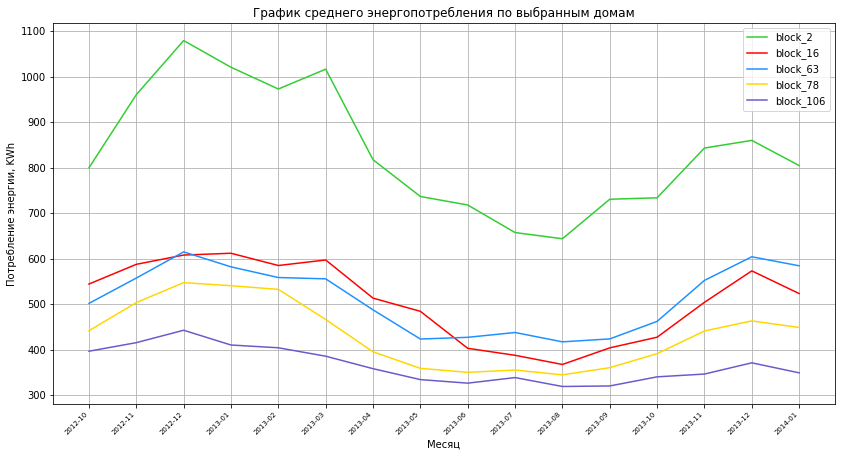

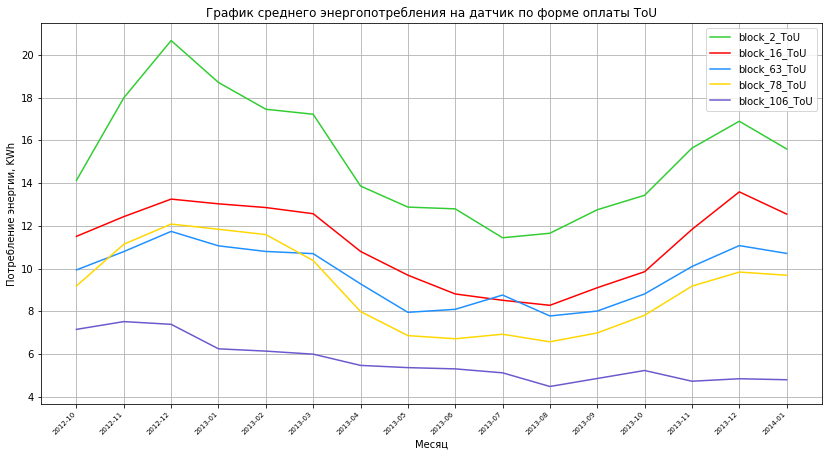

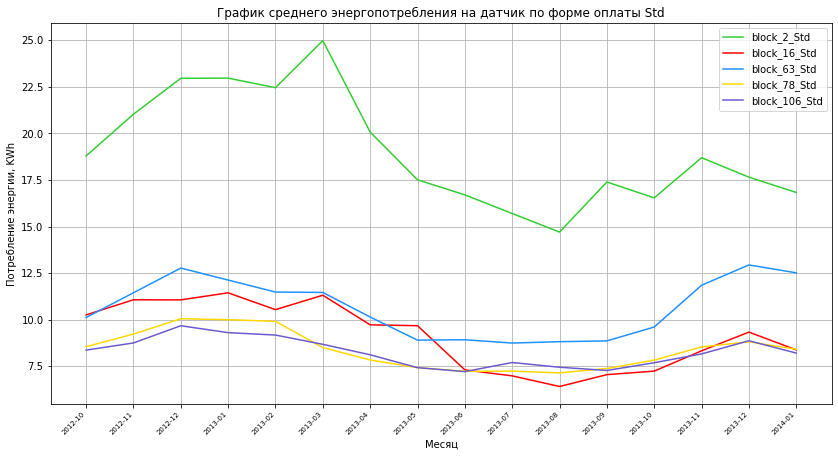

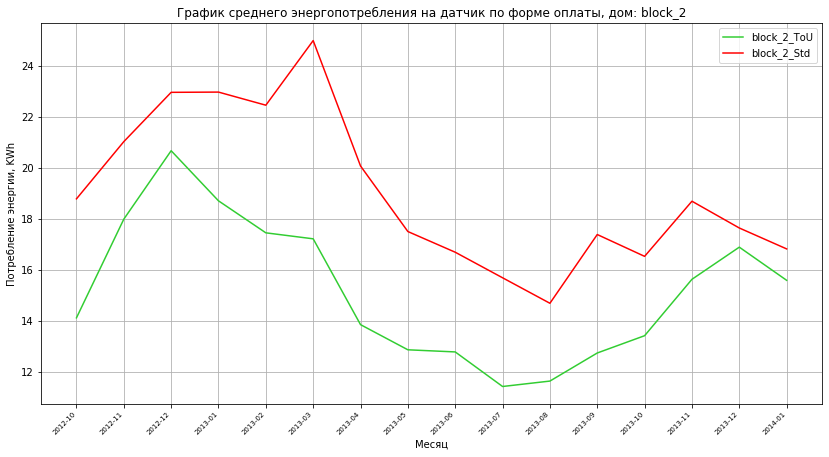

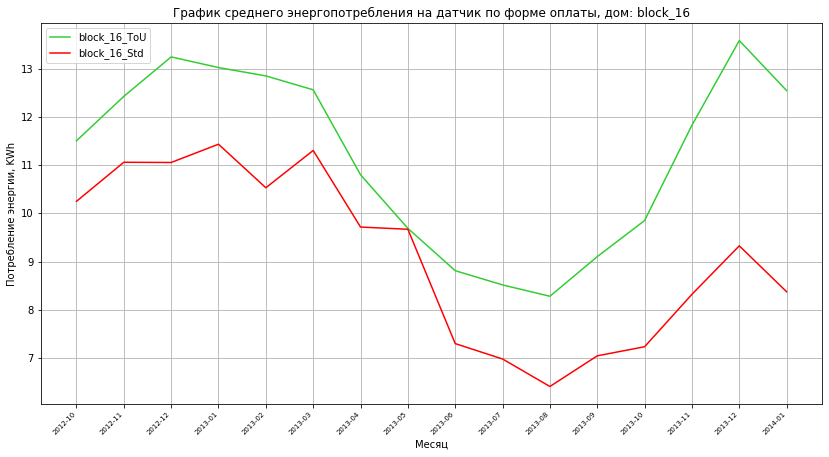

...

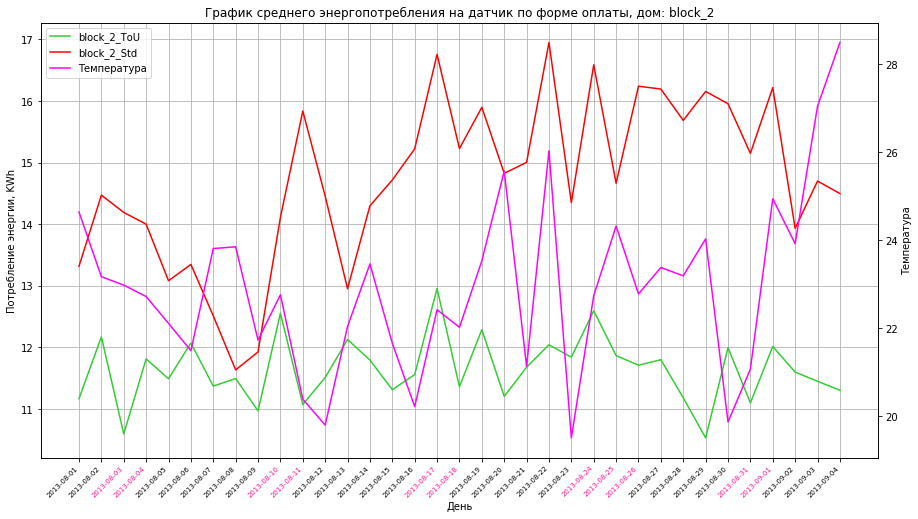

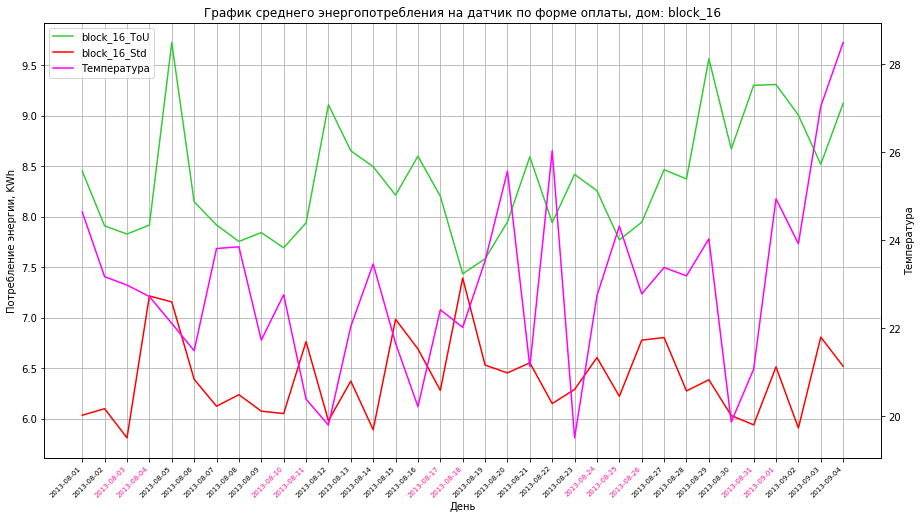

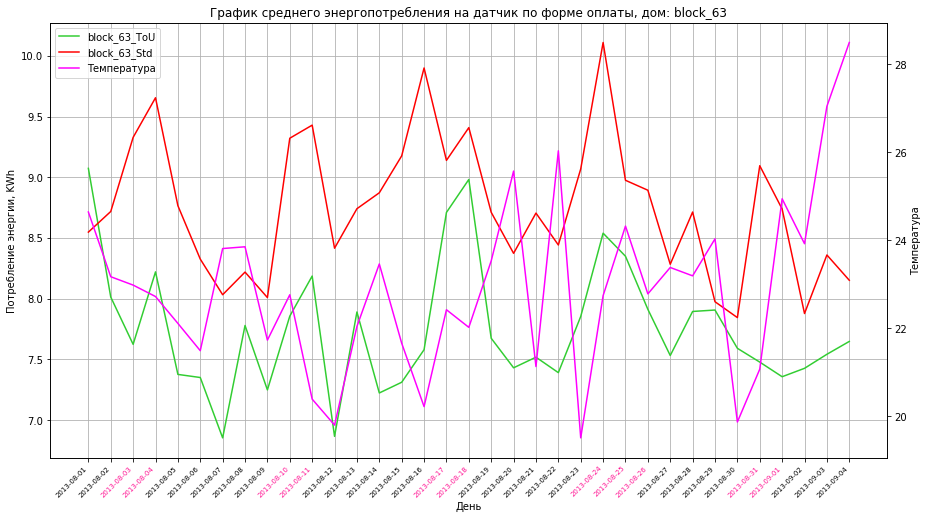

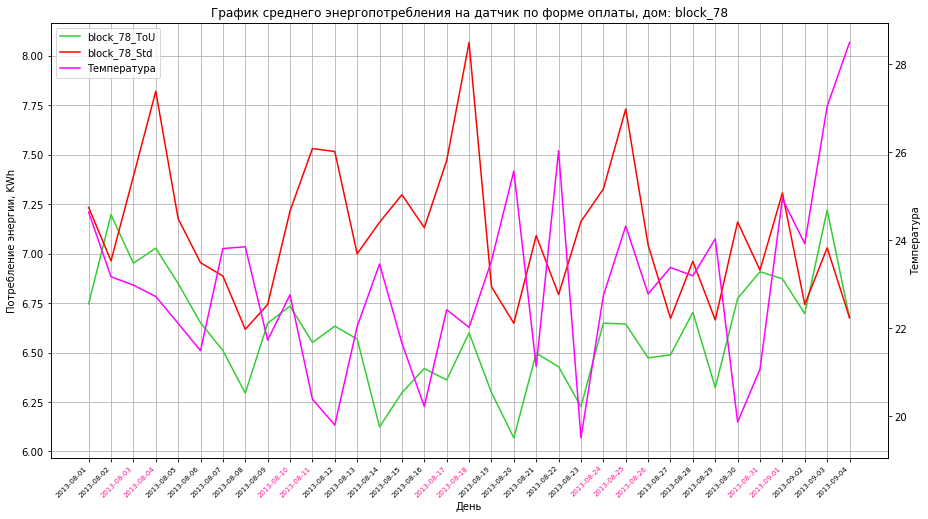

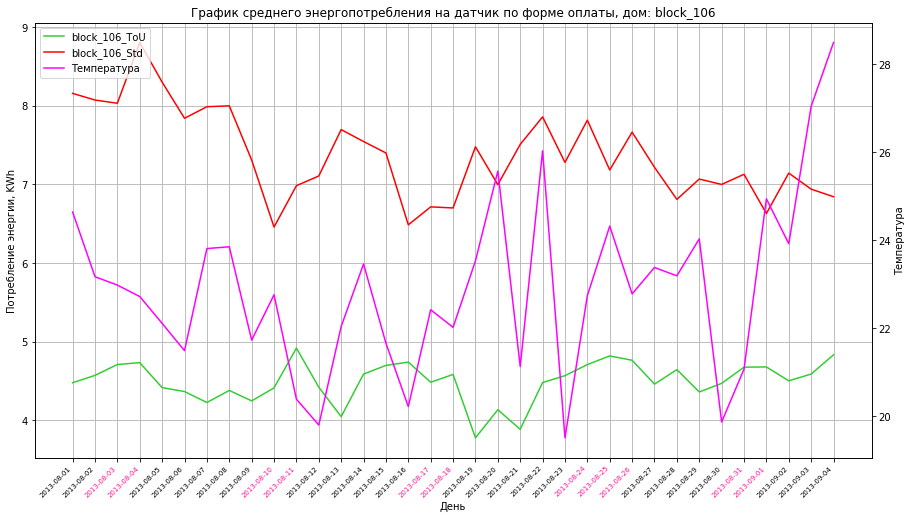

In [32]:
# для исследования энергопотребления возьмем дома из разных групп для п.5 плана: блок grafic4.py

def show_block_graf(bdate, edate, sdf, ttl, pnf, show_temp=0):
    # чтение данных о погоде
    df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")
    # данные о погоде за выбранный период c необходимыми колонками
    # метеоусловия, которые могут влиять на энергопотребление
    name_cols = ['time', 'temperatureMax', 'temperatureMin']
    df_wd = df_wd.query('time >= @bdate & time < @edate')[name_cols]
    # в колонке 'day' оставить только дату и преобразовать в строку, т.к. все даты в датасете загружаются как строки
    df_wd['day'] = pd.to_datetime(df_wd.time).dt.strftime("%Y-%m-%d")
    df_wd = df_wd.sort_values(by='day')

    # отображение графика
    colours = ['limegreen', 'red', 'dodgerblue', 'gold', 'slateblue', 'magenta', 'b', 'g', 'y', 'cyan']
    if show_temp:
        sizef = (15, 8)
    else:
        sizef = (14, 7)
    fig, ax = plt.subplots(figsize=sizef)
    ax.set_title(ttl[0])
    x = sdf.index.to_list()
    nf = []
    lines = []
    for i in range(len(sdf.columns.values)):
        name_id = sdf.columns.values[i]
        y = sdf[name_id].to_list()
        line, = ax.plot(x, y, color=colours[i], label=name_id)
        lines.append(line)
        nf.append(name_id)
    #
    # для графика по месяцу добавим температуру
    if show_temp:
        xsticks = x
        ax.set_xticks(xsticks)
        if bdate < '2013-08-01':
            y = df_wd.temperatureMin.to_list()
        else:
            y = df_wd.temperatureMax.to_list()
        ax2 = ax.twinx()
        ax2.set_ylabel(u'Температура', fontsize=10)
        line, = ax2.plot(df_wd.day.to_list(), y, 'magenta')
        lines.append(line)
        nf.append('Температура')
    #
    color_weekends = 'deeppink'
    # список цветов для отображения рабочих/выходных дней
    colors = [color_weekends if d in parsing_dates(bdate, edate, 'weekends') else 'k' for d in x]
    # расцвечивание дат
    for xtick, color in zip(ax.get_xticklabels(), colors): xtick.set_color(color)

    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=5)
    ax.grid()
    ax.set_xlabel(ttl[1], fontsize=10)
    ax.set_ylabel(ttl[2], fontsize=10)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=7)
    plt.legend(lines, nf)
    # plt.legend()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'4_{pnf}.png'))
    plt.show()


def show_gm(day_sum, bdate, edate, show_temp=0):
    d_sum = day_sum.query('day >= @bdate and day < @edate')
    d_sum = d_sum.sort_values(by='day')
    # будем исследовать энергопотребление в среднем по датчику
    for LCL, cnt in cnt_id.items():
        d_sum[LCL] = d_sum[LCL] / cnt
    ttl = [u'График среднего энергопотребления в день по формам оплаты', u'Дата', u'Потребление энергии, KWh']
    # строим график по одному дому
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std']]  # колонки для отображения
        show_block_graf(bdate, edate, d_sum[name_cols], ttl, f'{bdate}_{hh}', show_temp=show_temp)

# чтение подготовленных данных
df_phh = pd.read_csv(os.path.join(path_dataset, 'my_form_pay_hh.csv'))


periodys = ['2012-10-01', '2014-02-01', '2012-12-23', '2013-01-28', '2013-08-01', '2013-09-05']
for num_graf in range(3):
    # i == 0 график за год
    # i == 1 график за период мах энергопотребления
    # i == 2 график за период мin энергопотребления
    bdate = periodys[2 * num_graf]
    edate = periodys[2 * num_graf + 1]
    df = df_phh.query('day >= @bdate and day < @edate')
    day_sum = df.groupby('day').sum()
    # добавление графы год-месяц
    day_sum['year_month'] = pd.to_datetime(day_sum.index, format='%Y-%m-%d')
    if num_graf:
        ttl2 = u'День'
        day_sum['year_month'] = day_sum.year_month.dt.strftime("%Y-%m-%d")  # это для подневного графика
    else:
        ttl2 = u'Месяц'
        day_sum['year_month'] = day_sum.year_month.dt.strftime("%Y-%m")     # это для помесячного графика
    y_sum = day_sum.groupby('year_month').mean()
    y_sum = y_sum.sort_values(by='year_month')
    # суммирование значений по датчикам разной формы оплаты
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std']]
        y_sum[hh] = y_sum[name_cols].sum(axis=1)
    ttl = [u'График среднего энергопотребления по выбранным домам', ttl2, u'Потребление энергии, KWh']
    show_block_graf(bdate, edate, y_sum[y_sum.columns.values[-len(form_pay_hh):]], ttl, f'{bdate}_1', show_temp=num_graf)

    # на этих графиках видно, что максимум энергопотребления приходится на январь, минимум - на август,
    # что соответствует прежним выводам, кроме дома block_63, у которого в мае 2013 года возросло энергопотребление
    # по сравнению с общим трендом и максимум энергопотребления приходится на декабрь

    # т.к домов с одинаковым количество датчиков разной формой оплаты для разных групп населения нет
    # - тогда будем исследовать энергопотребление в среднем по датчику
    for LCL, cnt in cnt_id.items():
        y_sum[LCL] = y_sum[LCL] / cnt
    for LCL in ['ToU', 'Std']:
        name_cols = [name_col for name_col in y_sum.columns.values[:-len(form_pay_hh)] if LCL in name_col]
        ttl = [u'График среднего энергопотребления на датчик по форме оплаты {}'.format(LCL), ttl2,
               u'Потребление энергии, KWh']
        show_block_graf(bdate, edate, y_sum[name_cols], ttl, f'{bdate}_2_{LCL}', show_temp=num_graf)

    # строим график по одному дому
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std']]  # колонки для отображения
        ttl = [u'График среднего энергопотребления на датчик по форме оплаты, дом: {}'.format(hh), ttl2,
               u'Потребление энергии, KWh']
        show_block_graf(bdate, edate, y_sum[name_cols], ttl, f'{bdate}_3_{hh}', show_temp=num_graf)
    # тут складывается такая картина: в одной группе (block_16) преобладает энергопотребление по датчикам 'ToU',
    # в других группах (block_2, block_63, block_106) по датчикам 'Std', в одной группе энергопотребление по датчикам 'ToU'
    # преобладает в холодные сезоны, а в теплые сезоны, наоборот больше энергопотребления по датчикам 'Std'.
    # Еще такая аномалия: в марте в группах (block_2 и block_16) выброс по датчикам 'Std' аналогичен потреблению
    # в зимние месяцы - у богатых свои причуды...

In [36]:
# составление матриц корреляции энергопотребления по отобранным домам: блок grafic4_1.py

# чтение подготовленных данных
df_phh = pd.read_csv(os.path.join(path_dataset, 'my_form_pay_hh.csv'))
# датафрейм с коэффициентами корреляции энергопотребления
df_corr_matrix = pd.DataFrame(columns=['param', 'moonPhase', 'bdate', 'edate', 'year_month', 
                                       'energy_sum', 'absv'])

periodys = ['2012-10-01', '2014-02-01', '2012-12-23', '2013-01-28', '2013-08-01', '2013-09-05']
for num_graf in range(1, 3):
    # i == 0 график за год
    # i == 1 график за период мах энергопотребления
    # i == 2 график за период мin энергопотребления
    bdate = periodys[2 * num_graf]
    edate = periodys[2 * num_graf + 1]
    df = df_phh.query('day >= @bdate and day < @edate')
    day_sum = df.groupby('day').sum()
    # добавление графы год-месяц
    day_sum['year_month'] = pd.to_datetime(day_sum.index, format='%Y-%m-%d')
    if num_graf:
        ttl2 = u'День'
        day_sum['year_month'] = day_sum.year_month.dt.strftime("%Y-%m-%d")  # это для подневного графика
    else:
        ttl2 = u'Месяц'
        day_sum['year_month'] = day_sum.year_month.dt.strftime("%Y-%m")     # это для помесячного графика
    y_sum = day_sum.groupby('year_month').mean()
    y_sum = y_sum.sort_values(by='year_month')
    # суммирование значений по датчикам разной формы оплаты
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std']]
        y_sum[hh] = y_sum[name_cols].sum(axis=1)
    y_sum.insert(0, 'day', 0)
    y_sum.day = pd.to_datetime(y_sum.index, format='%Y-%m-%d')  # преобразование индекса в дату
    y_sum.day = y_sum.day.dt.strftime("%Y-%m-%d")
    name_cols = ['day']
    name_cols += list(y_sum.columns.values[-len(form_pay_hh):])
    # расчет матрицы корреляции для всего датасета
    make_df(bdate, edate, show_result=0, make_all_corr=False, show_corr=False, make_df_corr=True,
            moonPhase='dataset')
    # расчет матрицы корреляции для данных по отобранным пяти домам
    make_df(bdate, edate, show_result=0, make_all_corr=False, show_corr=False, make_df_corr=True,
            moonPhase='five_hh',  df_sum=y_sum[name_cols])

    for hh in form_pay_hh:
        name_cols = ['day', hh]
        # расчет матрицы корреляции для одного дома
        make_df(bdate, edate, show_result=0, make_all_corr=False, show_corr=False, 
                make_df_corr=True, moonPhase=hh, df_sum=y_sum[name_cols])
# экспорт посчитанных матриц в файл
df_corr_matrix.to_csv(os.path.join(path_dataset, 'export', f'df_corr_matrix.csv'))

# преобразование из датафрейма матриц строки по moonPhase в соответствующие колонки
df_corr_matrix['season'] = df_corr_matrix.bdate.apply(lambda x: 0 if x < "2013-08-01" else 1)
df_corr_matrix.drop(['bdate', 'edate', 'year_month'], axis=1, inplace=True)  # удаление колонки
name_cols = list(df_corr_matrix.moonPhase.unique())
seasons = ['Максимального', 'Минимального']
for num_season in range(2):
    for name_col in name_cols:
        df = df_corr_matrix.query('moonPhase == @name_col and season == @num_season')
        df = df[['param', 'energy_sum']]
        df.columns = ['param', name_col]
        if name_col == 'dataset':
            df_season = df
        else:
            df_season = pd.merge(df_season, df, on='param', how='outer')
    df_season.to_csv(os.path.join(path_dataset, 'export', f'df_season_{num_season}.csv'))
    print(f'Коэффициенты корреляции в период {seasons[num_season]} энергопотребления:')
    print(df_season[['param', 'dataset', 'block_2', 'block_16', 'block_63', 'block_78', 'block_106']])

Коэффициенты корреляции в период Максимального энергопотребления:
          param  dataset  block_2  block_16  block_63  block_78  block_106
0      dewPoint    -0.84    -0.22     -0.77      0.01     -0.57       0.18
1   temperature    -0.83    -0.24     -0.78      0.01     -0.58       0.22
2   windBearing    -0.75    -0.33     -0.50     -0.33     -0.65      -0.18
3      daylight     0.74    -0.16      0.71     -0.05      0.33      -0.14
4     moonPhase    -0.69    -0.42     -0.54     -0.44     -0.66      -0.26
5      pressure    -0.52    -0.41     -0.46     -0.60     -0.57      -0.47
6    visibility    -0.49    -0.12     -0.41      0.03     -0.32       0.25
7          icon    -0.23    -0.16     -0.08     -0.35     -0.29      -0.14
8      humidity    -0.22     0.08     -0.25      0.00     -0.06      -0.13
9    cloudCover     0.22     0.08      0.22     -0.04      0.16       0.13
10      uvIndex     0.21     0.00      0.05     -0.03      0.06      -0.08
11       numday     0.20    -0.08 

Посмотрим распределение энергопотребления по времени суток в периоды максимального и минимального энергопотребления:

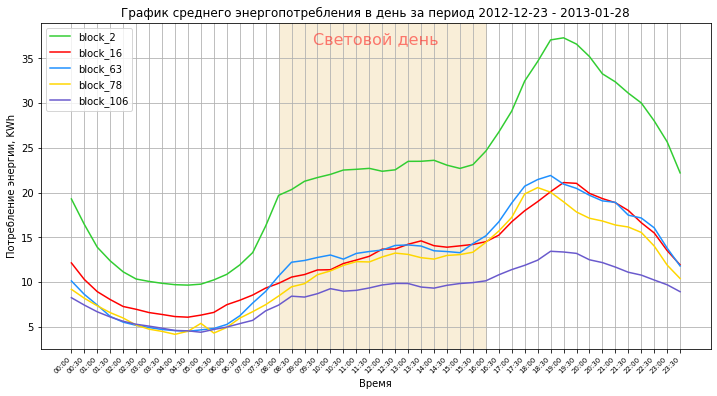

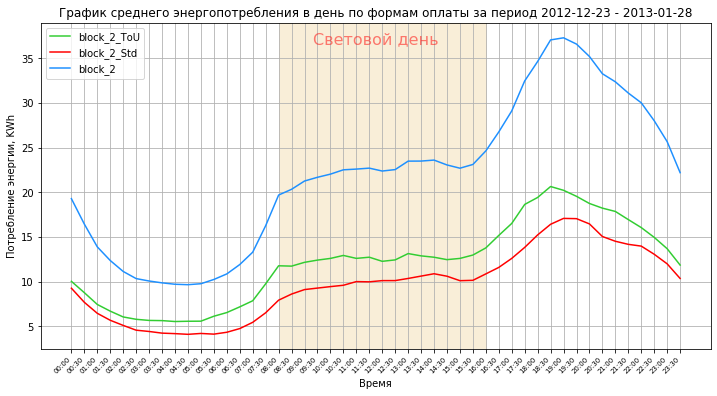

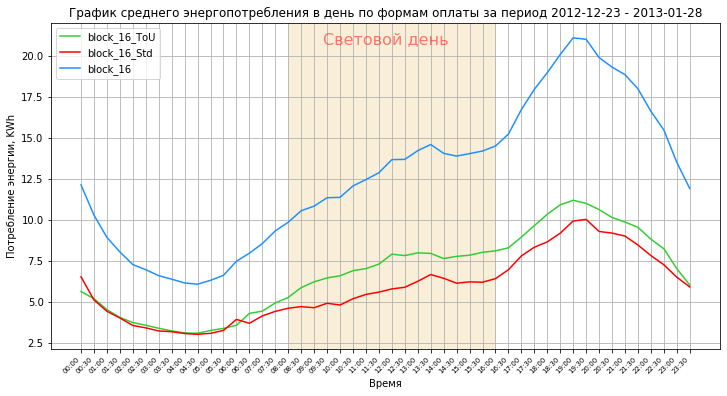

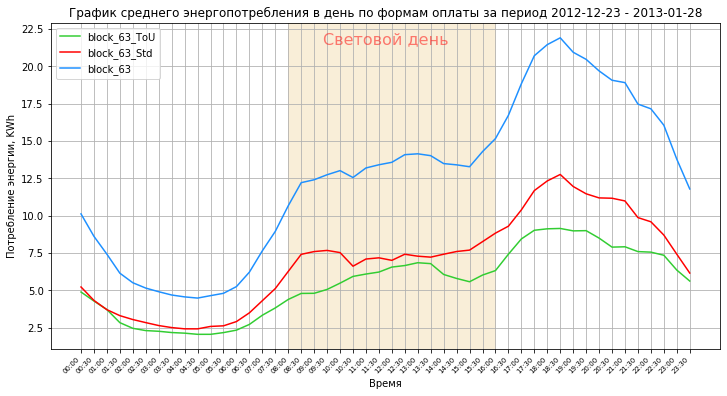

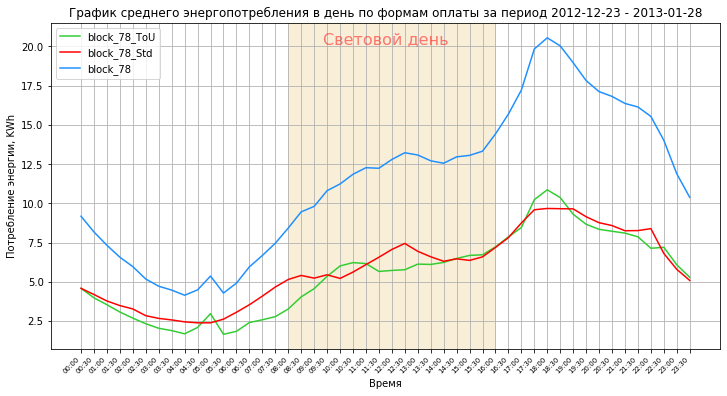

...

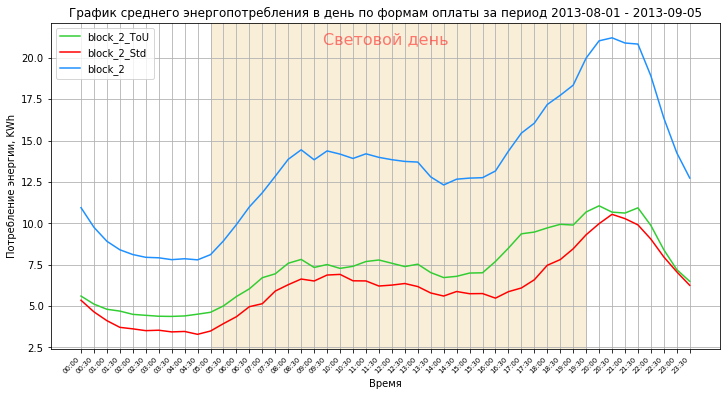

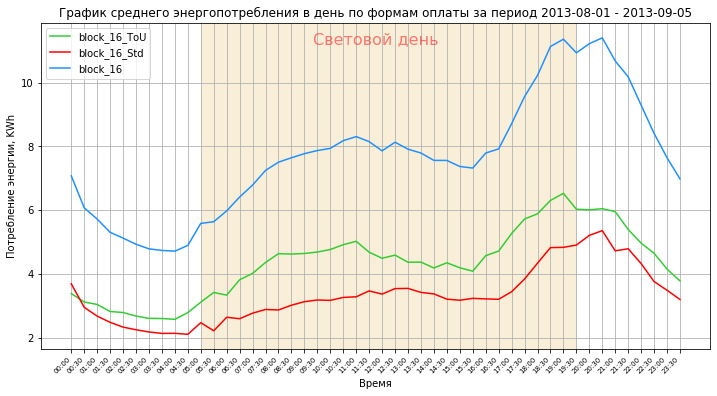

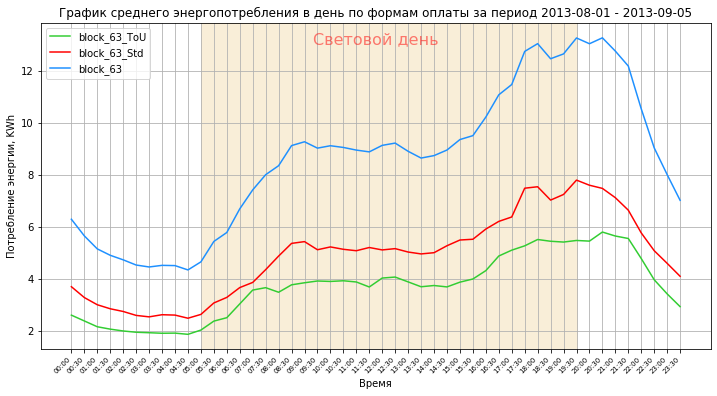

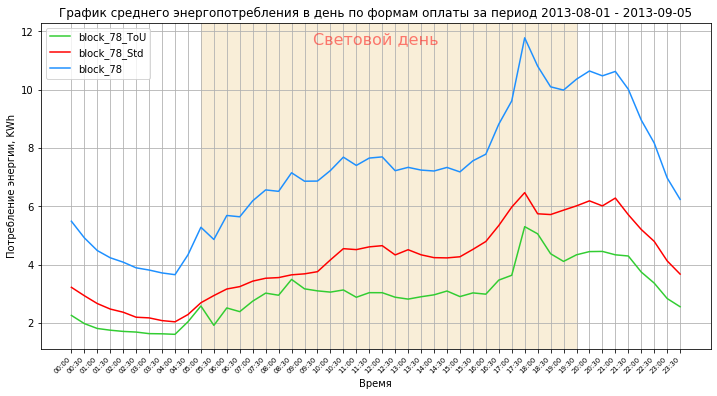

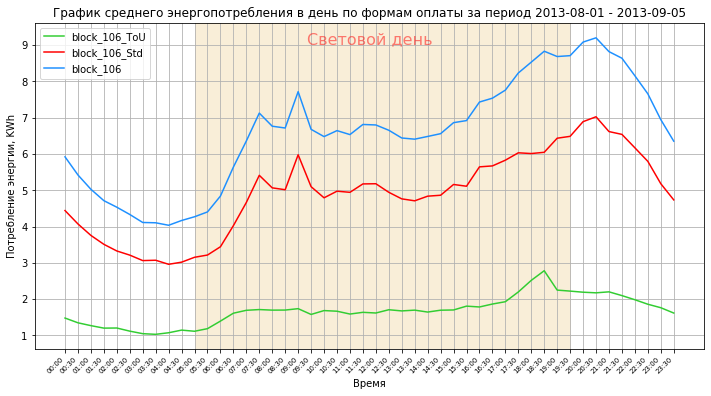

In [37]:
# распределение энергопотребления по времени суток: блок grafic4_2.py

form_pay_hh = ['block_2', 'block_16', 'block_63', 'block_78', 'block_106']

# чтение дневных данных о погоде
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")


def show_block_day(sdf, ttl, pnf, list_rise_set=[]):
    # отображение графика
    colours = ['limegreen', 'red', 'dodgerblue', 'gold', 'slateblue', 'magenta', 'b', 'g', 'y', 'cyan']
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.set_title(ttl[0])
    x = sdf.index.to_list()
    for i in range(len(sdf.columns.values)):
        name_id = sdf.columns.values[i]
        y = sdf[name_id].to_list()
        ax.plot(x, y, color=colours[i], label=name_id.replace('_summ', ''))
    ax.grid()
    ax.set_xlabel(ttl[1], fontsize=10)
    ax.set_ylabel(ttl[2], fontsize=10)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=7)
    plt.legend(loc='upper left')
    # выделение светового дня
    if len(list_rise_set):
        plt.axvspan(list_rise_set[0], list_rise_set[1], color='wheat', alpha=0.5)
        plt.text(0.5, 0.95, u'Световой день',
                 horizontalalignment='center',
                 verticalalignment='center',
                 fontsize=16, color='red', alpha=0.5,
                 transform=ax.transAxes)
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'4_{pnf}.png'))
    plt.show()


# чтение подготовленных данных
df_phh = pd.read_csv(os.path.join(path_dataset, 'my_form_pay_hh.csv'))

periodys = ['2012-10-01', '2014-02-01', '2012-12-23', '2013-01-28', '2013-08-01', '2013-09-05']
for num_graf in range(1, 3):
    # num_graf == 0 график за год
    # num_graf == 1 график за период мах энергопотребления
    # num_graf == 2 график за период мin энергопотребления

    bdate = periodys[2 * num_graf]
    edate = periodys[2 * num_graf + 1]
    df = df_phh.query('day >= @bdate and day < @edate')

    # запись времени восхода/захода солнца в переводе на получасовые интервалы
    list_rise_set = get_rise_set(df_wd, bdate, edate, list_rs=True)

    t_sum = df.groupby(['time']).mean()
    t_sum = t_sum.sort_values(by=['time'])
    # суммирование значений по датчикам разной формы оплаты
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std']]
        t_sum[f'{hh}_summ'] = t_sum[name_cols].sum(axis=1)
    # сумма по типам датчиков по всем домам на одном графике
    ttl = [u'График среднего энергопотребления в день за период {} - {}'.format(bdate, edate),
           u'Время', u'Потребление энергии, KWh']
    name_cols = [name_col for name_col in t_sum.columns.values if name_col.endswith('_summ')]
    show_block_day(t_sum[name_cols], ttl, f'{bdate}_4_summ', list_rise_set)
    # распределение по типам датчиков по каждому дому на одном графике
    ttl = [u'График среднего энергопотребления в день по формам оплаты за период {} - {}'
           .format(bdate, edate), u'Время', u'Потребление энергии, KWh']
    # строим график по одному дому (на график наложить время восхода-заката)
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std', 'summ']]  # колонки для отображения
        show_block_day(t_sum[name_cols], ttl, f'{bdate}_4_{hh}', list_rise_set)

Посмотрим на распределение энергопотребления по рабочим и выходным дням для выбранных домов для сравнения с аналогичным распределением по подгруппам в периоды максимального и минимального энергопотребления:

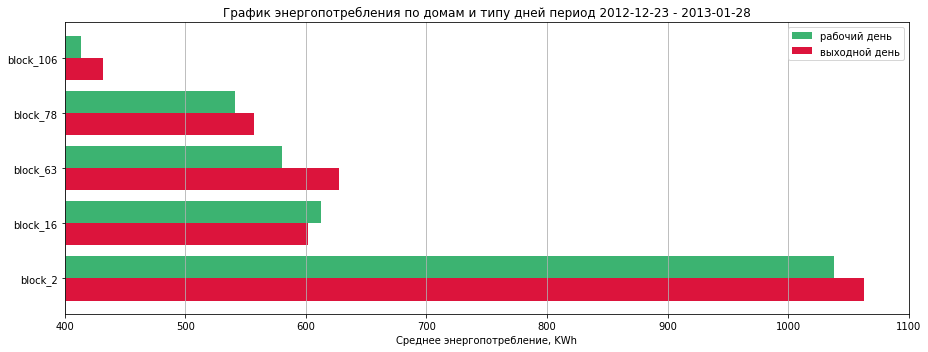

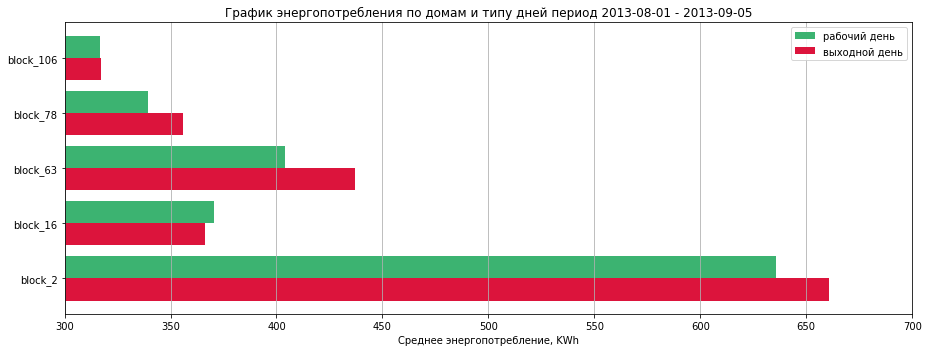

In [38]:
# Зависимость среднего энергопотребления на дом по группам по типу дней: блок grafic4_4.py

def show_grafic4_3(energy_sum, bdate, edate, form_pay_hh=[]):
    # данные по домам за выбранный период
    tmp_e_sum = energy_sum.query('day >= @bdate & day < @edate')
    cg = ['mediumseagreen', 'crimson']  # задание цвета для гистограммы
    fig, ax = plt.subplots(figsize=(13, 5))
    ax.set_title(u'График энергопотребления по домам и типу дней период {} - {}'.format(bdate, edate))
    days_mean = dict()
    for hh in form_pay_hh:
        # датафрейм с суммой потребления энергии по всем домам группы
        tmp_sum = tmp_e_sum[hh]  # среднее значение по дому в группе
        tmp_sum.columns = ['energy_sum']
        df_e = pd.merge(tmp_e_sum['day'], tmp_sum, left_index=True, right_index=True)
        df_e = df_e.sort_values(by='day')
        # разделение дней на рабочие и выходные
        sum_days = dict()
        for type_day in ['workdays', 'weekends']:
            list_days = parsing_dates(bdate, edate, type_date=type_day)
            e_sum = energy_sum.query('day in @list_days')
            # расчет среднего энергопотребления по всем домам по типу дня --> среднее в день
            sum_days[type_day] = e_sum[hh].mean()
        days_mean[hh] = sum_days
    days_mean = pd.DataFrame(days_mean).transpose()
    ax.set_xlabel(u'Среднее энергопотребление, KWh', fontsize=10)
    #
    # установка лимитов по оси Y и определение меток на оси Y
    xticks = []
    for type_day in ['workdays', 'weekends']:
        xticks.append(int(days_mean[type_day].min()))
        xticks.append(int(days_mean[type_day].max()))
    min_y = floor(min(days_mean.min().to_list()) / 100.0) * 100
    max_y = ceil(max(days_mean.max().to_list()) / 50.0) * 50
    xticks.append(min_y)
    xticks.append(max_y)
    xticks.append(int((max_y + min_y) / 2))
    for y in range(min_y, max_y, 100):
        xticks.append(y)
    xticks = sorted(set(xticks))
    ax.set_xlim(min_y, max_y)
    #
    # xticks = days_mean.index.to_list()
    height = 0.4  # толщина полосы
    x = np.arange(len(days_mean.index.to_list()))
    ax.set_yticks(x)
    ax.set_yticklabels(form_pay_hh)
    ax.barh(x + height / 2, days_mean.workdays, height, color=cg[0], label='рабочий день')
    ax.barh(x - height / 2, days_mean.weekends, height, color=cg[1], label='выходной день')
    ax.legend()
    ax.grid(axis='x')
    fig.tight_layout()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'4_4_{bdate}_{edate}_{hh}.png'))
    plt.show()

# чтение суммарной информации по домам (получено в блоке my_group_by_house.py)
energy_sum = pd.read_csv(os.path.join(path_dataset, 'my_energy_sum.csv'))

form_pay_hh = ['block_2', 'block_16', 'block_63', 'block_78', 'block_106']
periodys = ['2012-10-01', '2014-02-01', '2012-12-23', '2013-01-28', '2013-08-01', '2013-09-05']
for num_graf in range(1, 3):
    # num_graf == 0 график за год
    # num_graf == 1 график за период мах энергопотребления
    # num_graf == 2 график за период мin энергопотребления
    bdate = periodys[2 * num_graf]
    edate = periodys[2 * num_graf + 1]
    show_grafic4_3(energy_sum, bdate, edate, form_pay_hh=form_pay_hh)

Посмотрим на распределение энергопотребления в зависимости от времени суток по рабочим и выходным дням

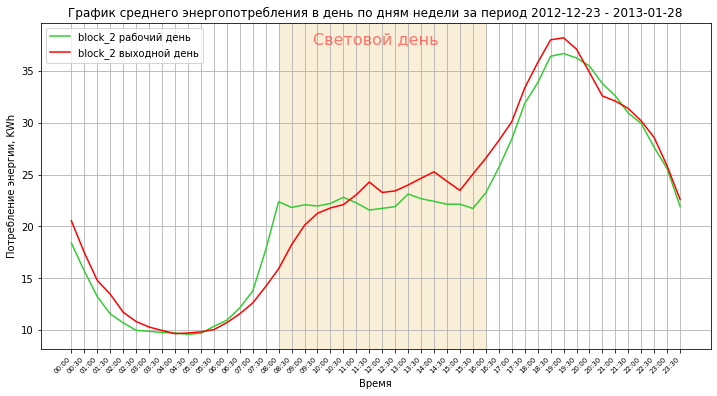

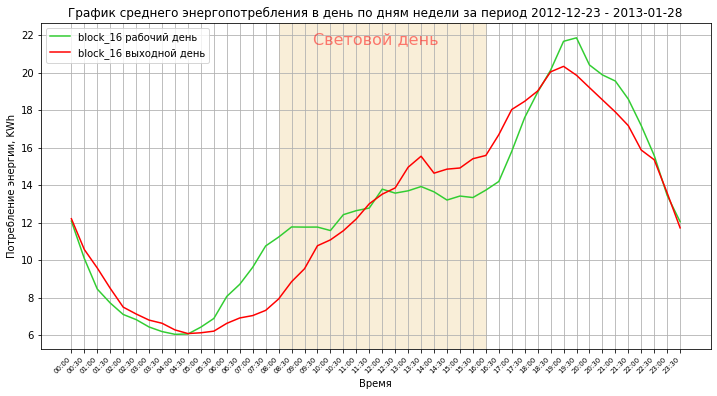

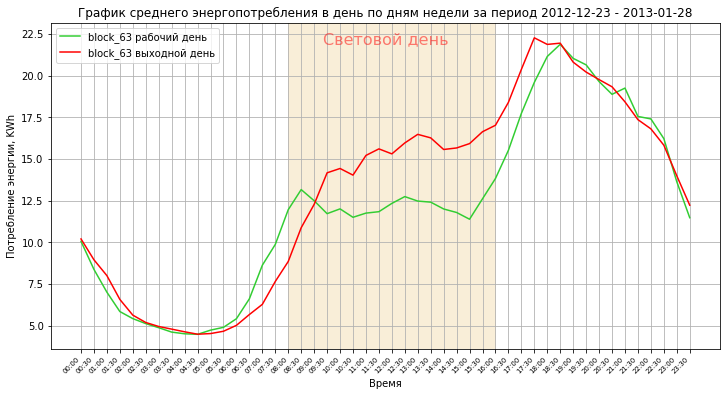

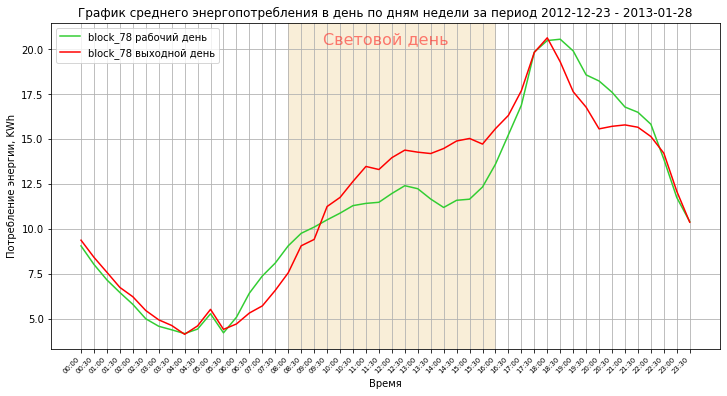

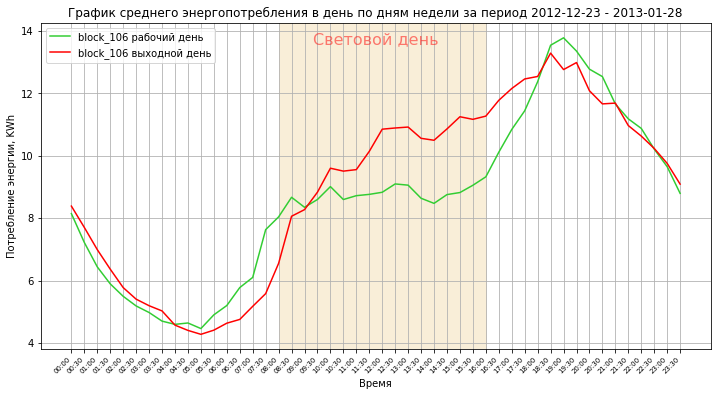

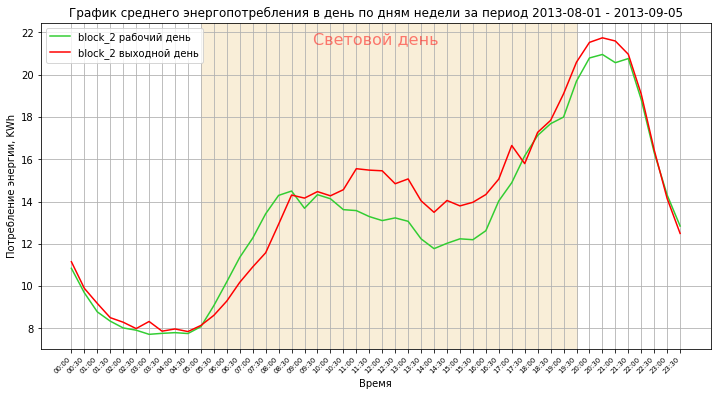

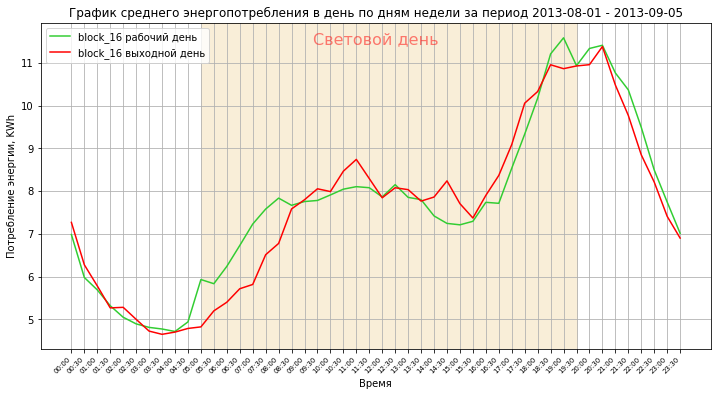

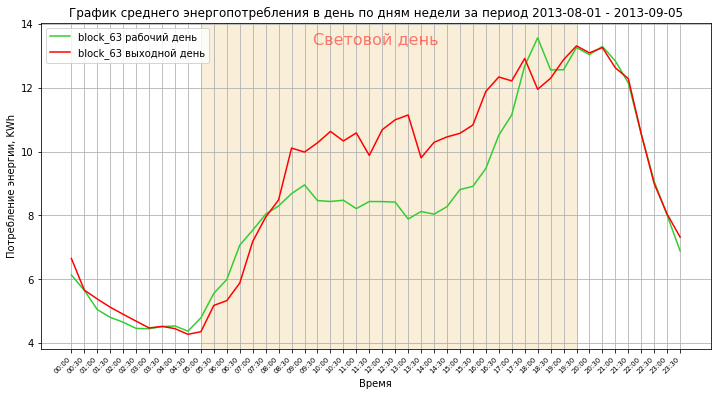

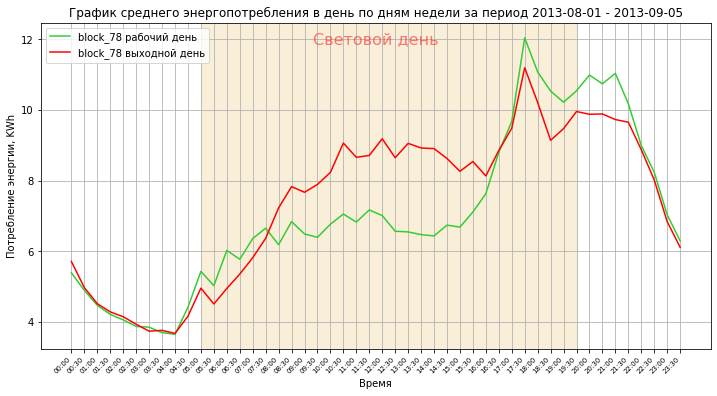

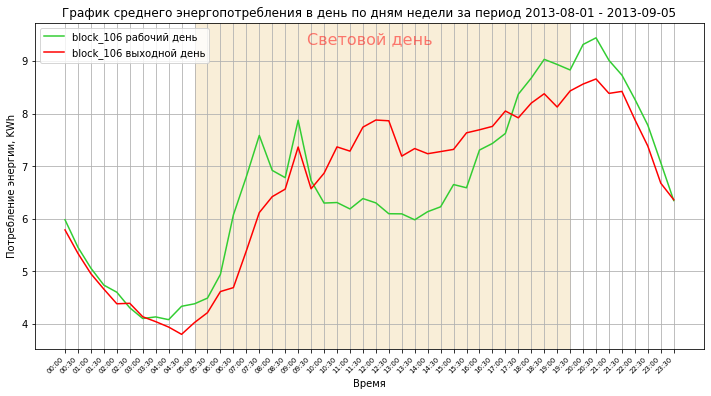

In [39]:
# распределение энергопотребления в зависимости от времени суток
# по рабочим и выходным дням: блок grafic4_3.py

form_pay_hh = ['block_2', 'block_16', 'block_63', 'block_78', 'block_106']

# чтение дневных данных о погоде
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")


def show_block_day3(sdf, ttl, pnf, list_rise_set=[]):
    # отображение графика
    colours = ['limegreen', 'red', 'dodgerblue', 'gold', 'slateblue', 'magenta', 'b', 'g', 'y', 'cyan', 'k']
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.set_title(ttl[0])
    x = sdf.index.to_list()
    for i in range(len(sdf.columns.values)):
        name_id = sdf.columns.values[i]
        y = sdf[name_id].to_list()
        name_id = name_id.split('-')
        if name_id[1] == 'workdays':
            name_id = name_id[0] + ' ' + 'рабочий день'
        else:
            name_id = name_id[0] + ' ' + 'выходной день'
        ax.plot(x, y, color=colours[i], label=name_id)
    ax.grid()
    ax.set_xlabel(ttl[1], fontsize=10)
    ax.set_ylabel(ttl[2], fontsize=10)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=7)
    plt.legend(loc='upper left')
    # выделение светового дня
    if len(list_rise_set):
        plt.axvspan(list_rise_set[0], list_rise_set[1], color='wheat', alpha=0.5)
        plt.text(0.5, 0.95, u'Световой день',
                 horizontalalignment='center',
                 verticalalignment='center',
                 fontsize=16, color='red', alpha=0.5,
                 transform=ax.transAxes)
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'4_{pnf}.png'))
    plt.show()


# чтение подготовленных данных
df_phh = pd.read_csv(os.path.join(path_dataset, 'my_form_pay_hh.csv'))

holidays = bank_holidays.day.to_list()
periodys = ['2012-10-01', '2014-02-01', '2012-12-23', '2013-01-28', '2013-08-01', '2013-09-05']
for num_graf in range(1, 3):
    # num_graf == 0 график за год
    # num_graf == 1 график за период мах энергопотребления
    # num_graf == 2 график за период мin энергопотребления

    bdate = periodys[2 * num_graf]
    edate = periodys[2 * num_graf + 1]
    df = df_phh.query('day >= @bdate and day < @edate')

    # запись времени восхода/захода солнца в переводе на получасовые интервалы
    list_rise_set = get_rise_set(df_wd, bdate, edate, list_rs=True)

    # разделение дней на рабочие и выходные
    for type_day in ['workdays', 'weekends']:
        list_days = parsing_dates(bdate, edate, type_date=type_day)
        t_sum = df.query('day in @list_days')
        t_sum = t_sum.groupby(['time']).mean()
        t_sum = t_sum.sort_values(by=['time'])
        # print(t_sum)
        # суммирование значений по датчикам разной формы оплаты
        for hh in form_pay_hh:
            name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std']]
            t_sum[f'{hh}-{type_day}'] = t_sum[name_cols].sum(axis=1)
        name_cols = [name_col for name_col in t_sum.columns.values if name_col.endswith(type_day)]
        if type_day == 'workdays':
            time_sum = t_sum[name_cols]
        else:
            time_sum = pd.merge(time_sum, t_sum[name_cols], left_index=True, right_index=True)

    ttl = [u'График среднего энергопотребления в день по дням недели за период {} - {}'.format(bdate, edate),
           u'Время', u'Потребление энергии, KWh']
    for hh in form_pay_hh:
        name_cols = [hh + '-' + type_day for type_day in ['workdays', 'weekends']]  # колонки для отображения
        show_block_day3(time_sum[name_cols], ttl, f'{bdate}_5_{hh}', list_rise_set)


Исследуем энергопотребление в выбранных домах в периоды минимальных и максимальных температур: найдем даты когда между двумя днями был максимальный перепад температур, чтобы посмотреть 

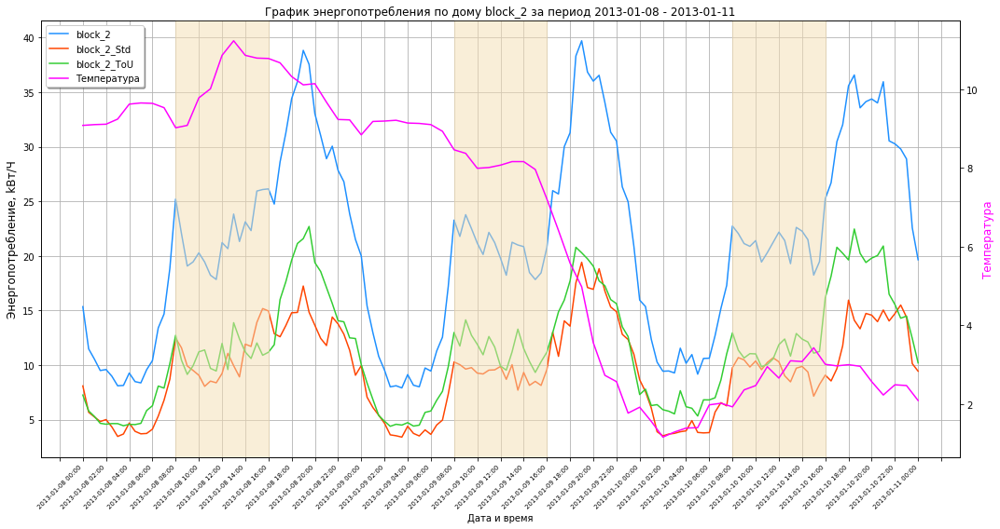

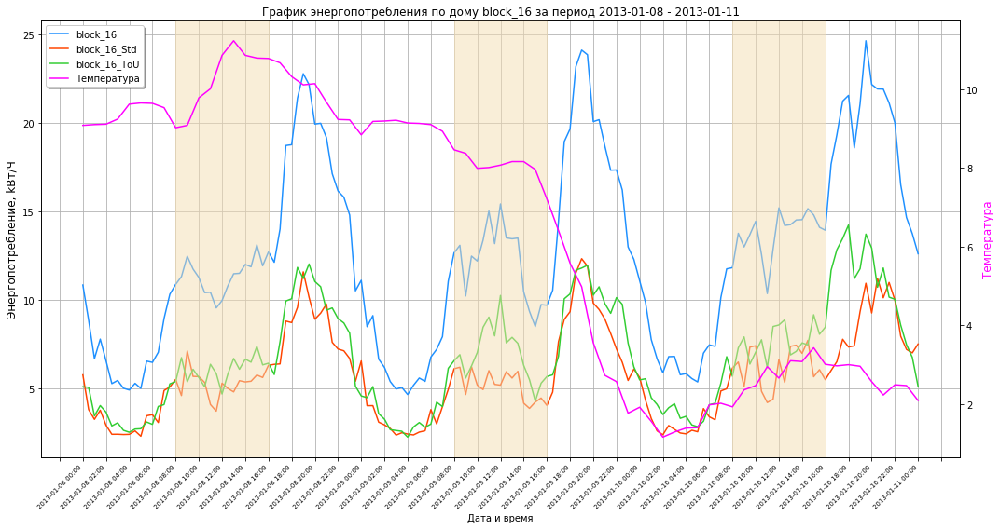

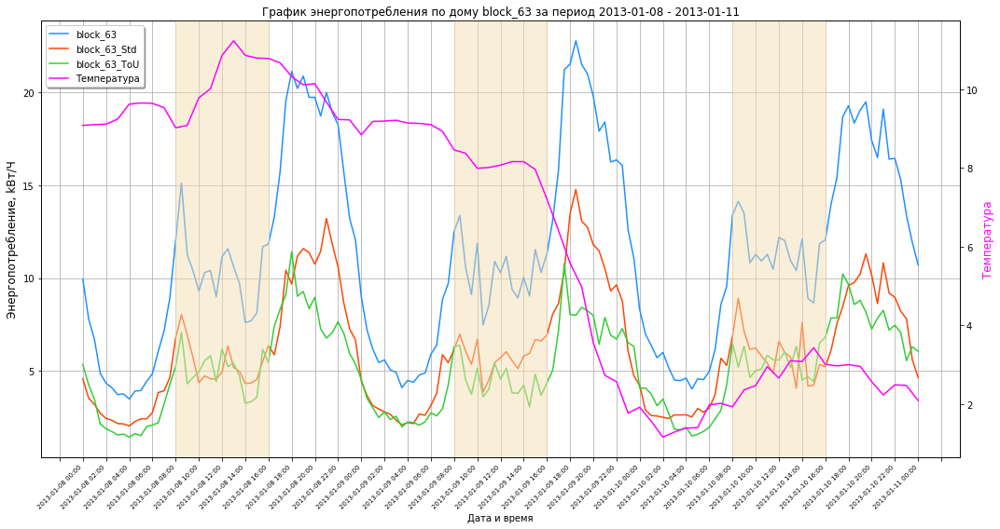

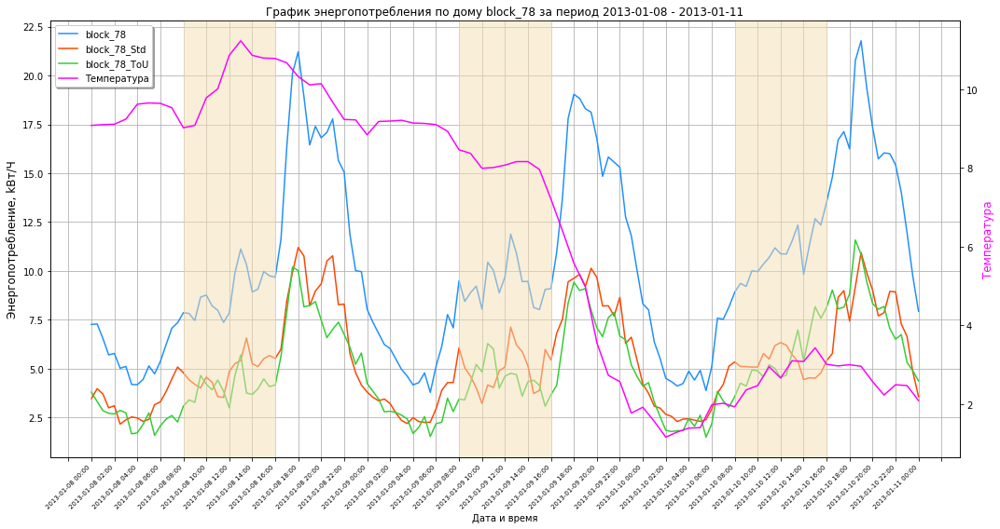

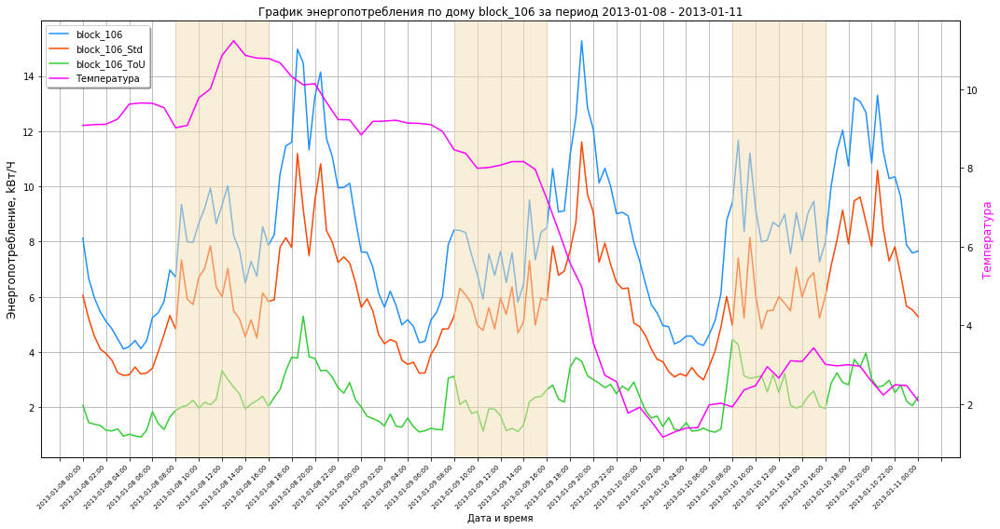

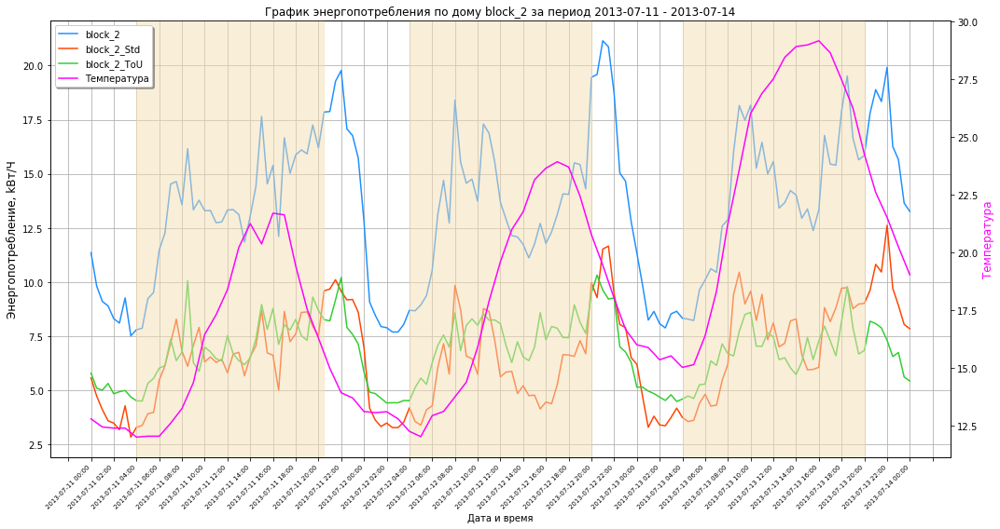

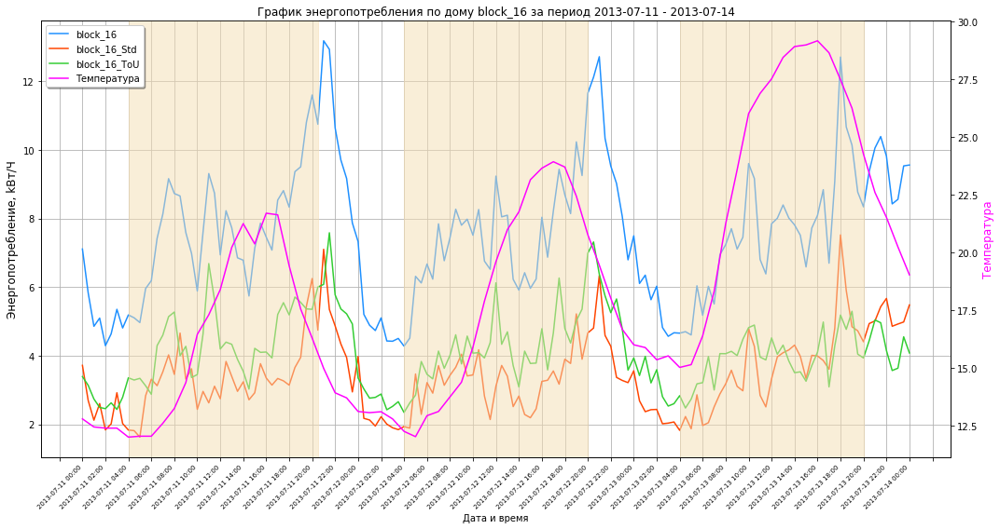

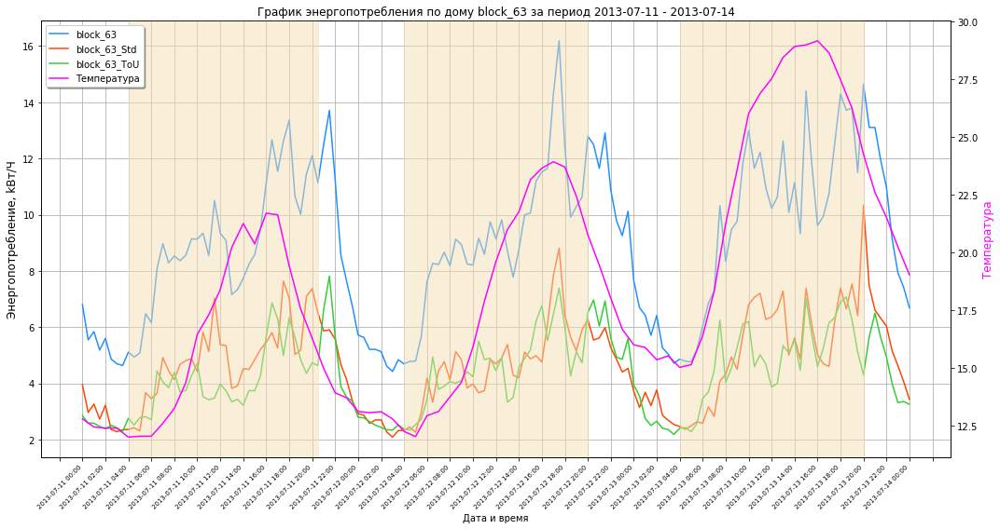

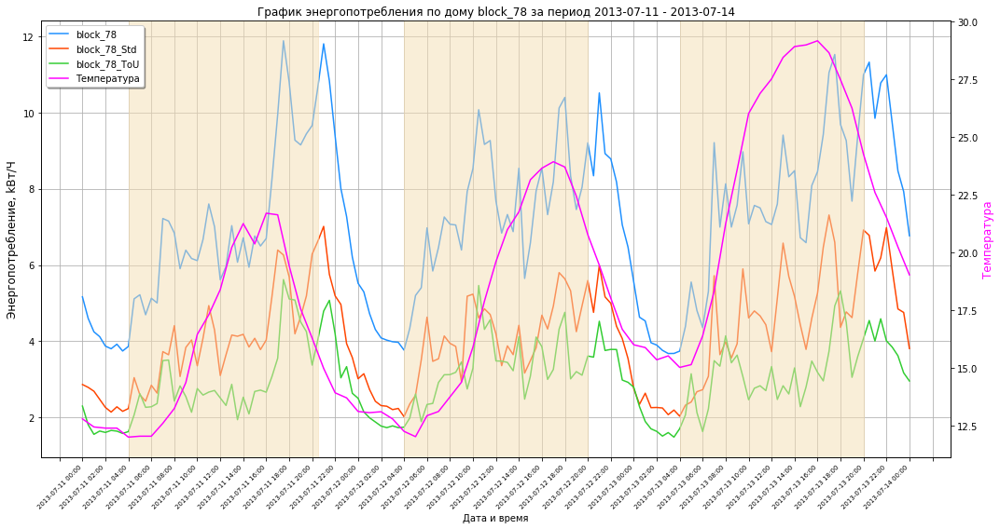

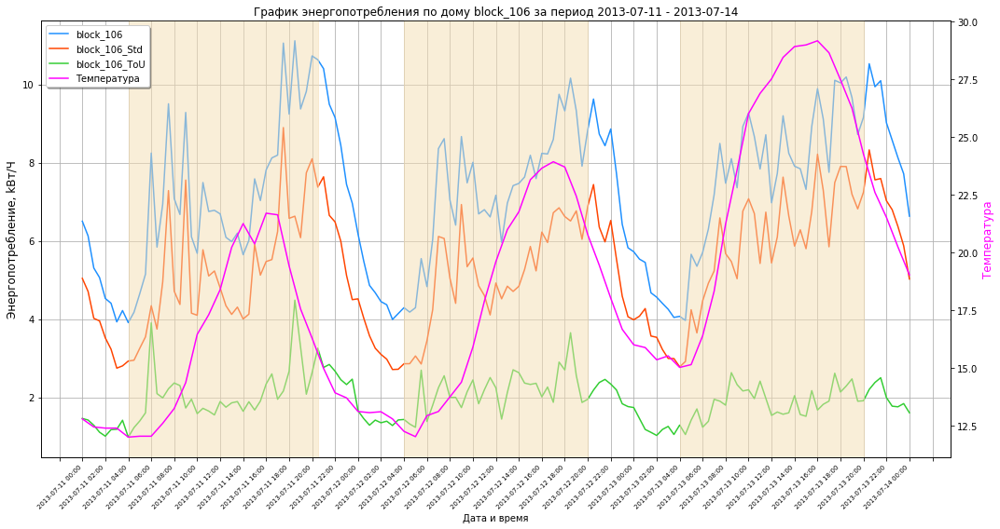

Коэффициенты корреляции в период Максимального энергопотребления:
         param  block_2  block_16  block_63  block_78  block_106
0  time_of_day     0.84      0.79      0.81      0.81       0.73
1     humidity    -0.24     -0.16     -0.19     -0.21      -0.19
2     dewPoint    -0.23     -0.30     -0.20     -0.25      -0.16
3     pressure    -0.18     -0.29     -0.16     -0.24      -0.16
4  temperature    -0.14     -0.23     -0.13     -0.16      -0.09
5    windSpeed     0.05     -0.02     -0.00     -0.00       0.07
6  windBearing     0.03      0.08      0.01      0.05       0.09
7   visibility    -0.02     -0.12     -0.06     -0.07      -0.07
Коэффициенты корреляции в период Минимального энергопотребления:
         param  block_2  block_16  block_63  block_78  block_106
0  time_of_day     0.76      0.73      0.75      0.78       0.75
1  temperature     0.45      0.37      0.70      0.56       0.58
2     dewPoint     0.37      0.30      0.47      0.43       0.42
3     humidity    -0.36 

In [40]:
# Зависимость энергопотребления по дому за периоды минимальных и максимальных
# температур: блок grafic4_5.py

# датафрейм с коэффициентами корреляции энергопотребления
df_c_matrix = pd.DataFrame(columns=['param', 'moonPhase', 'bdate', 'energy_sum', 'absv'])

def show_grafic4_5(df, dfw, house, bdate):
    nf = []
    lines = []
    colours = ['dodgerblue', 'orangered', 'limegreen', 'gold', 'slateblue']
    fig = plt.figure(figsize=(15, 8))
    ax1 = fig.add_subplot(111)
    # отображение графиков
    x = df.day_time
    for num_grf in range(2):
        if num_grf:
            clr = 'magenta'
            y = df.temperature
            # разделим ось Х с другим графиком
            ax2 = ax1.twinx()
            line, = ax2.plot(x, y, clr)
            lines.append(line)
            nf.append('Температура')
        else:
            name_cols = [name_col for name_col in df.columns.values if name_col.startswith(house)]
            for idx, name_col in enumerate(sorted(name_cols)):
                y = df[name_col]
                line, = ax1.plot(x, y, colours[idx])
                lines.append(line)
                nf.append(name_col)
    ax1.set_title(u'График энергопотребления по дому {} за период {} - {}'.format(house, bdate[:10], edate[:10]))
    ax1.set_xlabel(u'Дата и время', fontsize=10)
    ax1.set_ylabel(u'Энергопотребление, kВт/Ч', fontsize=12)
    ax2.set_ylabel(u'Температура', fontsize=12, color=clr)
    # ax1.grid(axis='x')
    ax1.grid()
    # отображение легенды
    plt.legend(lines, nf, loc='upper left', shadow=True)
    # отображение меток оси Х
    locator = matplotlib.ticker.MaxNLocator(nbins=12 * num_days + num_days + 1)
    # Установим локатор для главных меток
    ax1.xaxis.set_major_locator(locator)
    plt.setp(ax1.get_xticklabels(), rotation=45, ha="right", fontsize=7)
    for ind in dfw.index:
        xr = dfw.loc[ind, 'risehm']
        xs = dfw.loc[ind, 'sethm']
        plt.axvspan(xr, xs, color='wheat', alpha=0.5)
    fig.tight_layout()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'4_5_{bdate}_{house}.png'))
    plt.show()

# чтение дневных данных о погоде
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")
df_wd = df_wd.sort_values(by='time').reset_index()
# # вариант через цикл по каждой строке датафрейма
# for ind in df_wd.index:
#     if ind < max(df_wd.index):
#         # разница между максимальной температурой текущего дня и минимальной следующего дня
#         df_wd.loc[ind, 't_max_min'] = df_wd.loc[ind, 'temperatureMax'] - df_wd.loc[ind + 1, 'temperatureMin']
#         # разница между минимальной температурой текущего дня и максимальной следующего дня
#         df_wd.loc[ind, 't_min_max'] = df_wd.loc[ind + 1, 'temperatureMax'] - df_wd.loc[ind, 'temperatureMin']
# python-way вариант без цикла по строкам датафрейма
# разница между максимальной температурой текущего дня и минимальной следующего дня
df_wd['t_max_min'] = df_wd.temperatureMax - df_wd.temperatureMin.shift(-1)
# разница между минимальной температурой текущего дня и максимальной следующего дня
df_wd['t_min_max'] = df_wd.temperatureMax.shift(-1) - df_wd.temperatureMin
df_wd.fillna(value=0, inplace=True)  # заполнение отсутствующих значений нулями


def current_mean(row):
    # заполнение средним значением отсутствующего значения в текущей строке
    if pd.isna(row[name_col]):      # проверка ячейки на NaN
        return (row['prev_value'] + row['next_value']) / 2
    else:
        return row[name_col]

form_pay_hh = ['block_2', 'block_16', 'block_63', 'block_78', 'block_106']

# чтение подготовленных данных энергопотребления
df_phh = pd.read_csv(os.path.join(path_dataset, 'my_form_pay_hh.csv'))
# заполнение колонки вида "%Y-%m-%d %H:%M"
df_phh['day_time'] = df_phh.apply(lambda row: row.day + ' ' + row.time, axis=1)

# чтение часовых данных о погоде
df_hd = pd.read_csv(os.path.join(path_dataset, 'weather_hourly_darksky.csv'), encoding="cp1252")

num_days = 3    # количество дней для выборки данных
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
name_temp = ['t_max_min', 't_min_max']
for num_graf in range(2):
    # num_graf = 0  #период отбора данных с высоким энергопотреблением (возьмем 2 периода цикла луны)
    # num_graf = 1  #период отбора данных с низким энергопотреблением (возьмем 2 периода цикла луны)
    bdate = periodsr[3 * num_graf]
    edate = periodsr[3 * num_graf + 2]
    df = df_wd.query('time >= @bdate & time < @edate')[['time', 't_max_min', 't_min_max']]

    # получение даты с максимальным перепадом температур
    dtb = datetime.strptime(df.loc[df[name_temp[num_graf]].idxmax(), 'time'].split()[0], "%Y-%m-%d")
    dte = dtb + timedelta(days=num_days) + timedelta(minutes=10)
    # период отбора данных
    bdate = dtb.strftime('%Y-%m-%d')
    edate = dte.strftime('%Y-%m-%d %H:%M')

    # запись времени восхода/захода солнца в переводе на получасовые интервалы
    dfw = get_rise_set(df_wd, bdate, edate)

    # print(bdate, edate)
    # данные о погоде за выбранный период c необходимыми колонками
    # метеоусловия, которые могут влиять на энергопотребление
    name_cols = ['time', 'temperature', 'windBearing', 'windSpeed', 'humidity', 'pressure', 'visibility', 'dewPoint']
    df_wh = df_hd.query('time >= @bdate & time < @edate')[name_cols].sort_values(by='time')
    # заполнение колонки вида "%Y-%m-%d %H:%M"
    # df_wh['day_time'] = pd.to_datetime(df_wh.time).dt.strftime("%Y-%m-%d %H:%M")
    df_wh['day_time'] = df_wh.time.str.slice(stop=16)
    df_wh.drop('time', axis=1, inplace=True)

    df = df_phh.query('day_time >= @bdate and day_time < @edate')
    # суммирование значений по датчикам разной формы оплаты
    for house in form_pay_hh:
        name_cols = [house + '_' + LCL for LCL in ['ToU', 'Std']]
        # df[house] = df[name_cols].sum(axis=1)
        # df[hh] = df.apply(lambda row: row[name_cols].sum(), axis=1)
        # выдает ошибку: SettingWithCopyWarning:
        # A value is trying to be set on a copy of a slice from a DataFrame.
        # Try using .loc[row_indexer,col_indexer] = value instead
        # делаем через временный датафрейм
        # временный датафрейм с суммой среднего потребления энергии по всем домам по дням
        tmp_sum = pd.DataFrame(df[name_cols].sum(axis=1))
        tmp_sum.columns = [house]
        # получение датафрейма с суммой потребления энергии
        df = pd.merge(df, tmp_sum, left_index=True, right_index=True)

    df = pd.merge(df, df_wh, on='day_time', how='left')
    df['time_of_day'] = df.time.apply(lambda t: int(t.split(':')[0]) + int(t.split(':')[1]) / 30 * 0.5)

    # заполнение получасовых значений Метеоусловий как среднее предыдущего и следующего часов
    name_cols_w = ['temperature', 'windBearing', 'windSpeed', 'humidity', 'pressure', 'visibility', 'dewPoint']
    # # вариант через цикл по каждой строке датафрейма
    # for ind in df.index:
    #     for name_col in name_cols_w:
    #         # if str(df.loc[ind, name_col]) == 'nan':   # проверка ячейки на NaN
    #         if pd.isna(df.loc[ind, name_col]):          # проверка ячейки на NaN
    #             df.loc[ind, name_col] = (df.loc[ind - 1, name_col] + df.loc[ind + 1, name_col]) / 2
    # python-way вариант без цикла по строкам датафрейма
    for name_col in name_cols_w:
        df['prev_value'] = df[name_col].shift(1)        # получение значения предыщушей строки
        df['next_value'] = df[name_col].shift(-1)       # получение значения следующей строки
        df[name_col] = df.apply(current_mean, axis=1)   # заполнение отсутствующих значений средним
    df.drop(['prev_value', 'next_value'], axis=1, inplace=True)
    #
    for house in form_pay_hh:
        show_grafic4_5(df, dfw, house, bdate)

        name_cols = ['day_time', 'time_of_day', house] + name_cols_w
        # расчет матрицы корреляции для одного дома
        dfc = df[name_cols].corr().fillna(0).round(2)
        # #
        # # просмотр Тепловая карта значений коэффициентов корреляции
        # fig, ax = plt.subplots(figsize=(14, 8))
        # ax.set_title(u'Тепловая карта значений коэффициентов корреляции за период {} - {}'.format(bdate, edate[:10]))
        # sns.heatmap(dfc, annot=True, cmap='coolwarm')
        # fig.tight_layout()
        # # сохранение картинки
        # plt.savefig(os.path.join(path_dataset, 'png', f'4_5_cor_{bdate}_{house}.png'))
        # plt.show()
        # #
        # посмотрим на влияние мереоусловий на энергопотребление
        sr = sort_corh(dfc, house)
        # сохранение в файл датафрейма с коэффициентами влияющими на энергопотребление
        list_corr = pd.DataFrame(sr)
        # заполнение датафрейма с корреляционными коэффициентами для энергопотребления
        list_corr['absv'] = np.abs(list_corr['energy_sum'])  # добавление колонки с абсолютным значением
        list_corr['param'] = list_corr.index
        list_corr['house'] = house
        list_corr['bdate'] = bdate
        df_c_matrix = df_c_matrix.append(list_corr, ignore_index=True, sort=False)

# преобразование из датафрейма матриц строки по moonPhase в соответствующие колонки
df_c_matrix['season'] = df_c_matrix.bdate.apply(lambda x: 0 if x < "2013-06-01" else 1)
df_c_matrix.drop(['bdate'], axis=1, inplace=True)  # удаление колонки
name_cols = list(df_c_matrix.house.unique())
seasons = ['Максимального', 'Минимального']
for num_season in range(2):
    for name_col in name_cols:
        df = df_c_matrix.query('house == @name_col and season == @num_season')
        df = df[['param', 'energy_sum']]
        df.columns = ['param', name_col]
        if name_col == 'block_2':
            df_season = df
        else:
            df_season = pd.merge(df_season, df, on='param', how='outer')
    df_season.to_csv(os.path.join(path_dataset, 'export', f'df_45_season_{num_season}.csv'))
    print(f'Коэффициенты корреляции в период {seasons[num_season]} энергопотребления:')
    print(df_season[['param', 'block_2', 'block_16', 'block_63', 'block_78', 'block_106']])


In [42]:
# объединение информации по домам с получасовым интервалом сбора информации: блок my_all_LCLid.py

start_time = time.time()

print(f'Cписок исключенных домов:\n {Excluded_HH}')      # список исключенных домов

# возьмем информацию по датчикам за период
bdate = "2012-09-01"
edate = "2014-03-01"

# чтение информации о домах
df_hh = pd.read_csv(os.path.join(path_dataset, 'informations_households.csv'), encoding="cp1252")
# удалим лишние колонки и данные о домах
df_hh = df_hh.drop(df_hh.columns[[2, 3]], axis=1)
dir_files = os.listdir(os.path.join(path_dataset, 'halfhourly_dataset'))
make_df = True
print(f'Обрабатываю файл:')
countprn = 0
for file_house in dir_files:
    name_hh = file_house.split('.')[0]
    if name_hh in Excluded_HH: continue        # исключение проблемных домов
    # просто вывод имен файлов, чтобы видеть: оно работает
    if countprn < 7:
        print(f' {file_house}', end='')
        countprn += 1
    if countprn > 6:
        countprn = 0
        print()
    # создание словаря: список датчиков по форме оплаты
    df_id = df_hh.query('file == @name_hh')
    dct_id = defaultdict(list)
    # for ind in df_id.index:
    #     dct_id[df_id.loc[ind, 'stdorToU']].append(df_id.loc[ind, 'LCLid'])
    for LCL in list(df_id.stdorToU.unique()):
        dct_id[LCL] = df_id.query('stdorToU == @LCL').LCLid.to_list()
    # print(dct_id)
    # чтение блока данных о потреблении энергии одного дома
    df = pd.read_csv(os.path.join(path_dataset, 'halfhourly_dataset', file_house), encoding="cp1252", low_memory=False)
    df = df.query('tstp >= @bdate and tstp < @edate')
    df.columns = ['LCLid', 'tstp', 'energy']        # переименование колонок
    # иначе эта колонка распознается как object
    df.energy = pd.to_numeric(df.energy, errors='coerce').fillna(0, downcast='infer') # замена Null
    # print(df.columns.values)
    # print(df.info())
    # сводная таблица потребления энергии за день по всем датчикам LCLid,tstp,energy(kWh/hh)
    pivot = df.pivot_table(columns='LCLid', index='tstp', values='energy', aggfunc='sum', fill_value=0)
    # формирование списка датчиков - столбцов сводной таблицы
    for type_id in ['ToU', 'Std']:
        name_id = list(dct_id[type_id])
        for name_i in name_id[::]:
            if name_i not in list(pivot.columns.values):  # если датчика нет в сводной таблице - удалить его
                name_id.remove(name_i)
        # print(name_id)
        # таблица сумм по всем датчикам одного типа за период
        e_sum = pd.DataFrame(pivot[name_id].sum(axis=1))
        # переименование колонки в метку дома
        e_sum.columns = [name_hh+'_'+type_id]
        # print(e_sum)
        # создание датафрейма из сводных таблиц по домам
        if make_df:
            energy_sum = e_sum
            make_df = False
        else:
            energy_sum = pd.merge(energy_sum, e_sum, on='tstp', how='outer')

energy_sum.fillna(value=0, inplace=True) # заполнение отсутствующих значений нулями
# добавление колонок даты и времени
energy_sum.insert(0, 'time', 0)
energy_sum.insert(0, 'day', 0)
energy_sum.time = pd.to_datetime(energy_sum.index)             # преобразование индекса в дату
energy_sum.day = energy_sum.time.dt.date
energy_sum.time = energy_sum.time.dt.strftime("%H:%M")
# в данных есть мусорные строки вида 2013-10-29 09:33 фиксация данных вне отведенного времени - их исключаем
# строка для проверки корректности данных времени
hm = [str(h).rjust(2, '0') + ':' + str(m).rjust(2, '0') for h in range(24) for m in range(0, 40, 30)]
# отфильтруем только данные, которые записаны с получасовым интервалом.
energy_sum = energy_sum.query('time in @hm')
# print(energy_sum)
# сохранение сводного датафрейма в файл без индекса
energy_sum.to_csv(os.path.join(path_dataset, 'all_form_pay_hh.csv'), index=False)
print("--- %s секунд выполнялось ---" % (time.time() - start_time))

Cписок исключенных домов:
 {'block_89', 'block_110', 'block_74', 'block_43', 'block_6', 'block_111', 'block_0'}
Обрабатываю файл:
 block_1.csv block_10.csv block_100.csv block_101.csv block_102.csv block_103.csv block_104.csv
 block_105.csv block_106.csv block_107.csv block_108.csv block_109.csv block_11.csv block_12.csv
 block_13.csv block_14.csv block_15.csv block_16.csv block_17.csv block_18.csv block_19.csv
 block_2.csv block_20.csv block_21.csv block_22.csv block_23.csv block_24.csv block_25.csv
 block_26.csv block_27.csv block_28.csv block_29.csv block_3.csv block_30.csv block_31.csv
 block_32.csv block_33.csv block_34.csv block_35.csv block_36.csv block_37.csv block_38.csv
 block_39.csv block_4.csv block_40.csv block_41.csv block_42.csv block_44.csv block_45.csv
 block_46.csv block_47.csv block_48.csv block_49.csv block_5.csv block_50.csv block_51.csv
 block_52.csv block_53.csv block_54.csv block_55.csv block_56.csv block_57.csv block_58.csv
 block_59.csv block_60.csv block_61.c

Исследование энергопотребления по датчикам «ToU»: Составление Рейтинга домов по частоте использования периодов низкого тарифа датчиками «ToU» - результат в файле block_tou.csv.

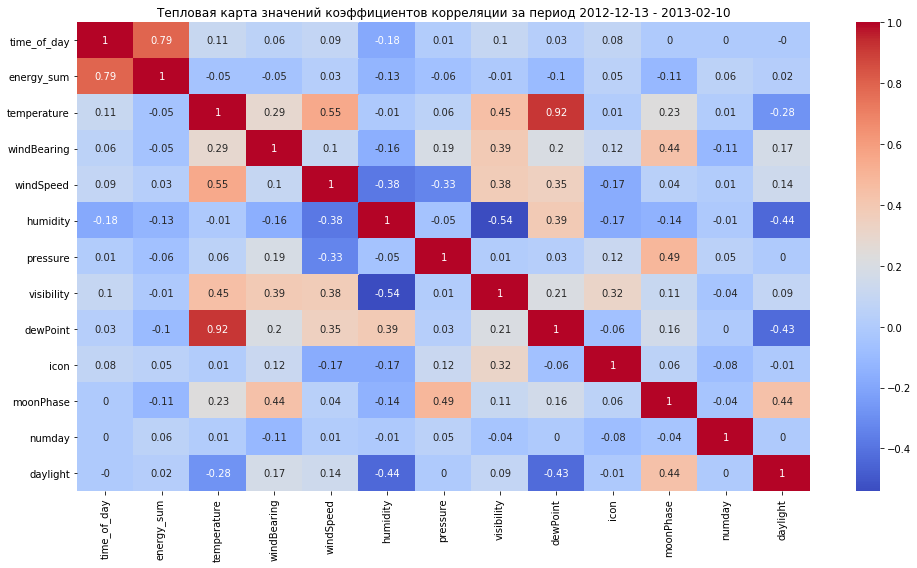

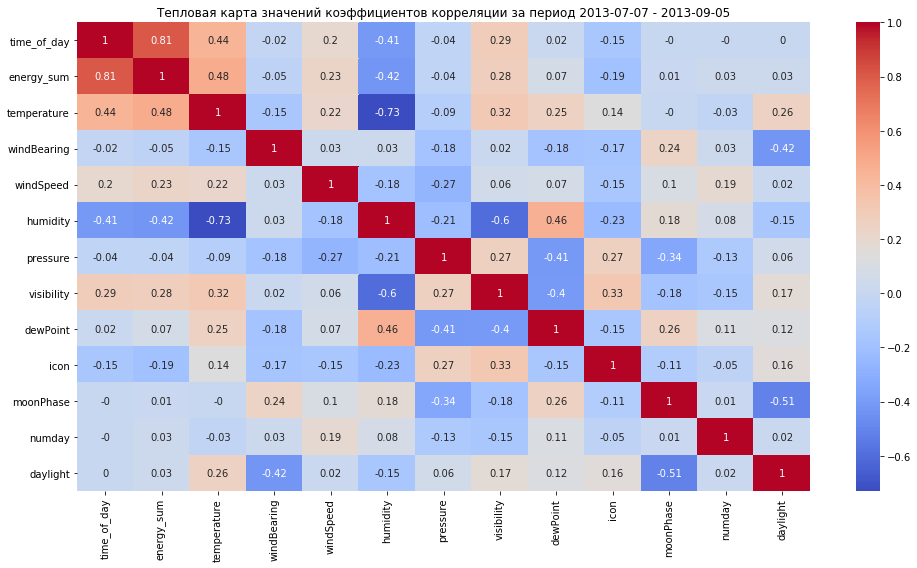

Коэффициенты корреляции в период Максимального энергопотребления:
          param  energy_sum
0   time_of_day        0.79
1      humidity       -0.13
2     moonPhase       -0.11
3      dewPoint       -0.10
4      pressure       -0.06
5        numday        0.06
6   temperature       -0.05
7   windBearing       -0.05
8          icon        0.05
9     windSpeed        0.03
10     daylight        0.02
11   visibility       -0.01
Коэффициенты корреляции в период Минимального энергопотребления:
          param  energy_sum
12  time_of_day        0.81
13  temperature        0.48
14     humidity       -0.42
15   visibility        0.28
16    windSpeed        0.23
17         icon       -0.19
18     dewPoint        0.07
19  windBearing       -0.05
20     pressure       -0.04
21       numday        0.03
22     daylight        0.03
23    moonPhase        0.01


In [43]:
# тепловая матрица для часовых данных энергопотребления и погоды: блок grafic4_6.py

# датафрейм с коэффициентами корреляции энергопотребления
df_c_matrix = pd.DataFrame(columns=['param', 'moonPhase', 'bdate', 'energy_sum', 'absv'])

# чтение дневных данных о погоде
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")
df_wd = df_wd.sort_values(by='time').reset_index()
df_wd.fillna(value=0, inplace=True)  # заполнение отсутствующих значений нулями
# метеоусловия, которые могут влиять на энергопотребление
name_cols = ['time', 'cloudCover', 'sunriseTime', 'sunsetTime', 'moonPhase']
df_wd = df_wd[name_cols]
# в колонке 'day' оставить только дату и преобразовать в строку, т.к. все даты в датасете загружаются как строки
df_wd['day'] = pd.to_datetime(df_wd.time).dt.strftime("%Y-%m-%d")
df_wd['numday'] = pd.to_datetime(df_wd.time).dt.weekday + 1
# вычисление длительности светового дня и удаление временных колонок
df_wd['sethm'] = pd.to_datetime(df_wd.sunsetTime).dt.hour + pd.to_datetime(df_wd.sunsetTime).dt.minute / 60
df_wd['risehm'] = pd.to_datetime(df_wd.sunriseTime).dt.hour + pd.to_datetime(df_wd.sunriseTime).dt.minute / 60
df_wd['daylight'] = df_wd.sethm - df_wd.risehm
df_wd.drop(['sethm', 'risehm'], axis=1, inplace=True)
# print(df_wd.columns.values)
# df_wd.to_csv('df_wd.csv')

# чтение подготовленных данных энергопотребления
df_phh = pd.read_csv(os.path.join(path_dataset, 'all_form_pay_hh.csv'))
# замена получасовых значений времени, чтобы после сгруппировать данные с часовым интервалом
df_phh.time = df_phh.time.str.replace(':30', ':00')
form_pay_hh = [name_col.replace('_Std', '') for name_col in df_phh.columns.values if name_col.endswith('_Std')]
# print(form_pay_hh)

# чтение часовых данных о погоде
df_hd = pd.read_csv(os.path.join(path_dataset, 'weather_hourly_darksky.csv'), encoding="cp1252")

num_days = 3  # количество дней для выборки данных
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
for num_graf in range(2):
    # num_graf = 0  #период отбора данных с высоким энергопотреблением (возьмем 2 периода цикла луны)
    # num_graf = 1  #период отбора данных с низким энергопотреблением (возьмем 2 периода цикла луны)
    bdate = periodsr[3 * num_graf]
    edate = periodsr[3 * num_graf + 2]
    # print(bdate, edate)

    # данные о погоде за выбранный период c необходимыми колонками
    # метеоусловия, которые могут влиять на энергопотребление
    name_cols = ['time', 'temperature', 'windBearing', 'windSpeed', 'humidity', 'pressure',
                 'visibility', 'dewPoint', 'icon']
    df_wh = df_hd.query('time >= @bdate & time < @edate')[name_cols].sort_values(by='time')
    df_wh['day'] = pd.to_datetime(df_wh.time).dt.strftime("%Y-%m-%d")
    # замена стандартизованного словесного описания погодных условий на числовой эквивалент
    df_wh.icon = df_wh.icon.str.replace('-cloudy-', '-cloud-')
    list_icon = ['dummy', 'fog', 'wind', 'cloudy', 'partly-cloud-night', 'partly-cloud-day', 'clear-day']
    for num_icon in range(1, 7):
        df_wh.icon = df_wh.icon.str.replace(list_icon[num_icon], str(num_icon))
    df_wh.icon = pd.to_numeric(df_wh.icon, errors='coerce')
    # заполнение колонки вида "%Y-%m-%d %H:%M"
    df_wh['day_time'] = df_wh.time.str.slice(stop=16)
    df_wh.drop('time', axis=1, inplace=True)
    # print(df_wh.columns.values)
    name_cols = ['day', 'moonPhase', 'numday', 'daylight']
    df = df_wd.query('day >= @bdate & day < @edate')[name_cols].sort_values(by='day')
    df_wh = pd.merge(df_wh, df, on='day', how='left')
    # print(df_wh)

    # энергопотребление за заданный период
    df = df_phh.query('day >= @bdate and day < @edate')
    # сгруппировать данные с часовым интервалом
    df = df.groupby(['day', 'time']).sum()
    # заполнение колонки вида "%Y-%m-%d %H:%M"
    df['ind'] = df.index
    df['day_time'] = df.ind.apply(lambda x: x[0] + ' ' + x[1])
    # возвращение колонок дата и время
    df['day'] = df.day_time.apply(lambda x: x.split()[0])
    df['time'] = df.day_time.apply(lambda x: x.split()[1])
    df.drop('ind', axis=1, inplace=True)
    # суммирование значений по датчикам разной формы оплаты
    for house in form_pay_hh:
        name_cols = [house + '_' + LCL for LCL in ['ToU', 'Std']]
        # df[house] = df[name_cols].sum(axis=1)
        # df[hh] = df.apply(lambda row: row[name_cols].sum(), axis=1)
        # выдает ошибку: SettingWithCopyWarning:
        # A value is trying to be set on a copy of a slice from a DataFrame.
        # Try using .loc[row_indexer,col_indexer] = value instead
        # делаем через временный датафрейм
        # временный датафрейм с суммой среднего потребления энергии по всем домам по дням
        tmp_sum = pd.DataFrame(df[name_cols].sum(axis=1))
        tmp_sum.columns = [house]
        # получение датафрейма с суммой потребления энергии
        df = pd.merge(df, tmp_sum, left_index=True, right_index=True)

    df = pd.merge(df, df_wh, on='day_time', how='left')
    df['time_of_day'] = df.time.apply(lambda t: int(t.split(':')[0]) + int(t.split(':')[1]) / 30 * 0.5)
    name_cols_w = ['temperature', 'windBearing', 'windSpeed', 'humidity', 'pressure', 'visibility', 'dewPoint',
                   'icon', 'moonPhase', 'numday', 'daylight']

    # сумма по всем домам
    name_cols = [house for house in form_pay_hh]
    tmp_sum = pd.DataFrame(df[name_cols].sum(axis=1))
    tmp_sum.columns = ['energy_sum']
    # получение датафрейма с суммой потребления энергии
    df = pd.merge(df, tmp_sum, left_index=True, right_index=True)

    name_cols = ['day_time', 'time_of_day', 'energy_sum'] + name_cols_w
    # расчет матрицы корреляции
    dfc = df[name_cols].corr().fillna(0).round(2)
    #
    house = 'all_summ'
    # просмотр Тепловая карта значений коэффициентов корреляции
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.set_title(u'Тепловая карта значений коэффициентов корреляции за период {} - {}'.format(bdate, edate[:10]))
    sns.heatmap(dfc, annot=True, cmap='coolwarm')
    fig.tight_layout()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'4_6_cor_{bdate}_{house}.png'))
    plt.show()
    #
    # посмотрим на влияние мереоусловий на энергопотребление
    sr = sort_corh(dfc, 'energy_sum')
    # сохранение в файл датафрейма с коэффициентами влияющими на энергопотребление
    list_corr = pd.DataFrame(sr)
    # заполнение датафрейма с корреляционными коэффициентами для энергопотребления
    list_corr['absv'] = np.abs(list_corr['energy_sum'])  # добавление колонки с абсолютным значением
    list_corr['param'] = list_corr.index
    list_corr['house'] = house
    list_corr['bdate'] = bdate
    df_c_matrix = df_c_matrix.append(list_corr, ignore_index=True, sort=False)

# преобразование из датафрейма матриц строки по moonPhase в соответствующие колонки
df_c_matrix['season'] = df_c_matrix.bdate.apply(lambda x: 0 if x < "2013-06-01" else 1)
df_c_matrix.drop(['bdate'], axis=1, inplace=True)  # удаление колонки
name_cols = list(df_c_matrix.house.unique())
seasons = ['Максимального', 'Минимального']
for num_season in range(2):
    df = df_c_matrix.query('season == @num_season')
    df = df[['param', 'energy_sum']]
    df.to_csv(os.path.join(path_dataset, 'export', f'df_46_season_{num_season}.csv'))
    print(f'Коэффициенты корреляции в период {seasons[num_season]} энергопотребления:')
    print(df)


In [44]:
# Исследование энергопотребления по датчикам «ToU»: блок grafic5.py

# Тариф с оплатой от времени суток имеет две тарифные зоны: высокий тариф с 06.00 до 11.00 и с 15.00 до 22.00 часов
# для рабочих дней с декабря по март включительно и зону низкого тарифа все остальное время.

bdate = '2012-12-01'
edate = '2013-03-01'

start_time = time.time()

# датафрейм для сбора данных за день по домам с энергопотреблением датчиков "ToU" по льготным периодам
df_res = pd.DataFrame(columns=['day', 'file', 'tou_night', 'tou_day'])
# чтение датафрейма, подготовленного в блоке my_all_LCLid.py
energy = pd.read_csv(os.path.join(path_dataset, 'all_form_pay_hh.csv'))
# список столбцов для выборки (имена домов)
name_cols = [name_col for name_col in energy.columns.values if name_col.endswith('_ToU')]
df = energy.query('day >= @bdate & day < @edate')   #['day', 'time', name_cols]
# print(df.head(15))
# строки для проверки данных энергопотребления по времени дешевого тарифа
night_hm = [str(h).rjust(2, '0') + ':' + str(m).rjust(2, '0') for h in range(3, 7) for m in range(0, 40, 30)]
night_hm.pop(0)
night_last = night_hm.pop()
day_hm = [str(h).rjust(2, '0') + ':' + str(m).rjust(2, '0') for h in range(11, 16) for m in range(0, 40, 30)]
day_hm.pop(0)
day_last = day_hm.pop()
# печать периодов и первой точки после окончания льготного периода
print(night_hm, night_last)
print(day_hm, day_last)
# преобразование дат
now_date = datetime.strptime(bdate, "%Y-%m-%d")
end_date = datetime.strptime(edate, "%Y-%m-%d")
weekends = parsing_dates(bdate, edate, type_date='weekends')
countprn = 0
while now_date < end_date:
    day_date = now_date.strftime("%Y-%m-%d")
    now_date += timedelta(days=1)
    # просто вывод дат, чтобы видеть: оно работает
    if countprn < 9:
        print(day_date, end=' ')
        countprn += 1
    if countprn > 8:
        countprn = 0
        print()
    if day_date in weekends: continue       # выходные пропускаем

    for house in name_cols:
        # для одного дома читаем max показатель энергопотребления в льготный период и первую точку после него
        max_hm = df.query('day == @day_date and time in @night_hm')[house].max()
        max_pp = df.query('day == @day_date and time == @night_last')[house].max()
        # true, если было энергопотребление ночью в льготный период
        res_night = max_hm > max_pp
        # для одного дома читаем max показатель энергопотребления в льготный период и первую точку после него
        max_hm = df.query('day == @day_date and time in @day_hm')[house].max()
        max_pp = df.query('day == @day_date and time == @day_last')[house].max()
        # true, если было энергопотребление днем в льготный период
        res_day = max_hm > max_pp
        # запись в датафрейм данных за день по одному дому
        df_res.loc[len(df_res)] = [day_date, house[:-4], res_night, res_day]
print()
# сводные таблицы для ночного и дневного интервалов
pvtn = df_res.pivot_table(columns='tou_night', index='file', values='day', aggfunc='count', fill_value=0)
pvtn.columns = ['night_No', 'night_Yes']
pvtd = df_res.pivot_table(columns='tou_day', index='file', values='day', aggfunc='count', fill_value=0)
pvtd.columns = ['day_No', 'day_Yes']
# объединение сводных таблиц
pvt = pd.merge(pvtn, pvtd, left_index=True, right_index=True)
# print(pvt)
# фильтр, если кол-во дней использования датчиков ToU больше, чем не использования
df_pvt = pvt.query('night_Yes > night_No or day_Yes > day_No')

# подсчет суммы из кол-ва раз когда преобладали датчики ToU
# df_pvt['sum_Yes'] = df_pvt[['night_Yes', 'day_Yes']].sum(axis=1)
# строка выше выдает ошибку SettingWithCopyWarning:  A value is trying to be set on a copy of a slice from a DataFrame.
# Try using .loc[row_indexer,col_indexer] = value instead
# df_pvt = df_pvt.sort_values(by='sum_Yes', ascending=False)

df_pvt.to_csv(os.path.join(path_dataset, 'block_tou.csv'))
print("--- %s секунд выполнялось ---" % (time.time() - start_time))

['03:30', '04:00', '04:30', '05:00', '05:30', '06:00'] 06:30
['11:30', '12:00', '12:30', '13:00', '13:30', '14:00', '14:30', '15:00'] 15:30
2012-12-01 2012-12-02 2012-12-03 2012-12-04 2012-12-05 2012-12-06 2012-12-07 2012-12-08 2012-12-09 
2012-12-10 2012-12-11 2012-12-12 2012-12-13 2012-12-14 2012-12-15 2012-12-16 2012-12-17 2012-12-18 
2012-12-19 2012-12-20 2012-12-21 2012-12-22 2012-12-23 2012-12-24 2012-12-25 2012-12-26 2012-12-27 
2012-12-28 2012-12-29 2012-12-30 2012-12-31 2013-01-01 2013-01-02 2013-01-03 2013-01-04 2013-01-05 
2013-01-06 2013-01-07 2013-01-08 2013-01-09 2013-01-10 2013-01-11 2013-01-12 2013-01-13 2013-01-14 
2013-01-15 2013-01-16 2013-01-17 2013-01-18 2013-01-19 2013-01-20 2013-01-21 2013-01-22 2013-01-23 
2013-01-24 2013-01-25 2013-01-26 2013-01-27 2013-01-28 2013-01-29 2013-01-30 2013-01-31 2013-02-01 
2013-02-02 2013-02-03 2013-02-04 2013-02-05 2013-02-06 2013-02-07 2013-02-08 2013-02-09 2013-02-10 
2013-02-11 2013-02-12 2013-02-13 2013-02-14 2013-02-15 2013-

Исследуем энергопотребление по всем домам датасета hhblock_dataset.zip (кроме исключенных домов) с декабря по март в рабочие дни в периоды 03:00-06:00 и 11:00-15:00, выбираем записи с максимальными значениями и сравниваем с показаниями датчиков после окончания этих периодов – это время 06:30 и 15:30. Если энергопотребление в период низкого тарифа за отрезок в полчаса превысило значение первой записи после окончания период низкого тарифа – означает, что в доме пользуются преимуществами датчиков «ToU».

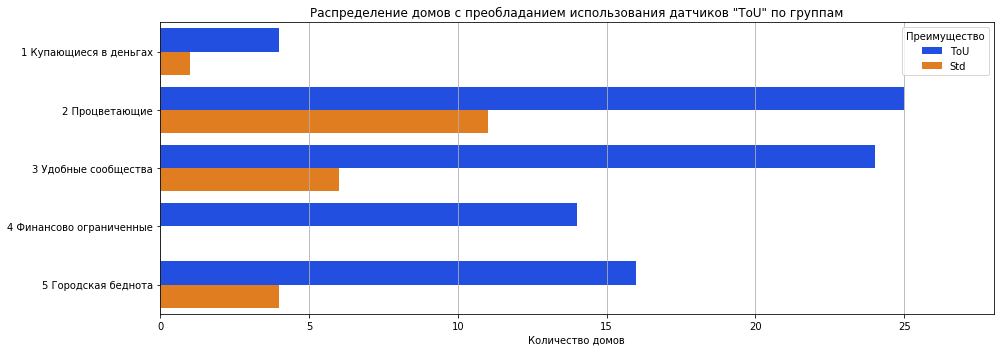

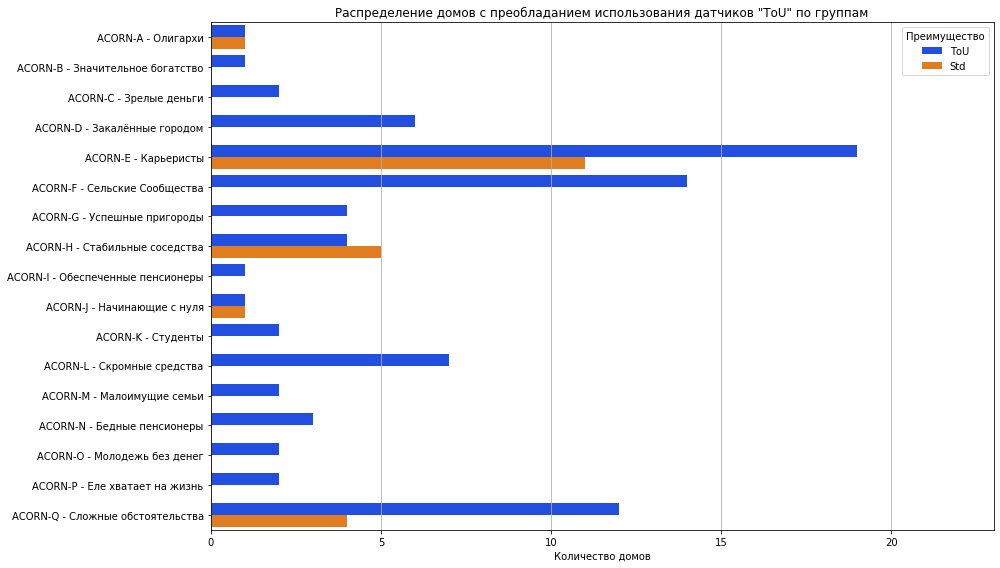

In [45]:
# Исследование энергопотребление по всем домам с декабря по март в рабочие дни в периоды 03:00-06:00 и 11:00-15:00
# построение гистограмм: блок grafic5_1.py

dct_acorn = get_acorn(path_dataset)     # получение списка категорий (групп) населения
# print(dct_acorn['Excluded_HH'])       # список исключенных домов
Excluded_HH = dct_acorn['Excluded_HH']

# чтение информации о домах
df = pd.read_csv(os.path.join(path_dataset, 'informations_households.csv'), encoding="cp1252")
# замена Acorn_grouped на правильную из файла CACI's_Acorn_Structure_(Uploaded_June_2014).pdf
df.drop('Acorn_grouped', axis=1, inplace=True)  # удаление колонки
df = pd.merge(df, df_tra[['Acorn', 'Acorn_grouped']], on='Acorn', how='left')
# print(df.columns.values)
# у некоторых домов датчики приписаны к разным группам Acorn - заменим на одну преобладающую группу
# список домов
houses = set(df.file.to_list())
for house in houses:
    # сводная таблица по дому: в какие группы он попадает
    pvt = df[df.file == house].pivot_table(columns='Acorn', index='file', values='LCLid',
                                           aggfunc='count', fill_value=0)
    # имя группы, в которой максимальное поличество датчиков
    max_acorn = pvt.loc[:, pvt.loc[house] == pvt.loc[house].max()].columns.tolist()[0]
    df.loc[df.file.isin([house]), 'Acorn'] = max_acorn

# отберем только правильные дома
df = df.query('file not in @Excluded_HH')[['file', 'Acorn', 'Acorn_grouped']].drop_duplicates()
# print(df)
df_pvt = pd.read_csv(os.path.join(path_dataset, 'block_tou.csv'))
# подсчет суммы из кол-ва раз когда преобладали датчики ToU
df_pvt['sum_Yes'] = df_pvt[['night_Yes', 'day_Yes']].sum(axis=1)
df_pvt = df_pvt.sort_values(by='sum_Yes', ascending=False)
# сохранение результата
df_pvt.to_csv(os.path.join(path_dataset, 'block_tou.csv'), index=False)
# объединение датафрейма с общим списком домов для получения групп
df_pvt = pd.merge(df_pvt, df, on='file', how='outer')
# заполнение колонки в какой день в льготные периоды было преимущественное потребление электроэнергии
df_pvt['Преимущество'] = df_pvt.sum_Yes.apply(lambda x: 'ToU' if x > 0 else 'Std')
df_pvt = df_pvt.sort_values(by='Acorn')
# замена названия групп на перевод
df_pvt.Acorn = df_pvt.Acorn.apply(lambda x: x + ' - ' + trans_acorn(x))
df_pvt.Acorn_grouped = df_pvt.Acorn_grouped.apply(trans_acorn)
# print(df_pvt)
# гистограммы для оценки сколько домов пользуются преимуществами датчиков ToU по сравнению с теми, кто не пользуется
for name_grp in ['Acorn_grouped', 'Acorn']:
    if name_grp == 'Acorn_grouped':
        height = 5
    else:
        height = 8
    # установка лимитов по оси Х
    pvt = df_pvt.pivot_table(columns='Преимущество', index=name_grp, values='file',
                             aggfunc='count', fill_value=0)
    max_h = ceil(pvt.ToU.max() / 5.0) * 5 + 3
    fig, ax = plt.subplots(figsize=(14, height))
    ax.set_xlim(0, max_h)
    ax.set_title(f'Распределение домов с преобладанием использования датчиков "ToU" по группам')
    sns.countplot(y=name_grp, data=df_pvt, hue='Преимущество', palette="bright")
    plt.grid(axis='x')
    plt.ylabel('')
    plt.xlabel(u'Количество домов')
    fig.tight_layout()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'5_1_{name_grp}.png'))
    plt.show()

Интересно посмотреть на распределение энергопотребления по датчикам «ToU» в течении суток для домов из первой пятерки и лидера из выбранных домов. На графиках дополнительно выделены голубым цветом периоды низкого тарифа датчиков «ToU»

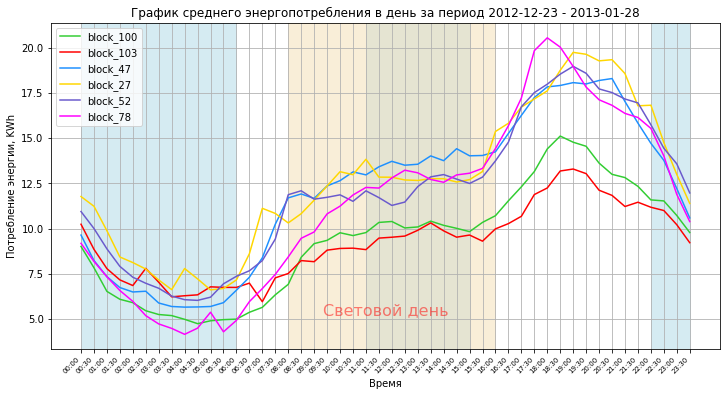

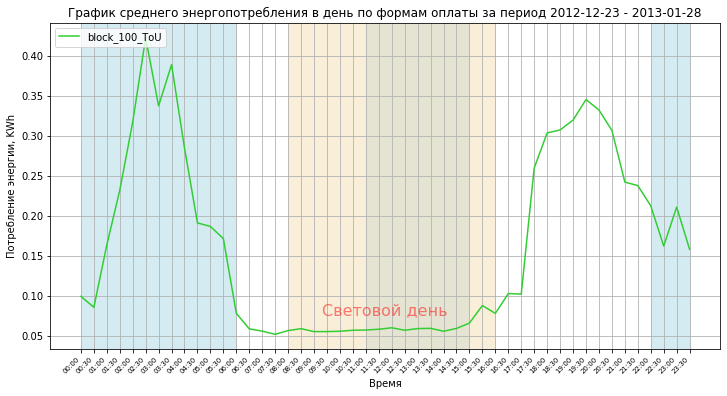

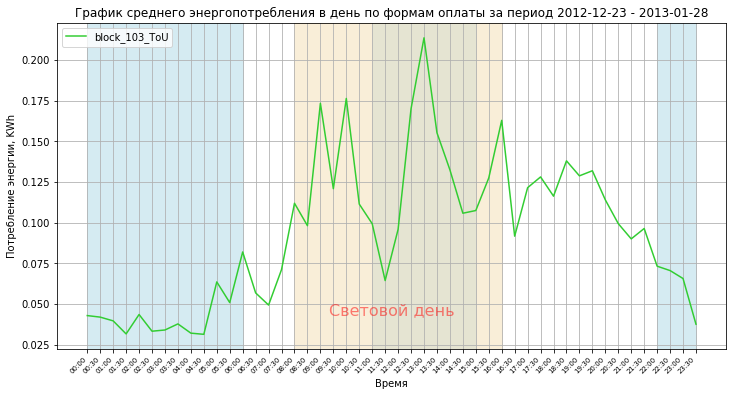

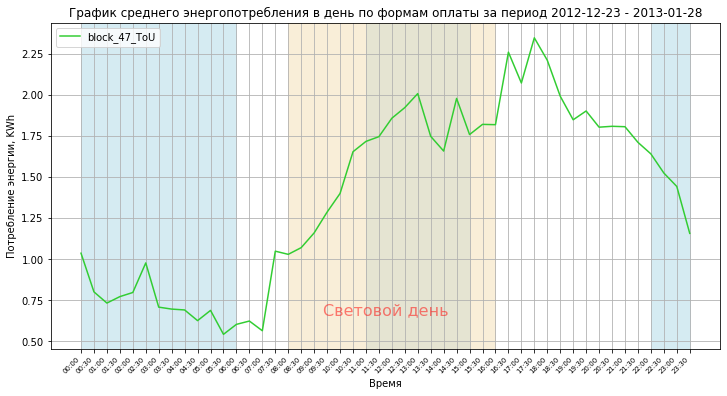

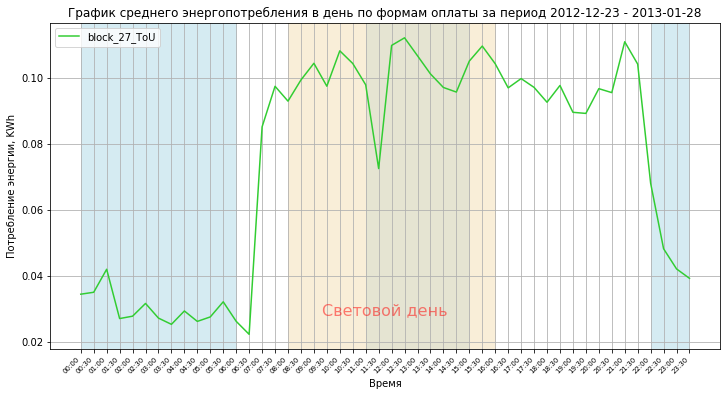

...

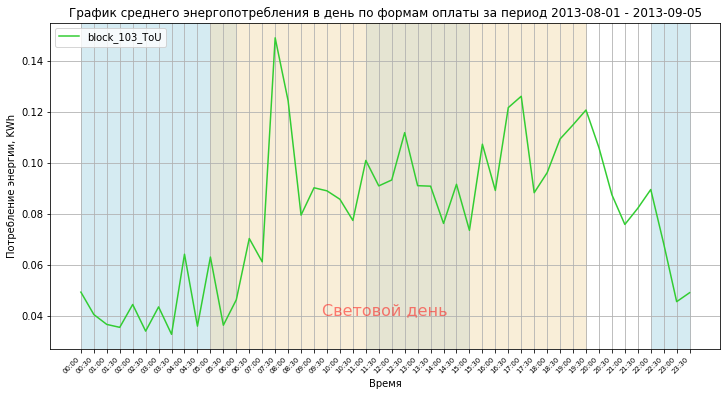

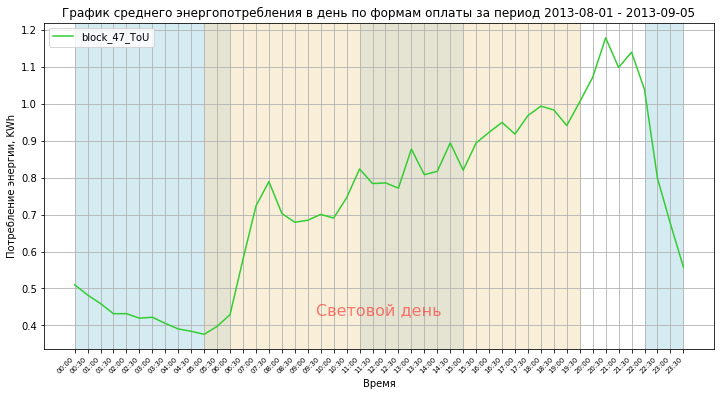

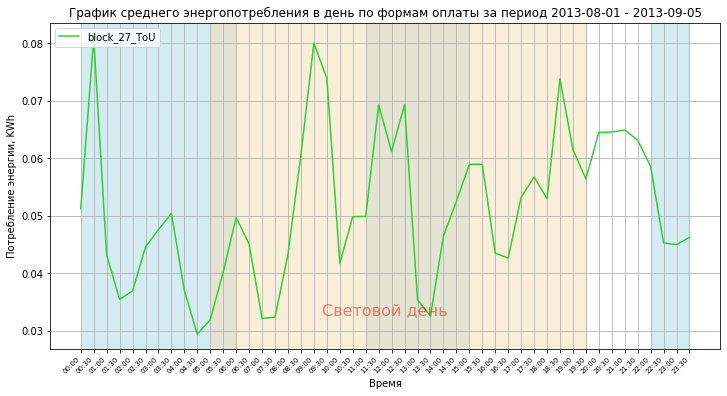

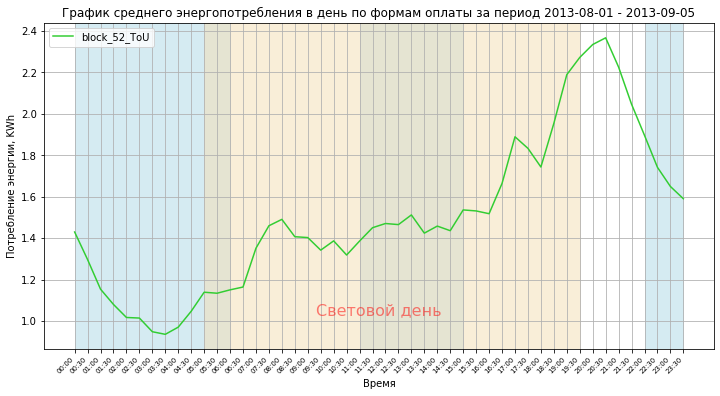

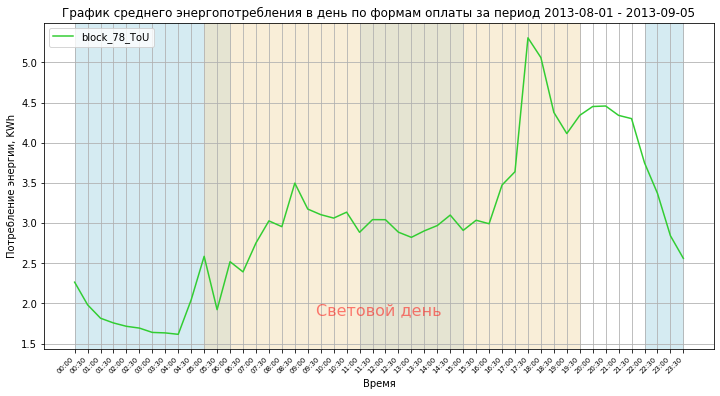

In [46]:
# распределение энергопотребления по времени суток: блок grafic5_2.py (как в grafic4_2.py)
# распределение энергопотребления по датчикам «ToU» в течении суток для домов 
# из первой пятерки рейтинга и лидера из выбранных домов
#
form_pay_hh = ['block_100', 'block_103', 'block_47', 'block_27', 'block_52', 'block_78']

# чтение дневных данных о погоде
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")


def show_block_day(sdf, ttl, pnf, list_rise_set=[]):
    # периоды времени дешевого тарифа
    low_rate = ['00:00', '06:00', '11:00', '15:00', '22:00', '23:30']
    # отображение графика
    colours = ['limegreen', 'red', 'dodgerblue', 'gold', 'slateblue', 'magenta', 'b', 'g', 'y', 'cyan']
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.set_title(ttl[0])
    x = sdf.index.to_list()
    for i in range(len(sdf.columns.values)):
        name_id = sdf.columns.values[i]
        y = sdf[name_id].to_list()
        ax.plot(x, y, color=colours[i], label=name_id.replace('_summ', ''))
    ax.grid()
    ax.set_xlabel(ttl[1], fontsize=10)
    ax.set_ylabel(ttl[2], fontsize=10)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=7)
    plt.legend(loc='upper left')
    # выделение периодов низкого тарифа
    for i in range(3):
        plt.axvspan(low_rate[2*i], low_rate[2*i+1], color='lightblue', alpha=0.5)
    # выделение светового дня
    if len(list_rise_set):
        plt.axvspan(list_rise_set[0], list_rise_set[1], color='wheat', alpha=0.5)
        plt.text(0.5, 0.12, u'Световой день',
                 horizontalalignment='center',
                 verticalalignment='center',
                 fontsize=16, color='red', alpha=0.5,
                 transform=ax.transAxes)
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'5_{pnf}.png'))
    plt.show()


# чтение подготовленных данных
df_phh = pd.read_csv(os.path.join(path_dataset, 'all_form_pay_hh.csv'))

periodys = ['2012-10-01', '2014-02-01', '2012-12-23', '2013-01-28', '2013-08-01', '2013-09-05']
for num_graf in range(1, 3):
    # num_graf == 0 график за год
    # num_graf == 1 график за период мах энергопотребления
    # num_graf == 2 график за период мin энергопотребления

    bdate = periodys[2 * num_graf]
    edate = periodys[2 * num_graf + 1]
    df = df_phh.query('day >= @bdate and day < @edate')

    # запись времени восхода/захода солнца в переводе на получасовые интервалы
    list_rise_set = get_rise_set(df_wd, bdate, edate, list_rs=True)

    t_sum = df.groupby(['time']).mean()
    t_sum = t_sum.sort_values(by=['time'])
    # суммирование значений по датчикам разной формы оплаты
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std']]
        t_sum[f'{hh}_summ'] = t_sum[name_cols].sum(axis=1)
    # сумма по типам датчиков по всем домам на одном графике
    ttl = [u'График среднего энергопотребления в день за период {} - {}'.format(bdate, edate),
           u'Время', u'Потребление энергии, KWh']
    name_cols = [name_col for name_col in t_sum.columns.values if name_col.endswith('_summ')]
    show_block_day(t_sum[name_cols], ttl, f'{bdate}_1_summ', list_rise_set)
    # распределение по типам датчиков по каждому дому на одном графике
    ttl = [u'График среднего энергопотребления в день по формам оплаты за период {} - {}'.format(bdate, edate),
           u'Время', u'Потребление энергии, KWh']
    # строим график по одному дому (на график наложить время восхода-заката)
    for idx, hh in enumerate(form_pay_hh):
        name_cols = [hh + '_' + LCL for LCL in ['ToU']]  # колонки для отображения
        show_block_day(t_sum[name_cols], ttl, f'{bdate}_2_{idx}_{hh}', list_rise_set)

Интересно посмотреть суточное распределения энергопотребления по группам за два синодических месяца в период максимального и минимального энергопотребления на всем датасете получасовых данных.

Интересно посмотреть на матрицы корреляции за два синодических месяца в период максимального и минимального энергопотребления на всем датасете получасовых данных. Для уменьшения датафрейма суммируем энергопотребление за час, чтобы объединить с часовыми данными о погоде, добавим день недели и длительность светового дня.

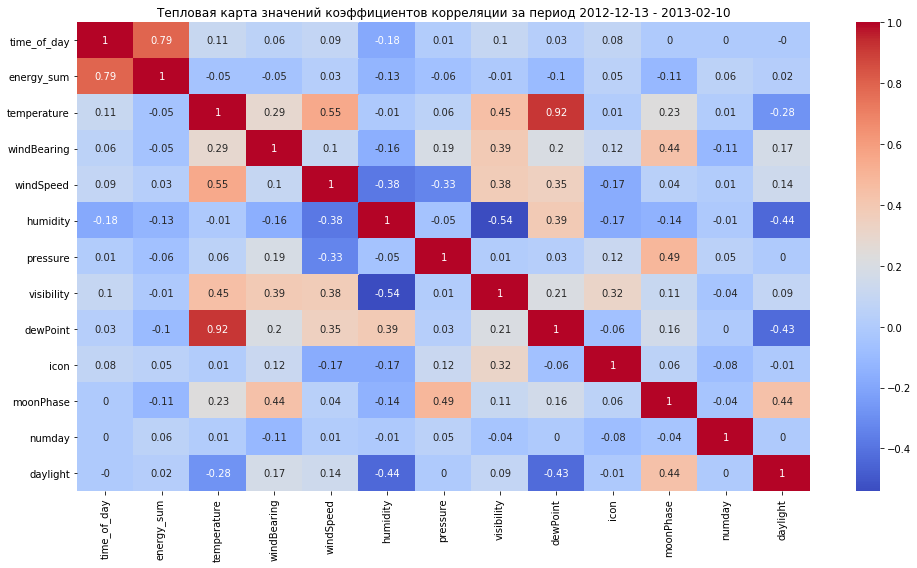

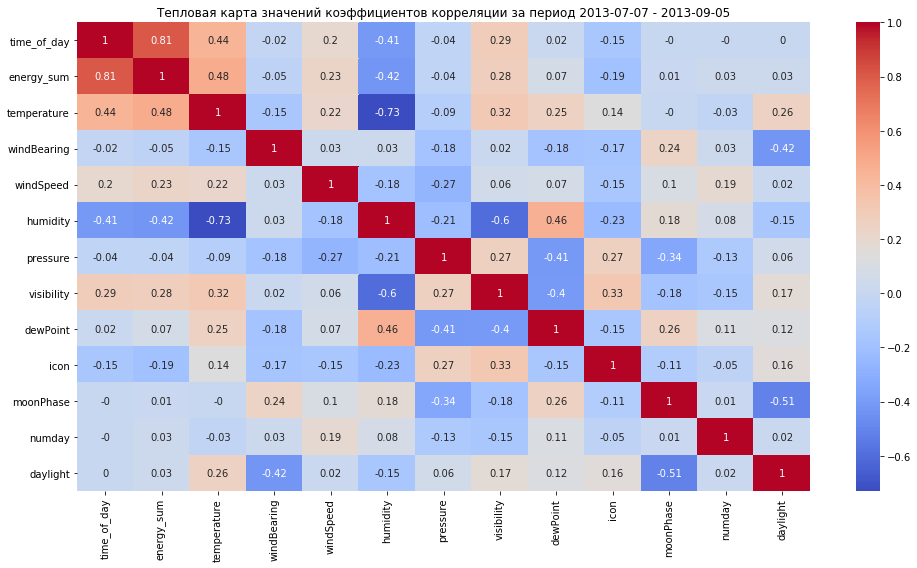

Коэффициенты корреляции в период Максимального энергопотребления:
          param  energy_sum
0   time_of_day        0.79
1      humidity       -0.13
2     moonPhase       -0.11
3      dewPoint       -0.10
4      pressure       -0.06
5        numday        0.06
6   temperature       -0.05
7   windBearing       -0.05
8          icon        0.05
9     windSpeed        0.03
10     daylight        0.02
11   visibility       -0.01

Коэффициенты корреляции в период Минимального энергопотребления:
          param  energy_sum
12  time_of_day        0.81
13  temperature        0.48
14     humidity       -0.42
15   visibility        0.28
16    windSpeed        0.23
17         icon       -0.19
18     dewPoint        0.07
19  windBearing       -0.05
20     pressure       -0.04
21       numday        0.03
22     daylight        0.03
23    moonPhase        0.01



In [47]:
# матрицы корреляции за два синодических месяца в период максимального и минимального энергопотребления
# на всем датасете получасовых данных. Для уменьшения датафрейма суммируем энергопотребление за час,
# чтобы объединить с часовыми данными о погоде, добавим день недели и длительность светового дня: 
# блок grafic5_3.py

# датафрейм с коэффициентами корреляции энергопотребления
df_c_matrix = pd.DataFrame(columns=['param', 'moonPhase', 'bdate', 'energy_sum', 'absv'])

# чтение дневных данных о погоде
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")
df_wd = df_wd.sort_values(by='time').reset_index()
df_wd.fillna(value=0, inplace=True)  # заполнение отсутствующих значений нулями
# метеоусловия, которые могут влиять на энергопотребление
name_cols = ['time', 'cloudCover', 'sunriseTime', 'sunsetTime', 'moonPhase']
df_wd = df_wd[name_cols]
# в колонке 'day' оставить только дату и преобразовать в строку, т.к. все даты в датасете загружаются как строки
df_wd['day'] = pd.to_datetime(df_wd.time).dt.strftime("%Y-%m-%d")
df_wd['numday'] = pd.to_datetime(df_wd.time).dt.weekday + 1
# вычисление длительности светового дня и удаление временных колонок
df_wd['sethm'] = pd.to_datetime(df_wd.sunsetTime).dt.hour + pd.to_datetime(df_wd.sunsetTime).dt.minute / 60
df_wd['risehm'] = pd.to_datetime(df_wd.sunriseTime).dt.hour + pd.to_datetime(df_wd.sunriseTime).dt.minute / 60
df_wd['daylight'] = df_wd.sethm - df_wd.risehm
df_wd.drop(['sethm', 'risehm'], axis=1, inplace=True)
# print(df_wd.columns.values)

# чтение подготовленных данных энергопотребления
df_phh = pd.read_csv(os.path.join(path_dataset, 'all_form_pay_hh.csv'))
# замена получасовых значений времени, чтобы после сгруппировать данные с часовым интервалом
df_phh.time = df_phh.time.str.replace(':30', ':00')
form_pay_hh = [name_col.replace('_Std', '') for name_col in df_phh.columns.values if name_col.endswith('_Std')]
# print(form_pay_hh)

# чтение часовых данных о погоде
df_hd = pd.read_csv(os.path.join(path_dataset, 'weather_hourly_darksky.csv'), encoding="cp1252")

num_days = 3  # количество дней для выборки данных
periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
for num_graf in range(2):
    # num_graf = 0  #период отбора данных с высоким энергопотреблением (возьмем 2 периода цикла луны)
    # num_graf = 1  #период отбора данных с низким энергопотреблением (возьмем 2 периода цикла луны)
    bdate = periodsr[3 * num_graf]
    edate = periodsr[3 * num_graf + 2]
    # print(bdate, edate)

    # данные о погоде за выбранный период c необходимыми колонками
    # метеоусловия, которые могут влиять на энергопотребление
    name_cols = ['time', 'temperature', 'windBearing', 'windSpeed', 'humidity', 'pressure',
                 'visibility', 'dewPoint', 'icon']
    df_wh = df_hd.query('time >= @bdate & time < @edate')[name_cols].sort_values(by='time')
    df_wh['day'] = pd.to_datetime(df_wh.time).dt.strftime("%Y-%m-%d")
    # замена стандартизованного словесного описания погодных условий на числовой эквивалент
    df_wh.icon = df_wh.icon.str.replace('-cloudy-', '-cloud-')
    list_icon = ['dummy', 'fog', 'wind', 'cloudy', 'partly-cloud-night', 'partly-cloud-day', 'clear-day']
    for num_icon in range(1, 7):
        df_wh.icon = df_wh.icon.str.replace(list_icon[num_icon], str(num_icon))
    df_wh.icon = pd.to_numeric(df_wh.icon, errors='coerce')
    # заполнение колонки вида "%Y-%m-%d %H:%M"
    df_wh['day_time'] = df_wh.time.str.slice(stop=16)
    df_wh.drop('time', axis=1, inplace=True)
    # print(df_wh.columns.values)
    name_cols = ['day', 'moonPhase', 'numday', 'daylight']
    df = df_wd.query('day >= @bdate & day < @edate')[name_cols].sort_values(by='day')
    df_wh = pd.merge(df_wh, df, on='day', how='left')
    # print(df_wh)

    # энергопотребление за заданный период
    df = df_phh.query('day >= @bdate and day < @edate')
    # сгруппировать данные с часовым интервалом
    df = df.groupby(['day', 'time']).sum()
    # заполнение колонки вида "%Y-%m-%d %H:%M"
    df['ind'] = df.index
    df['day_time'] = df.ind.apply(lambda x: x[0] + ' ' + x[1])
    # возвращение колонок дата и время
    df['day'] = df.day_time.apply(lambda x: x.split()[0])
    df['time'] = df.day_time.apply(lambda x: x.split()[1])
    df.drop('ind', axis=1, inplace=True)
    # суммирование значений по датчикам разной формы оплаты
    for house in form_pay_hh:
        name_cols = [house + '_' + LCL for LCL in ['ToU', 'Std']]
        # df[house] = df[name_cols].sum(axis=1)
        # df[hh] = df.apply(lambda row: row[name_cols].sum(), axis=1)
        # выдает ошибку: SettingWithCopyWarning:
        # A value is trying to be set on a copy of a slice from a DataFrame.
        # Try using .loc[row_indexer,col_indexer] = value instead
        # делаем через временный датафрейм
        # временный датафрейм с суммой среднего потребления энергии по всем домам по дням
        tmp_sum = pd.DataFrame(df[name_cols].sum(axis=1))
        tmp_sum.columns = [house]
        # получение датафрейма с суммой потребления энергии
        df = pd.merge(df, tmp_sum, left_index=True, right_index=True)

    df = pd.merge(df, df_wh, on='day_time', how='left')
    df['time_of_day'] = df.time.apply(lambda t: int(t.split(':')[0]) + int(t.split(':')[1]) / 30 * 0.5)
    name_cols_w = ['temperature', 'windBearing', 'windSpeed', 'humidity', 'pressure', 'visibility', 'dewPoint',
                   'icon', 'moonPhase', 'numday', 'daylight']

    # сумма по всем домам
    name_cols = [house for house in form_pay_hh]
    tmp_sum = pd.DataFrame(df[name_cols].sum(axis=1))
    tmp_sum.columns = ['energy_sum']
    # получение датафрейма с суммой потребления энергии
    df = pd.merge(df, tmp_sum, left_index=True, right_index=True)

    name_cols = ['day_time', 'time_of_day', 'energy_sum'] + name_cols_w
    # расчет матрицы корреляции
    dfc = df[name_cols].corr().fillna(0).round(2)
    #
    house = 'all_summ'
    # просмотр Тепловая карта значений коэффициентов корреляции
    fig, ax = plt.subplots(figsize=(14, 8))
    ax.set_title(u'Тепловая карта значений коэффициентов корреляции за период {} - {}'.format(bdate, edate[:10]))
    sns.heatmap(dfc, annot=True, cmap='coolwarm')
    fig.tight_layout()
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'4_6_cor_{bdate}_{house}.png'))
    plt.show()
    #
    # посмотрим на влияние мереоусловий на энергопотребление
    sr = sort_corh(dfc, 'energy_sum')
    # сохранение в файл датафрейма с коэффициентами влияющими на энергопотребление
    list_corr = pd.DataFrame(sr)
    # заполнение датафрейма с корреляционными коэффициентами для энергопотребления
    list_corr['absv'] = np.abs(list_corr['energy_sum'])  # добавление колонки с абсолютным значением
    list_corr['param'] = list_corr.index
    list_corr['house'] = house
    list_corr['bdate'] = bdate
    df_c_matrix = df_c_matrix.append(list_corr, ignore_index=True, sort=False)

# преобразование из датафрейма матриц строки по moonPhase в соответствующие колонки
df_c_matrix['season'] = df_c_matrix.bdate.apply(lambda x: 0 if x < "2013-06-01" else 1)
df_c_matrix.drop(['bdate'], axis=1, inplace=True)  # удаление колонки
name_cols = list(df_c_matrix.house.unique())
seasons = ['Максимального', 'Минимального']
for num_season in range(2):
    df = df_c_matrix.query('season == @num_season')
    df = df[['param', 'energy_sum']]
    df.to_csv(os.path.join(path_dataset, 'export', f'df_46_season_{num_season}.csv'))
    print(f'Коэффициенты корреляции в период {seasons[num_season]} энергопотребления:')
    print(df)
    print()

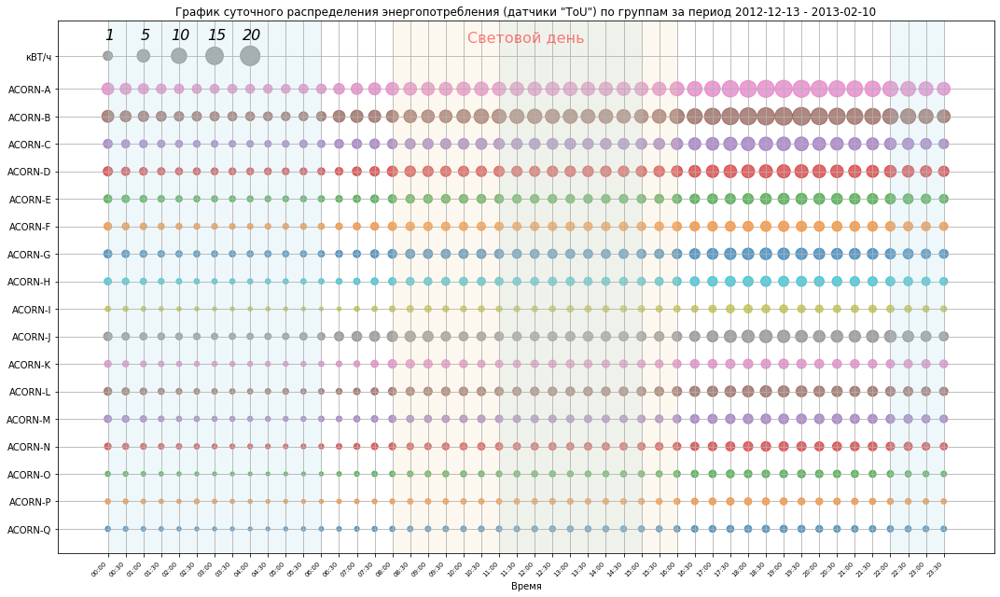

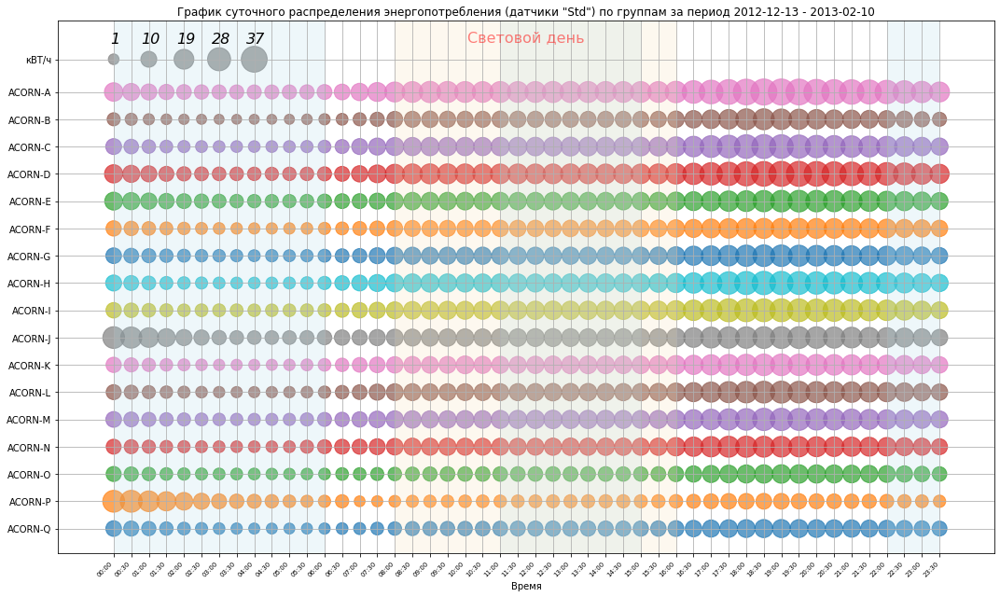

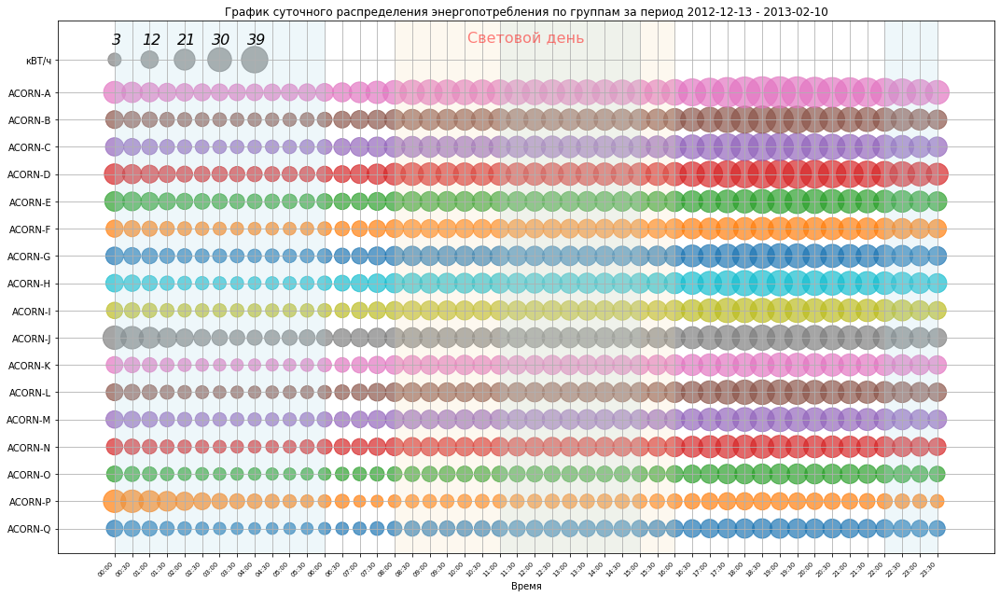

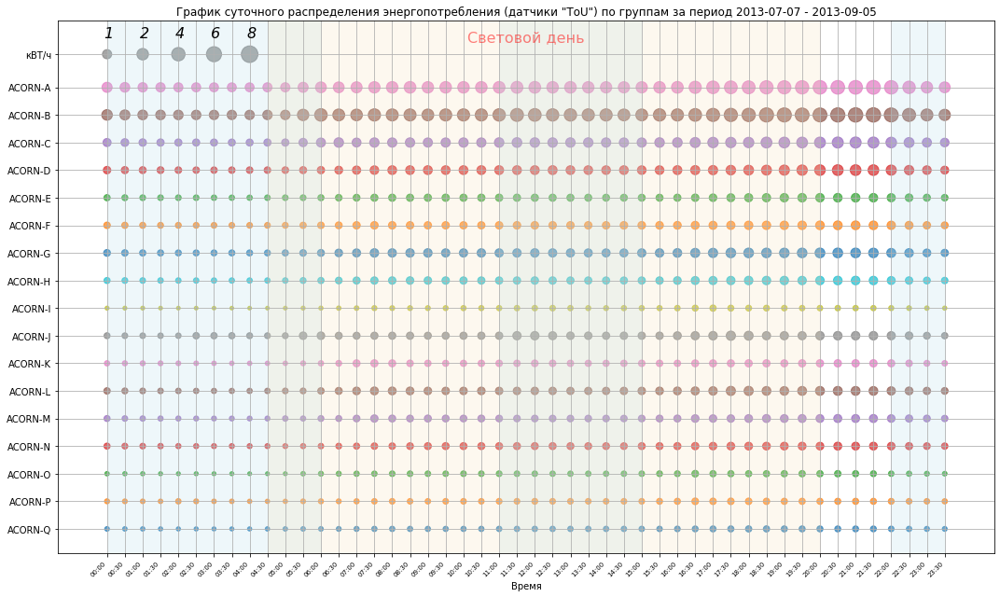

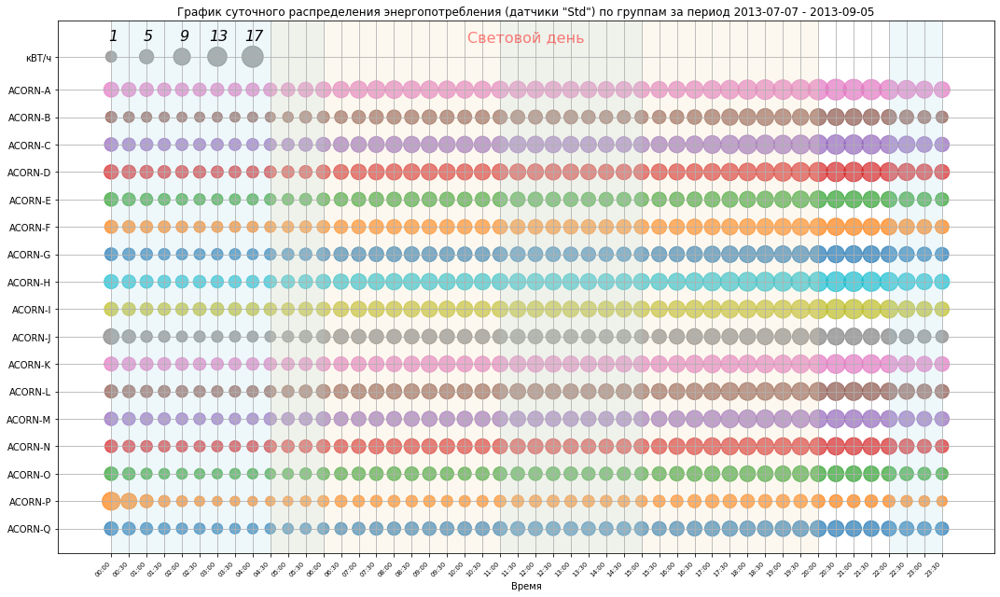

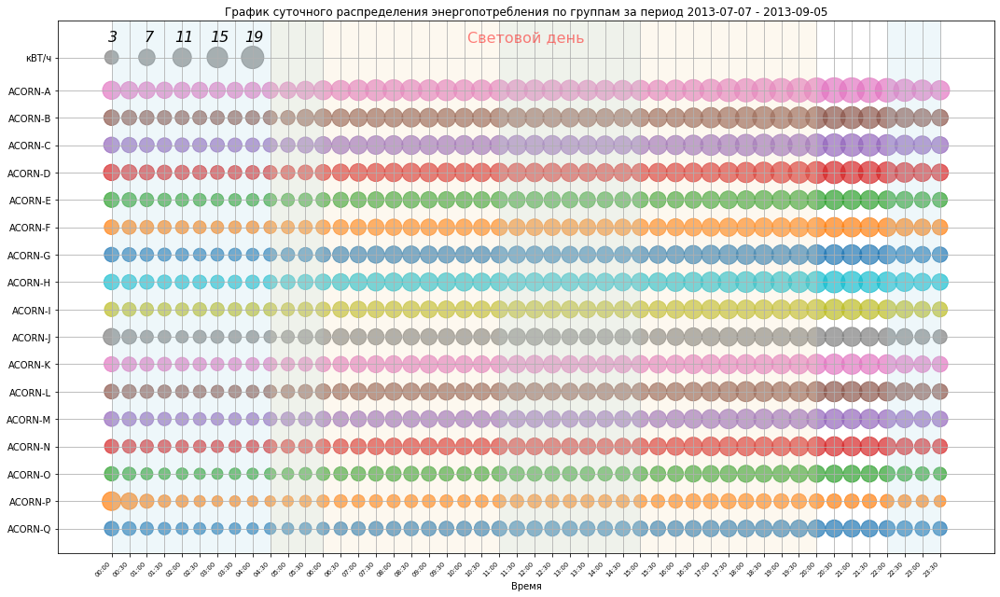

In [48]:
# График суточного распределения энергопотребления по группам: блок grafic5_4.py

def show_grafic5_4(bdate, edate, koeff_df, LCL='', list_rise_set=[]):
    type_LCL = {'_ToU': '(датчики "ToU") ', '_Std': '(датчики "Std") ', '': ''}
    # периоды времени дешевого тарифа
    low_rate = ['00:00', '06:00', '11:00', '15:00', '22:00', '23:30']
    # Max Min значения для окружности
    if LCL:
        name_cols = [name_col for name_col in df.columns.values if name_col.endswith(LCL)]
    else:
        name_cols = form_pay_hh
    max_a = ceil(df[name_cols].max().max() / koeff_df)
    min_a = floor(df[name_cols].min().min() / koeff_df)
    # print(min_a, max_a)
    # отображение графика
    fig, ax = plt.subplots(figsize=(15, 9))
    ax.set_title(u'График суточного распределения энергопотребления {}по группам за период {} - {}'
                 .format(type_LCL[LCL], bdate, edate))
    ax.set_xlabel(u'Время', fontsize=10)
    ax.set_ylabel('')
    x = df.time.to_list()
    nf = []     # текстовые метки по оси У
    ind = 0
    lst_e = [i for i in range(min_a, max_a, int((max_a-min_a)/4))]
    # если минимум округлился до нуля - запишем 1
    if lst_e[0] < 1:
        lst_e.pop(0)
        lst_e.insert(0, 1)
    for name_group, name_cols in sorted(dct_acorn['Acorn'].items(), reverse=True):
        y = [ind for _ in range(len(x))]
        name_cols = [house + LCL for house in name_cols]
        area = df[name_cols].mean(axis=1).round(1).to_list()
        plt.scatter(x, y, s=area, alpha=0.7)
        nf.append(name_group)
        ind += 1
    # что-то вроде легенды
    a = np.arange(min_a*koeff_df+100, max_a*koeff_df+100, int((max_a-min_a)*koeff_df/8))
    y = [ind + 0.2 for _ in range(len(x))]
    area = []
    for i in range(5):
        ax.text(0.1 + 2 * i, 18.2, lst_e[i], fontsize=16, style='oblique', ha='center', va='top')
        area.append(a[i])
        area.append(0)
    for i in range(len(area), 48):
        area.append(0)
    scatter = ax.scatter(x, y, s=area, alpha=0.7)
    nf.append('кBT/ч')
    #
    # выделение периодов низкого тарифа
    for i in range(3):
        plt.axvspan(low_rate[2*i], low_rate[2*i+1], color='lightblue', alpha=0.2)
    # выделение светового дня
    if len(list_rise_set):
        plt.axvspan(list_rise_set[0], list_rise_set[1], color='wheat', alpha=0.2)
        plt.text(0.5, 0.97, u'Световой день',
                 horizontalalignment='center',
                 verticalalignment='center',
                 fontsize=16, color='red', alpha=0.5,
                 transform=ax.transAxes)
    yticks = list(range(ind))
    yticks.append(ind + 0.2)
    ax.set_yticks(yticks)
    ax.set_yticklabels(nf)
    ax.grid()
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=7)
    fig.tight_layout()
    plt.savefig(os.path.join(path_dataset, 'png', f'5_4_{bdate}_{edate}{LCL}.png'))
    plt.show()


# чтение подготовленных данных энергопотребления
df_phh = pd.read_csv(os.path.join(path_dataset, 'all_form_pay_hh.csv'))
# колонки с именами домов
form_pay_hh = [name_col.replace('_Std', '') for name_col in df_phh.columns.values if name_col.endswith('_Std')]
# print(form_pay_hh)

# чтение дневных данных о погоде
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")

periodsr = ['2012-12-13', '2013-01-12', '2013-02-10', '2013-07-07', '2013-08-06', '2013-09-05']
koeff_df = [33, 40]       # множители для увеличения диаметра окружности в разные периоды
for num_graf in range(2):
    # num_graf = 0  #период отбора данных с высоким энергопотреблением (возьмем 2 периода цикла луны)
    # num_graf = 1  #период отбора данных с низким энергопотреблением (возьмем 2 периода цикла луны)
    bdate = periodsr[3 * num_graf]
    edate = periodsr[3 * num_graf + 2]
    # print(bdate, edate)

    # энергопотребление за заданный период
    df = df_phh.query('day >= @bdate and day < @edate')
    # просуммировать данные по дню и времени суток
    df = df.groupby(['day', 'time']).sum().reset_index()
    # сгруппировать данные по времени суток
    df = df.groupby(['time']).mean().reset_index()

    # запись времени восхода/захода солнца в переводе на получасовые интервалы
    list_rise_set = get_rise_set(df_wd, bdate, edate, list_rs=True)

    # суммирование значений по датчикам разной формы оплаты
    for house in form_pay_hh:
        for LCL in ['ToU', 'Std']:
            df[house + '_' + LCL] = df[house + '_' + LCL] * koeff_df[num_graf]
        name_cols = [house + '_' + LCL for LCL in ['ToU', 'Std']]
        df[house] = df[name_cols].sum(axis=1).round(1)
    # построение графков по разным формам оплаты
    for LCL in ['_ToU', '_Std', '']:
        show_grafic5_4(bdate, edate, koeff_df[num_graf], LCL=LCL, list_rise_set=list_rise_set)


['block_71', 'block_72', 'block_73', 'block_91', 'block_92', 'block_93']


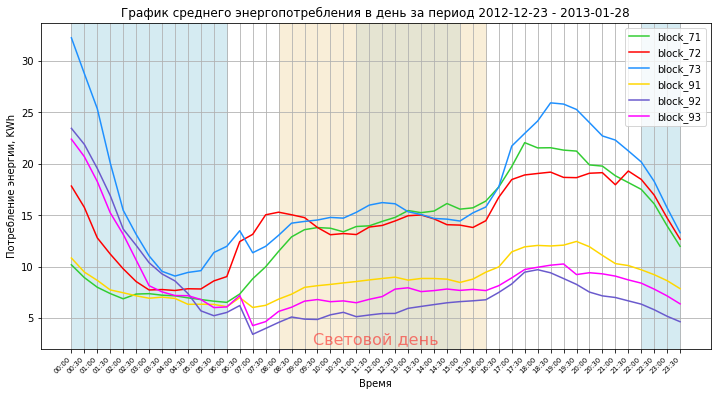

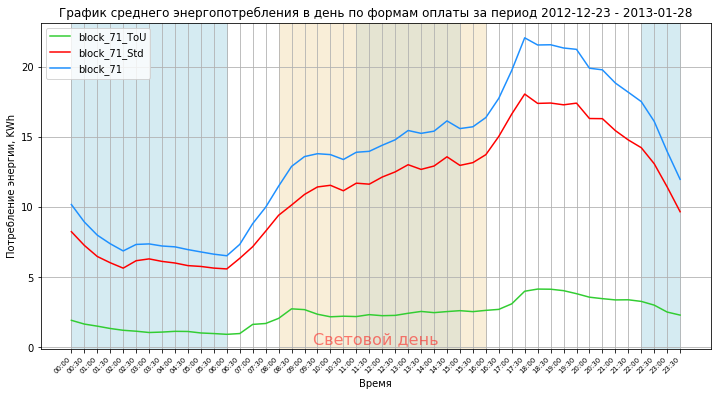

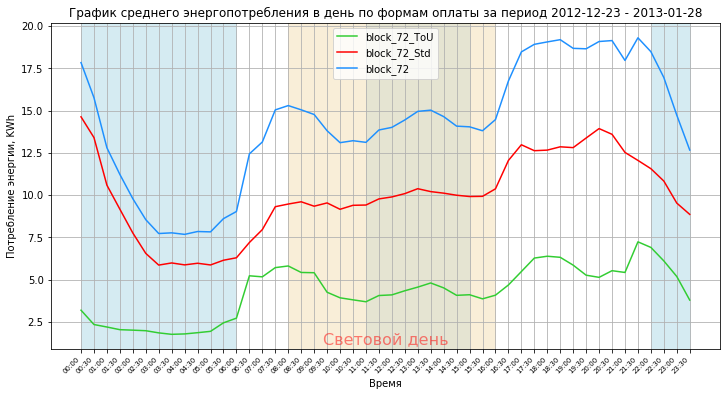

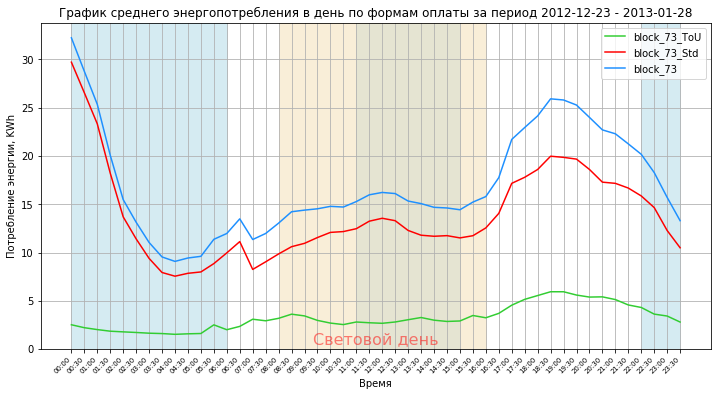

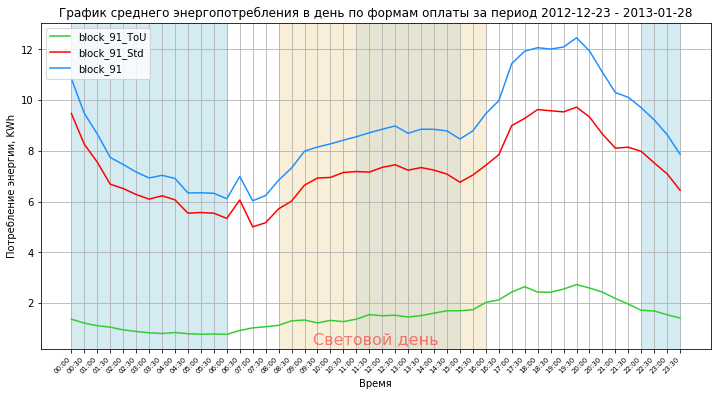

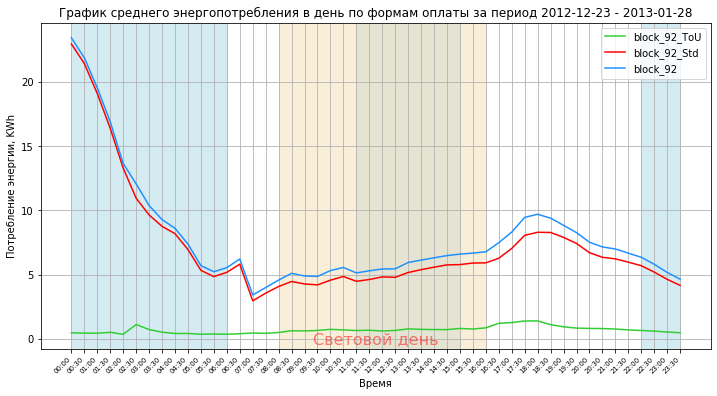

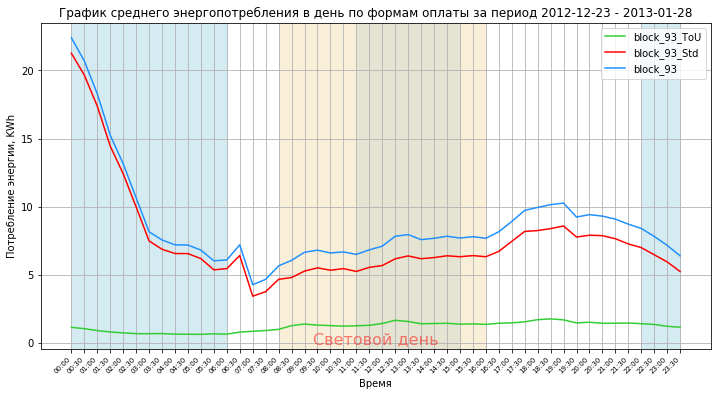

Период 2012-12-23 - 2013-01-28
дом block_71 отношение Std / ToU = 4.8
дом block_72 отношение Std / ToU = 2.3
дом block_73 отношение Std / ToU = 4.3
дом block_91 отношение Std / ToU = 4.7
дом block_92 отношение Std / ToU = 10.5
дом block_93 отношение Std / ToU = 6.3


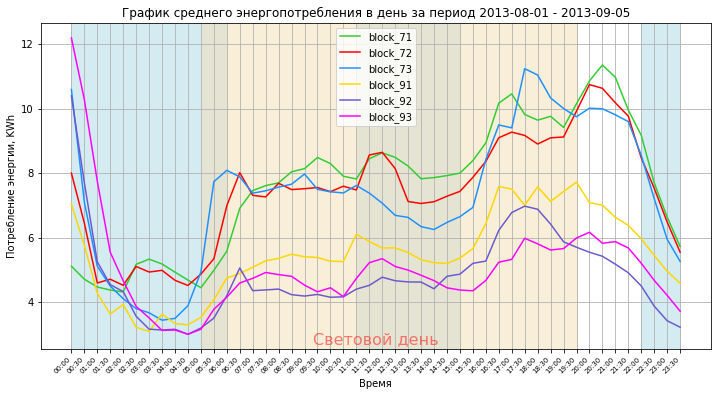

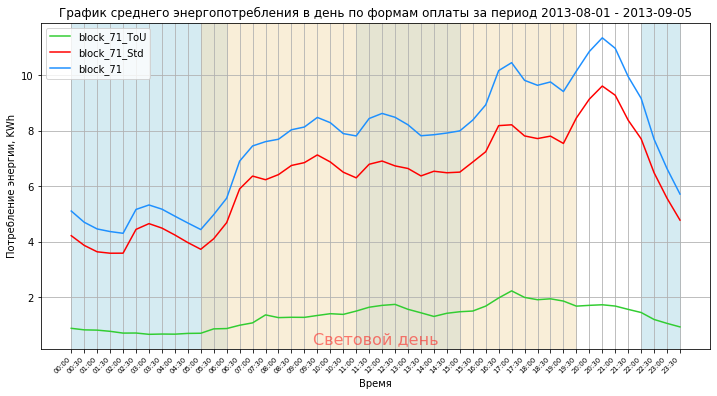

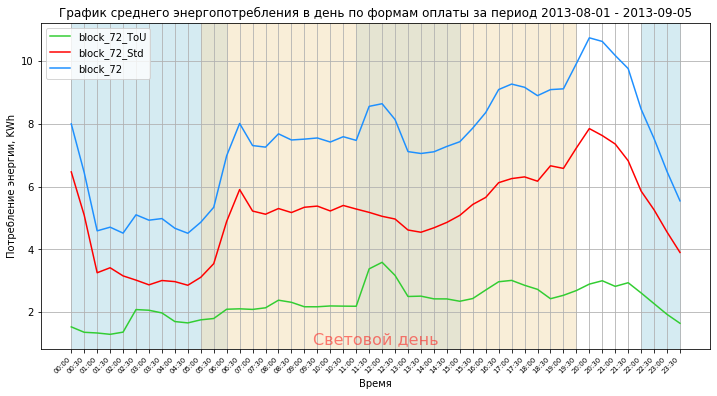

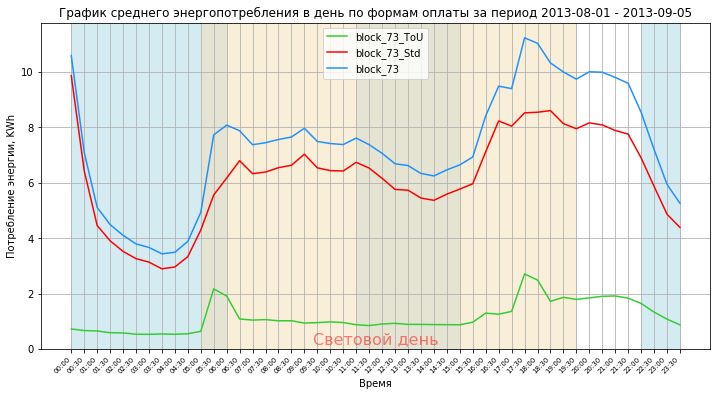

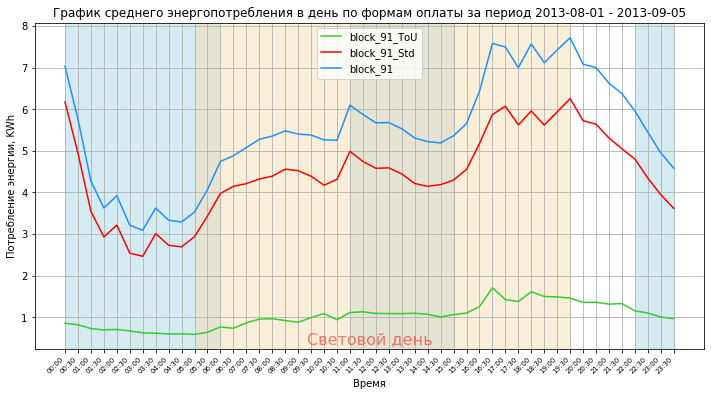

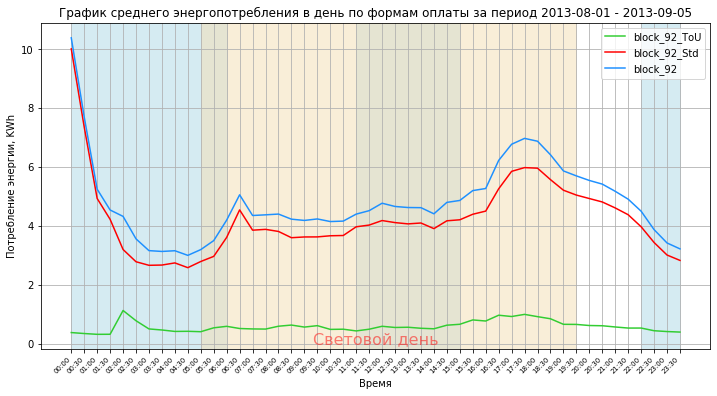

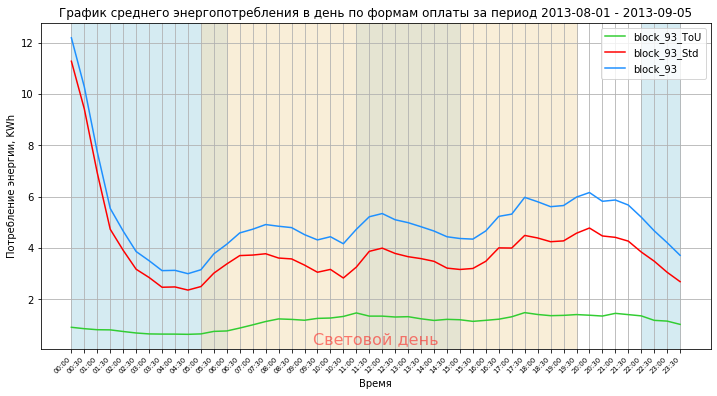

Период 2013-08-01 - 2013-09-05
дом block_71 отношение Std / ToU = 4.8
дом block_72 отношение Std / ToU = 2.2
дом block_73 отношение Std / ToU = 5.4
дом block_91 отношение Std / ToU = 4.3
дом block_92 отношение Std / ToU = 7.3
дом block_93 отношение Std / ToU = 3.5


In [49]:
# распределение энергопотребления по времени суток: блок grafic5_5.py (как grafic4_2.py)
# только дома взяты из конкретных групп и используется датасет по всем домам

form_pay_hh = sorted(dct_acorn['Acorn']['ACORN-J'])
form_pay_hh.extend(sorted(dct_acorn['Acorn']['ACORN-P']))
print(form_pay_hh)

# чтение дневных данных о погоде
df_wd = pd.read_csv(os.path.join(path_dataset, 'weather_daily_darksky.csv'), encoding="cp1252")


def show_block_day(sdf, ttl, pnf, list_rise_set=[]):
    # периоды времени дешевого тарифа
    low_rate = ['00:00', '06:00', '11:00', '15:00', '22:00', '23:30']
    # отображение графика
    colours = ['limegreen', 'red', 'dodgerblue', 'gold', 'slateblue', 'magenta', 'b', 'g', 'y', 'cyan']
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.set_title(ttl[0])
    x = sdf.index.to_list()
    for i in range(len(sdf.columns.values)):
        name_id = sdf.columns.values[i]
        y = sdf[name_id].to_list()
        ax.plot(x, y, color=colours[i], label=name_id.replace('_summ', ''))
    ax.grid()
    ax.set_xlabel(ttl[1], fontsize=10)
    ax.set_ylabel(ttl[2], fontsize=10)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=7)
    plt.legend()
    # выделение периодов низкого тарифа
    for i in range(3):
        plt.axvspan(low_rate[2*i], low_rate[2*i+1], color='lightblue', alpha=0.5)
    # выделение светового дня
    if len(list_rise_set):
        plt.axvspan(list_rise_set[0], list_rise_set[1], color='wheat', alpha=0.5)
        plt.text(0.5, 0.03, u'Световой день',
                 horizontalalignment='center',
                 verticalalignment='center',
                 fontsize=16, color='red', alpha=0.5,
                 transform=ax.transAxes)
    # сохранение картинки
    plt.savefig(os.path.join(path_dataset, 'png', f'5_{pnf}.png'))
    plt.show()


# чтение подготовленных данных
df_phh = pd.read_csv(os.path.join(path_dataset, 'all_form_pay_hh.csv'))

periodys = ['2012-10-01', '2014-02-01', '2012-12-23', '2013-01-28', '2013-08-01', '2013-09-05']
for num_graf in range(1, 3):
    # num_graf == 0 график за год
    # num_graf == 1 график за период мах энергопотребления
    # num_graf == 2 график за период мin энергопотребления

    bdate = periodys[2 * num_graf]
    edate = periodys[2 * num_graf + 1]
    df = df_phh.query('day >= @bdate and day < @edate')

    # запись времени восхода/захода солнца в переводе на получасовые интервалы
    list_rise_set = get_rise_set(df_wd, bdate, edate, list_rs=True)

    t_sum = df.groupby(['time']).mean()
    t_sum = t_sum.sort_values(by=['time'])
    # суммирование значений по датчикам разной формы оплаты
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std']]
        t_sum[f'{hh}_summ'] = t_sum[name_cols].sum(axis=1)
    # сумма по типам датчиков по всем домам на одном графике
    ttl = [u'График среднего энергопотребления в день за период {} - {}'.format(bdate, edate),
           u'Время', u'Потребление энергии, KWh']
    name_cols = [name_col for name_col in t_sum.columns.values if name_col.endswith('_summ')]
    show_block_day(t_sum[name_cols], ttl, f'{bdate}_5_summ', list_rise_set)
    # распределение по типам датчиков по каждому дому на одном графике
    ttl = [u'График среднего энергопотребления в день по формам оплаты за период {} - {}'.format(bdate, edate),
           u'Время', u'Потребление энергии, KWh']
    # строим график по одному дому (на график наложить время восхода-заката)
    for hh in form_pay_hh:
        name_cols = [hh + '_' + LCL for LCL in ['ToU', 'Std', 'summ']]  # колонки для отображения
        show_block_day(t_sum[name_cols], ttl, f'{bdate}_5_{hh}', list_rise_set)
    print(f'Период {bdate} - {edate}')
    for hh in form_pay_hh:
        print(f"дом {hh} отношение Std / ToU = {round(t_sum[hh + '_Std'].sum() / t_sum[hh + '_ToU'].sum(), 1)}")
